# Online Local Adaptive Model - Notebook 3_1

* Prior Probability Shift is one of the common problems encountered in Machine Learning algortihms.   
* There are some approaches for dealing with this problem in a 'static' scenario. But there are situations in which we need a model which deals with secvential data as input (e.g. a server which gets input from different users, with different data distributions).   
* In this project, we try to build a model which self adapts its predictions based on the local label distribution. 

### About notebook 3_1

In this notebook we address the problem of Prior Probability Shift. In Experiment 1 we test that imposing the real priors helps.

## Notebook setup and data preparation

### Notebook setup

In [1]:
from IPython.core.display import display, HTML
from IPython.display import Image
display(HTML("<style>.container { width:100% !important; }</style>"))
%matplotlib inline
# %matplotlib qt
%load_ext autoreload
%autoreload 2

### Imports

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tensorflow as tf
import time
from collections import deque
import os
import pickle
from training_plotter import TrainingPlotter
from dataset import MNISTDataset
from utils import Utils
from lenet5 import Lenet5
from lenet5_with_distr import Lenet5WithDistr
import PIL.Image

# numpy print options
np.set_printoptions(linewidth = 150)
np.set_printoptions(edgeitems = 10)
# np.set_printoptions(precision=3)
# pd.set_option('display.precision', 3)

### Set seed

In [4]:
# create a random generator using a constant seed in order to reproduce results
seed = 112358
nprg = np.random.RandomState(seed)

### Import MNIST dataset

In [5]:
MNIST_TRAIN_IMAGES_FILEPATH = 'MNIST_dataset/train-images.idx3-ubyte'
MNIST_TRAIN_LABELS_FILEPATH = 'MNIST_dataset/train-labels.idx1-ubyte'
MNIST_TEST_IMAGES_FILEPATH = 'MNIST_dataset/t10k-images.idx3-ubyte'
MNIST_TEST_LABELS_FILEPATH = 'MNIST_dataset/t10k-labels.idx1-ubyte'

mnist_ds = MNISTDataset(MNIST_TRAIN_IMAGES_FILEPATH, MNIST_TRAIN_LABELS_FILEPATH, MNIST_TEST_IMAGES_FILEPATH, MNIST_TEST_LABELS_FILEPATH)


### Use a subset of  MNIST dataset

In [5]:
mnist_subset = MNISTDataset(MNIST_TRAIN_IMAGES_FILEPATH, MNIST_TRAIN_LABELS_FILEPATH, MNIST_TEST_IMAGES_FILEPATH, MNIST_TEST_LABELS_FILEPATH)
SUBSET_SIZE = 10000
mnist_subset.impose_distr_on_train_dataset(subset_size=SUBSET_SIZE, weights = [0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1])
print(np.sum(mnist_subset.train.images))
print(mnist_subset.summary)

1032086.8716514301

        training data set: images = (10000, 28, 28, 1), labels = (10000, 10), distr = [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
        validation data set: images = (6000, 28, 28, 1), labels = (6000, 10), distr = [0.104 0.109 0.095 0.098 0.097 0.092 0.097 0.106 0.098 0.105]
        testing data set: images = (10000, 28, 28, 1), labels = (10000, 10), distr = [0.098 0.114 0.103 0.101 0.098 0.089 0.096 0.103 0.097 0.101]
        


In [91]:
def restore_and_test_a_model_on_a_mnist_subset(mnist_subset, ckpt_dir, ckpt_filemame, plot_filename):
    print('Restoring model from {}{}'.format(ckpt_dir, ckpt_filemame))
    restored_distr_pos = Utils.restore_variable_from_checkpoint(ckpt_dir=ckpt_dir, ckpt_file=ckpt_filemame, var_name = 'distr_pos')
    if restored_distr_pos is None:
        restored_distr_pos = [False, False, False, False, False]
    restored_model = Lenet5WithDistr(mnist_dataset=mnist_ds, verbose=False, distr_pos=restored_distr_pos)
    restored_model.restore_session(ckpt_dir=ckpt_dir, ckpt_filename=ckpt_filemame)
    train_distr = restored_model.session.run(restored_model.train_distr)
    test_loss, test_acc, total_predict, total_actual, wrong_predict_images, total_softmax_output_probs = restored_model.test_data(mnist_subset.test)

    print('test_loss = {:.4f}, test_acc = {:.4f} ({}/{})'.format(test_loss, test_acc, mnist_subset.test.num_examples - len(wrong_predict_images), mnist_subset.test.num_examples))
    
    # sort wrong_predict_images by target label
    correct_predict = total_predict[total_actual == total_predict]
    wrong_predict = total_predict[total_actual != total_predict]
    wrong_predict_softmax_output_probs = total_softmax_output_probs[total_actual != total_predict]
    wrong_actual = total_actual[total_actual != total_predict]
    wrong_predict_images = np.array(wrong_predict_images)
    wrong_predict_images_sorted = wrong_predict_images[wrong_actual.argsort(), ]
    wrong_predict_images_sorted = [image for image in wrong_predict_images_sorted]

    count_figures = 6
    fig = plt.figure(figsize=(30, 3))
    fig.suptitle(y = 1.1, t = 'test_acc = {:.4f} ({}/{})'.format(test_acc, mnist_subset.test.num_examples - len(wrong_predict_images), mnist_subset.test.num_examples), fontsize=18, fontweight='bold')

    k = 1
    plt.subplot(1,count_figures, k)
    plt.bar(range(10), train_distr)
    plt.xticks(range(0, 10))
    plt.title('train label distr')
    
    k+=1
    plt.subplot(1,count_figures, k)
    plt.bar(range(10), mnist_subset.test.label_distr)
    plt.xticks(range(0, 10))
    plt.title('test label distr')

    k+=1
    plt.subplot(1,count_figures, k)
    plt.hist(correct_predict, bins=np.arange(11), rwidth=0.8, normed=False)
    plt.xticks(range(0, 10))
    plt.title('correct predicted label distr')
    
    k+=1
    plt.subplot(1,count_figures, k)
    plt.hist(wrong_predict, bins=np.arange(11), rwidth=0.8, normed=False)
    plt.xticks(range(0, 10))
    plt.title('wrong predicted label distr')
    
    k+=1
    plt.subplot(1,count_figures, k)
    plt.hist(wrong_actual, bins=np.arange(11), rwidth=0.8, normed=False)
    plt.xticks(range(0, 10))
    plt.title('wrong actual label distr')
    
    k+=1
    plt.subplot(1,count_figures, k)
    plt.bar(range(0, 10), np.average(wrong_predict_softmax_output_probs, axis=0))
    plt.xticks(range(0, 10))
    plt.title('average of wrong actual softmax output probabilities')

    plt.savefig(os.path.join(ckpt_dir, plot_filename))
    plt.show()


# Experiment 1 -  Adjusting outputs using real priors


- use models that were trained in Notebook2 for exemplify the prior probability shift issue 
- adapt their output probabilities using the below formula
- check performance differences

---

Formula for corrected a posteriori probabilities:

\begin{equation}
 \large
 \hat{p}(\omega_{i}|\mathrm{x})=\frac{\frac{\hat{p}(\omega_{i})}{\hat{p}_{t}(\omega_{i})}\hat{p}_{t}(\omega_{i}|\mathrm{x})}{\sum_{j=1}^{n}\frac{\hat{p}(\omega_{j})}{\hat{p}_{t}(\omega_{j})}\hat{p}_{t}(\omega_{j}|\mathrm{x})}
\end{equation}

- $\hat{p}(\omega_{i}|\mathrm{x})$ = corrected a posteriori probabilities
- $\hat{p}_{t}(\omega_{i}|\mathrm{x})$ = a posteriori probabilities (as provided by the trained model) 
- $\hat{p}(\omega_{i})$ = the new priors
- $\hat{p}_{t}(\omega_{i})$ = old priors

The denominator ensures that the corrected a posteriori probabilities sum to one.

---
### - restore some models  that were trained in Notebook2 for exemplify the prior probability shift issue
---

Restoring model 0 from Lenet5_with_imposed_distr_0_5000samples_2018_05_07---11_45.model.ckpt
The restored model 0 was trained using distr: [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]



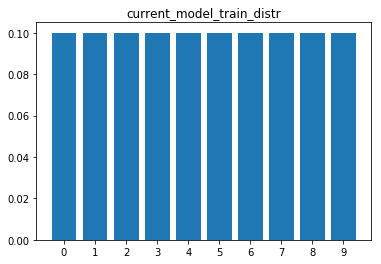

Restoring model 1 from Lenet5_with_imposed_distr_1_5000samples_2018_05_07---11_48.model.ckpt
The restored model 1 was trained using distr: [0.016  0.0322 0.0644 0.129  0.2588 0.258  0.129  0.0644 0.0322 0.016 ]



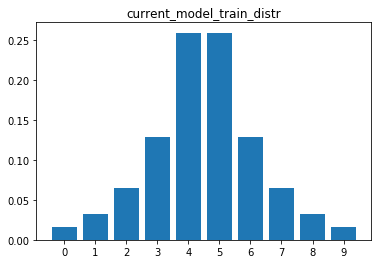

Restoring model 2 from Lenet5_with_imposed_distr_2_5000samples_2018_05_07---11_52.model.ckpt
The restored model 2 was trained using distr: [0.0632 0.1264 0.2542 0.1788 0.1264 0.0894 0.0632 0.0446 0.0316 0.0222]



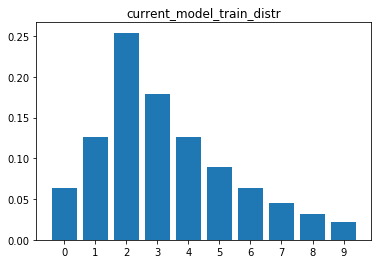

Restoring model 3 from Lenet5_with_imposed_distr_3_5000samples_2018_05_07---11_55.model.ckpt
The restored model 3 was trained using distr: [0.0222 0.0316 0.0446 0.0632 0.0894 0.1264 0.1788 0.2542 0.1264 0.0632]



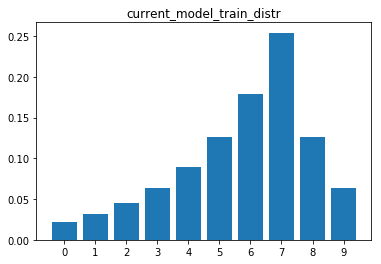

Restoring model 4 from Lenet5_with_imposed_distr_4_5000samples_2018_05_07---11_58.model.ckpt
The restored model 4 was trained using distr: [0.05 0.1  0.2  0.1  0.05 0.05 0.1  0.2  0.1  0.05]



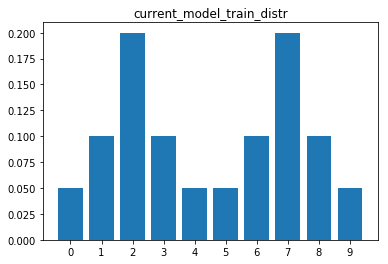

Restoring model 5 from Lenet5_with_imposed_distr_5_5000samples_2018_05_07---12_01.model.ckpt
The restored model 5 was trained using distr: [0.1368 0.194  0.0968 0.0484 0.0242 0.0242 0.0484 0.0968 0.1936 0.1368]



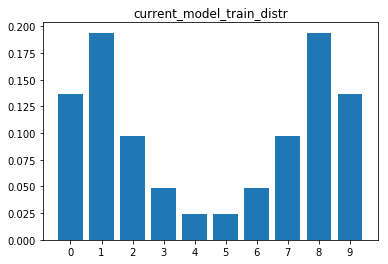

Restoring model 6 from Lenet5_with_imposed_distr_6_5000samples_2018_05_07---12_05.model.ckpt
The restored model 6 was trained using distr: [0.0142 0.02   0.028  0.0392 0.055  0.077  0.1078 0.1508 0.2112 0.2968]



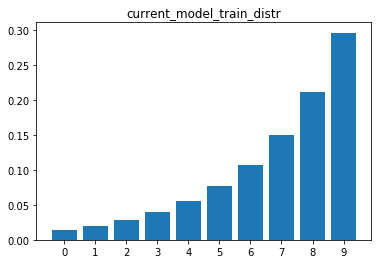

Restoring model 7 from Lenet5_with_imposed_distr_7_5000samples_2018_05_07---12_08.model.ckpt
The restored model 7 was trained using distr: [0.2968 0.2112 0.1508 0.1078 0.077  0.055  0.0392 0.028  0.02   0.0142]



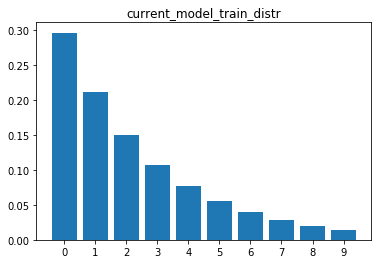

In [6]:
# WORK_DIR = "./results/PriorProbabilityShift_experiment_5_10000samples/"
WORK_DIR = "./results/PriorProbabilityShift_experiment_5_5000samples/"
ckpt_file_list = Utils.get_all_files_from_dir_ending_with(WORK_DIR, "ckpt.meta", without_file_extension=True)
perf_dict = {'idx_model':[], 'idx_distr':[], 'test_loss':[], 'test_acc':[], 'total_predict':[], 'total_actual':[], 'train_distr':[], 'test_distr':[], 'ckpt_file':[]}

# build a list with all ditributions considered in training phase
distrs_used_for_training = []
for idx_model, ckpt_file in enumerate(ckpt_file_list):
    print('Restoring model {} from {}'.format(idx_model, ckpt_file))
    temp_model = Lenet5(mnist_dataset=mnist_ds, display_summary=False)
    temp_model.restore_session(ckpt_dir=WORK_DIR, ckpt_filename=ckpt_file)
    current_model_train_distr = temp_model.session.run(temp_model.train_distr)
    distrs_used_for_training.append(current_model_train_distr)   
    print('The restored model {} was trained using distr: {}\n'.format(idx_model, current_model_train_distr))
    plt.bar(range(0, 10), current_model_train_distr)
    plt.xticks(range(0, 10))
    plt.title('current_model_train_distr')
    plt.show()

---
### - apply the correction on all output probabilities and check if there is any improvement; save the results
---

In [10]:
perf_dict = {'idx_model':[], 'idx_distr':[], 'test_loss':[], 'test_acc':[], 'adj_test_acc':[], 'total_predict':[], 'adj_total_predict':[], 'total_actual':[], 
             'correct_predicted_distr':[], 'wrong_predicted_distr':[], 'wrong_actual_distr':[],
             'adj_correct_predicted_distr':[], 'adj_wrong_predicted_distr':[], 'adj_wrong_actual_distr':[],
             'train_distr':[], 'test_distr':[], 'ckpt_file':[]}

for idx_model, ckpt_file in enumerate(ckpt_file_list):
    print('Restoring model {}{} {}'.format(WORK_DIR, idx_model, ckpt_file))
    test_model = Lenet5(mnist_dataset=mnist_ds, verbose=False)
    test_model.restore_session(ckpt_dir=WORK_DIR, ckpt_filename=ckpt_file)
    test_model_train_distr = test_model.session.run(test_model.train_distr)
    print('The restored model was trained using distr: {}\n'.format(test_model_train_distr))
    
    for idx_distr, distr in enumerate(distrs_used_for_training):
        print('Train distr: {}'.format(test_model_train_distr))
        print('Test distr: {}'.format(distr))
        
        mnist_ds = MNISTDataset(MNIST_TRAIN_IMAGES_FILEPATH, MNIST_TRAIN_LABELS_FILEPATH, MNIST_TEST_IMAGES_FILEPATH, MNIST_TEST_LABELS_FILEPATH)
        mnist_ds.impose_distribution(weights=distr, global_max_weight=np.max(distrs_used_for_training))
        test_loss, test_acc, total_predict, total_actual, wrong_predict_images, output_probs = test_model.test_data(mnist_ds.test, use_only_one_batch=True)
#         print('test_loss = {:.3f}, test_acc = {:.3f} ({}/{})'.format(test_loss, test_acc, mnist_ds.test.num_examples - len(wrong_predict_images), mnist_ds.test.num_examples))
        # analyze error distribution
#         restore_and_test_a_model_on_a_mnist_subset(mnist_ds, ckpt_dir=ckpt_dir, ckpt_filemame=ckpt_file, plot_filename = 'test_model')

        perf_dict['idx_model'].append(idx_model)
        perf_dict['idx_distr'].append(idx_distr)
        perf_dict['test_loss'].append(test_loss)
        perf_dict['test_acc'].append(test_acc)
        perf_dict['total_predict'].append(total_predict)
        perf_dict['total_actual'].append(total_actual)
        correct_predict = total_predict[total_actual == total_predict]
        wrong_predict = total_predict[total_actual != total_predict]
        wrong_actual = total_actual[total_actual != total_predict]
        perf_dict['correct_predicted_distr'].append(np.histogram(correct_predict)[0])
        perf_dict['wrong_predicted_distr'].append(np.histogram(wrong_predict)[0])
        perf_dict['wrong_actual_distr'].append(np.histogram(wrong_actual)[0])
        perf_dict['train_distr'].append(test_model_train_distr)
        perf_dict['test_distr'].append(mnist_ds.test.label_distr)
        perf_dict['ckpt_file'].append(ckpt_file)
        
        # adjust the outputs
        real_priors = mnist_ds.test.label_distr
        old_priors = test_model_train_distr
        print('real priors = {}'.format(real_priors))
        print('old prios   = {}'.format(old_priors))
        adj_output_probs = (real_priors / old_priors) * output_probs / (np.sum((real_priors / old_priors) * output_probs, axis = 1)[:, None])
        adj_total_predict = np.argmax(adj_output_probs, axis=1)
        count_correct_predicted = np.sum(total_predict == total_actual)
        print('Old accuracy: {:.3f} ({}/{})'.format(count_correct_predicted / mnist_ds.test.num_examples, count_correct_predicted, mnist_ds.test.num_examples))
        count_correct_predicted = np.sum(adj_total_predict == total_actual)
        print('New accuracy: {:.3f} ({}/{})'.format(count_correct_predicted / mnist_ds.test.num_examples, count_correct_predicted, mnist_ds.test.num_examples))
        
        # save the results into dictionary
        adj_test_acc = np.sum(adj_total_predict == total_actual) / len(adj_total_predict)
        adj_correct_predict = adj_total_predict[total_actual == adj_total_predict]
        adj_wrong_predict = adj_total_predict[total_actual != adj_total_predict]
        adj_wrong_actual = total_actual[total_actual != adj_total_predict]
        perf_dict['adj_test_acc'].append(adj_test_acc)
        perf_dict['adj_total_predict'].append(adj_total_predict)
        perf_dict['adj_correct_predicted_distr'].append(np.histogram(adj_correct_predict)[0])
        perf_dict['adj_wrong_predicted_distr'].append(np.histogram(adj_wrong_predict)[0])
        perf_dict['adj_wrong_actual_distr'].append(np.histogram(adj_wrong_actual)[0])
        
        print('\n\n\n')


# save the above results dictionary to file
filename = 'adj_results_{}.dict.pickle'.format(Utils.now_as_str())
full_filepath = os.path.join(WORK_DIR, filename)
filehandler = open(full_filepath, 'wb') 
pickle.dump(perf_dict, filehandler)
print('Results dictionary was succesfully saved to: {}'.format(full_filepath))
filehandler.close()


Restoring model ./results/PriorProbabilityShift_experiment_5_5000samples/0 Lenet5_with_imposed_distr_0_5000samples_2018_05_07---11_45.model.ckpt
The restored model was trained using distr: [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]

Train distr: [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
Test distr: [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
real priors = [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
old prios   = [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
Old accuracy: 0.971 (2912/3000)
New accuracy: 0.971 (2912/3000)




Train distr: [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
Test distr: [0.016 0.032 0.064 0.129 0.259 0.258 0.129 0.064 0.032 0.016]
real priors = [0.016 0.032 0.064 0.129 0.259 0.258 0.129 0.064 0.032 0.016]
old prios   = [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
Old accuracy: 0.975 (2926/3000)
New accuracy: 0.977 (2931/3000)




Train distr: [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
Test distr: [0.063 0.126 0.254 0.179 0.126 0.089 0.063 0.045 0.032 0.022]
real priors = [0.063 

real priors = [0.014 0.02  0.028 0.039 0.055 0.077 0.108 0.151 0.211 0.298]
old prios   = [0.063 0.126 0.254 0.179 0.126 0.089 0.063 0.045 0.032 0.022]
Old accuracy: 0.922 (2767/3000)
New accuracy: 0.949 (2847/3000)




Train distr: [0.063 0.126 0.254 0.179 0.126 0.089 0.063 0.045 0.032 0.022]
Test distr: [0.297 0.211 0.151 0.108 0.077 0.055 0.039 0.028 0.02  0.014]
real priors = [0.299 0.211 0.151 0.108 0.077 0.055 0.039 0.028 0.02  0.014]
old prios   = [0.063 0.126 0.254 0.179 0.126 0.089 0.063 0.045 0.032 0.022]
Old accuracy: 0.981 (2942/3000)
New accuracy: 0.982 (2946/3000)




Restoring model ./results/PriorProbabilityShift_experiment_5_5000samples/3 Lenet5_with_imposed_distr_3_5000samples_2018_05_07---11_55.model.ckpt
The restored model was trained using distr: [0.022 0.032 0.045 0.063 0.089 0.126 0.179 0.254 0.126 0.063]

Train distr: [0.022 0.032 0.045 0.063 0.089 0.126 0.179 0.254 0.126 0.063]
Test distr: [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
real priors = [0.1 0.1 0.1 0.1

real priors = [0.05 0.1  0.2  0.1  0.05 0.05 0.1  0.2  0.1  0.05]
old prios   = [0.137 0.194 0.097 0.048 0.024 0.024 0.048 0.097 0.194 0.137]
Old accuracy: 0.950 (2850/3000)
New accuracy: 0.960 (2879/3000)




Train distr: [0.137 0.194 0.097 0.048 0.024 0.024 0.048 0.097 0.194 0.137]
Test distr: [0.137 0.194 0.097 0.048 0.024 0.024 0.048 0.097 0.194 0.137]
real priors = [0.137 0.195 0.097 0.048 0.024 0.024 0.048 0.097 0.193 0.137]
old prios   = [0.137 0.194 0.097 0.048 0.024 0.024 0.048 0.097 0.194 0.137]
Old accuracy: 0.961 (2883/3000)
New accuracy: 0.961 (2883/3000)




Train distr: [0.137 0.194 0.097 0.048 0.024 0.024 0.048 0.097 0.194 0.137]
Test distr: [0.014 0.02  0.028 0.039 0.055 0.077 0.108 0.151 0.211 0.297]
real priors = [0.014 0.02  0.028 0.039 0.055 0.077 0.108 0.151 0.211 0.298]
old prios   = [0.137 0.194 0.097 0.048 0.024 0.024 0.048 0.097 0.194 0.137]
Old accuracy: 0.942 (2825/3000)
New accuracy: 0.950 (2851/3000)




Train distr: [0.137 0.194 0.097 0.048 0.024 0.024 0.

---
### - restore the results saved earlier and plot them
---

Results dictionary was succesfully restored from: adj_results_2018_05_20---09_22.dict.pickle


,idx_model,idx_distr,test_loss,test_acc,adj_test_acc
count,64.000,64.000,64.000,64.000,64.000
mean,3.500,3.500,0.110,0.972,0.977
std,2.309,2.309,0.047,0.010,0.006
min,0.000,0.000,0.053,0.937,0.959
25%,1.750,1.750,0.077,0.967,0.974
50%,3.500,3.500,0.101,0.975,0.978
75%,5.250,5.250,0.133,0.979,0.981
max,7.000,7.000,0.301,0.986,0.989


,idx_model,idx_distr,test_loss,test_acc,adj_test_acc,total_predict,adj_total_predict,total_actual,correct_predicted_distr,wrong_predicted_distr,wrong_actual_distr,adj_correct_predicted_distr,adj_wrong_predicted_distr,adj_wrong_actual_distr,train_distr,test_distr,ckpt_file
0,0,0,0.091,0.975,0.975,"[7.0, 3.0, 3.0, 0.0, 6.0, 7.0, 5.0, 9.0, 7.0, ...","[7, 3, 3, 0, 6, 7, 5, 9, 7, 7, 9, 6, 1, 3, 9, ...","[7.0, 3.0, 3.0, 6.0, 6.0, 7.0, 5.0, 9.0, 7.0, ...","[296, 295, 295, 294, 291, 295, 292, 288, 294, ...","[9, 6, 8, 8, 2, 7, 7, 3, 17, 8]","[4, 5, 5, 6, 9, 5, 8, 12, 6, 15]","[296, 295, 295, 294, 291, 295, 292, 288, 294, ...","[9, 6, 8, 8, 2, 7, 7, 3, 17, 8]","[4, 5, 5, 6, 9, 5, 8, 12, 6, 15]","[0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, ...","[0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, 0.1, ...",Lenet5_with_imposed_distr_0_10000samples_2018_...
1,0,1,0.084,0.978,0.981,"[5.0, 4.0, 4.0, 5.0, 5.0, 6.0, 5.0, 2.0, 6.0, ...","[5, 4, 4, 5, 5, 6, 5, 2, 6, 5, 8, 5, 3, 4, 7, ...","[5.0, 4.0, 4.0, 5.0, 5.0, 6.0, 5.0, 7.0, 6.0, ...","[48, 95, 191, 378, 757, 766, 377, 184, 93, 46]","[9, 5, 7, 3, 1, 5, 8, 1, 15, 11]","[1, 2, 9, 21, 0, 8, 10, 9, 3, 2]","[46, 95, 192, 379, 767, 766, 376, 185, 93, 45]","[6, 2, 9, 5, 3, 10, 7, 1, 9, 4]","[2, 1, 1, 8, 11, 8, 11, 8, 3, 3]","[0.0161, 0.0322, 0.0645, 0.129, 0.2584, 0.258,...","[0.016, 0.032, 0.06433333333333334, 0.129, 0.2...",Lenet5_with_imposed_distr_0_10000samples_2018_...
2,0,2,0.076,0.977,0.980,"[4.0, 2.0, 2.0, 4.0, 4.0, 5.0, 3.0, 7.0, 5.0, ...","[4, 2, 2, 4, 4, 5, 3, 7, 5, 4, 8, 4, 1, 2, 7, ...","[4.0, 2.0, 2.0, 4.0, 4.0, 5.0, 3.0, 7.0, 5.0, ...","[186, 372, 757, 521, 367, 263, 185, 126, 91, 64]","[9, 3, 10, 5, 2, 7, 6, 4, 14, 8]","[3, 7, 9, 15, 12, 5, 4, 8, 3, 2]","[186, 373, 763, 526, 369, 262, 184, 123, 91, 62]","[5, 3, 15, 11, 2, 7, 7, 1, 6, 4]","[3, 6, 3, 10, 10, 6, 5, 11, 3, 4]","[0.0632, 0.1265, 0.2537, 0.1789, 0.1265, 0.089...","[0.063, 0.12633333333333333, 0.255333333333333...",Lenet5_with_imposed_distr_0_10000samples_2018_...
3,0,3,0.092,0.976,0.980,"[7.0, 6.0, 6.0, 7.0, 7.0, 7.0, 6.0, 8.0, 7.0, ...","[7, 6, 6, 7, 7, 7, 6, 8, 7, 7, 9, 7, 3, 5, 8, ...","[7.0, 6.0, 6.0, 7.0, 7.0, 7.0, 6.0, 8.0, 7.0, ...","[66, 93, 133, 185, 260, 372, 524, 744, 372, 180]","[10, 6, 9, 9, 3, 6, 4, 1, 13, 10]","[1, 1, 4, 8, 0, 7, 12, 22, 7, 9]","[64, 93, 132, 183, 260, 372, 526, 757, 375, 177]","[8, 2, 5, 3, 2, 7, 5, 5, 19, 5]","[2, 1, 2, 6, 8, 7, 10, 9, 4, 12]","[0.0223, 0.0316, 0.0447, 0.0632, 0.0894, 0.126...","[0.022, 0.03133333333333333, 0.044666666666666...",Lenet5_with_imposed_distr_0_10000samples_2018_...
4,0,4,0.083,0.977,0.980,"[7.0, 3.0, 3.0, 7.0, 6.0, 7.0, 5.0, 8.0, 7.0, ...","[7, 3, 3, 7, 6, 7, 5, 8, 7, 7, 9, 7, 1, 2, 8, ...","[7.0, 3.0, 3.0, 7.0, 6.0, 7.0, 5.0, 8.0, 7.0, ...","[148, 295, 592, 294, 144, 147, 292, 579, 294, ...","[11, 5, 9, 9, 3, 5, 6, 2, 11, 9]","[2, 5, 8, 6, 6, 3, 8, 21, 6, 5]","[147, 295, 598, 295, 144, 146, 293, 587, 294, ...","[7, 3, 12, 7, 1, 4, 6, 4, 12, 4]","[3, 5, 2, 5, 6, 4, 7, 13, 6, 9]","[0.05, 0.1, 0.2, 0.1, 0.05, 0.05, 0.1, 0.2, 0....","[0.05, 0.1, 0.2, 0.1, 0.05, 0.05, 0.1, 0.2, 0....",Lenet5_with_imposed_distr_0_10000samples_2018_...


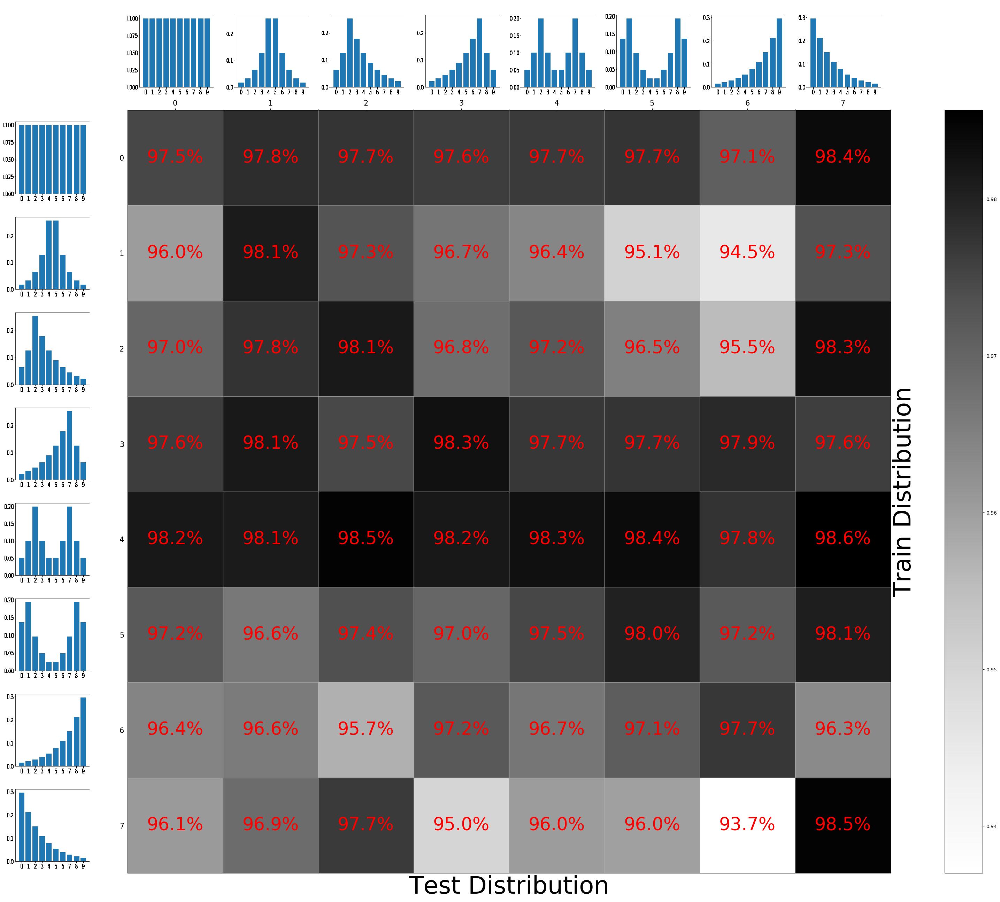

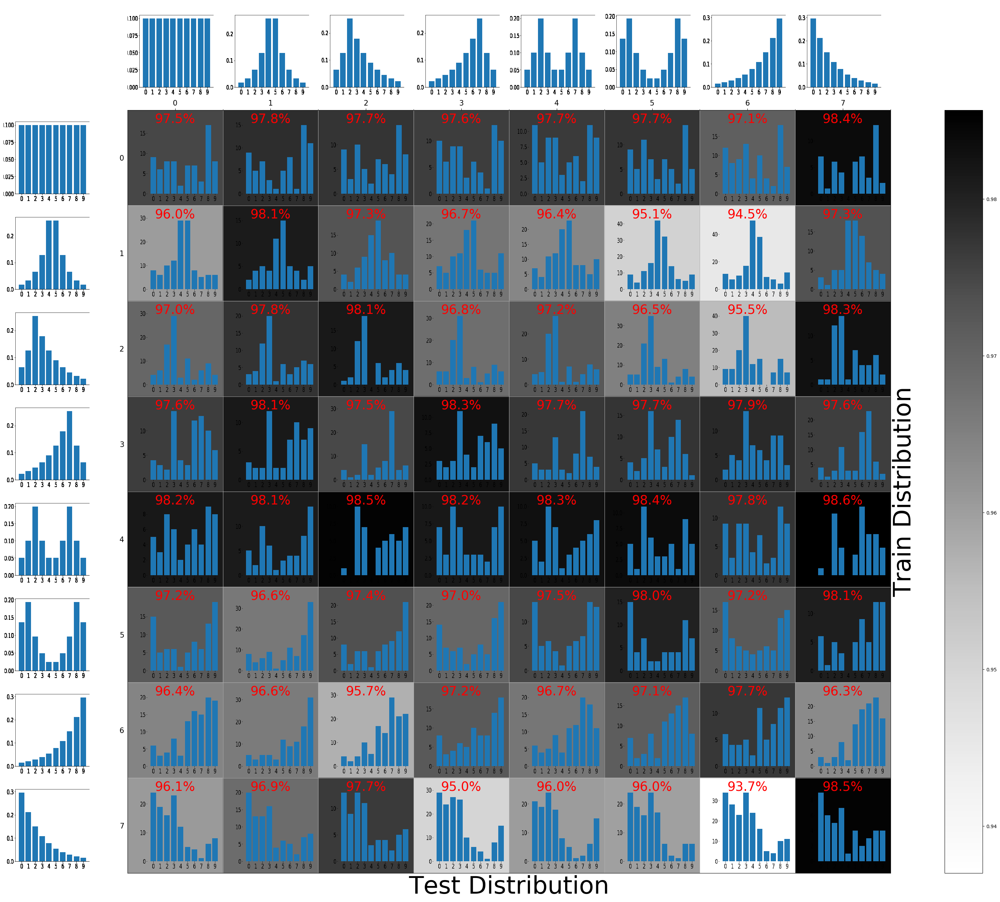

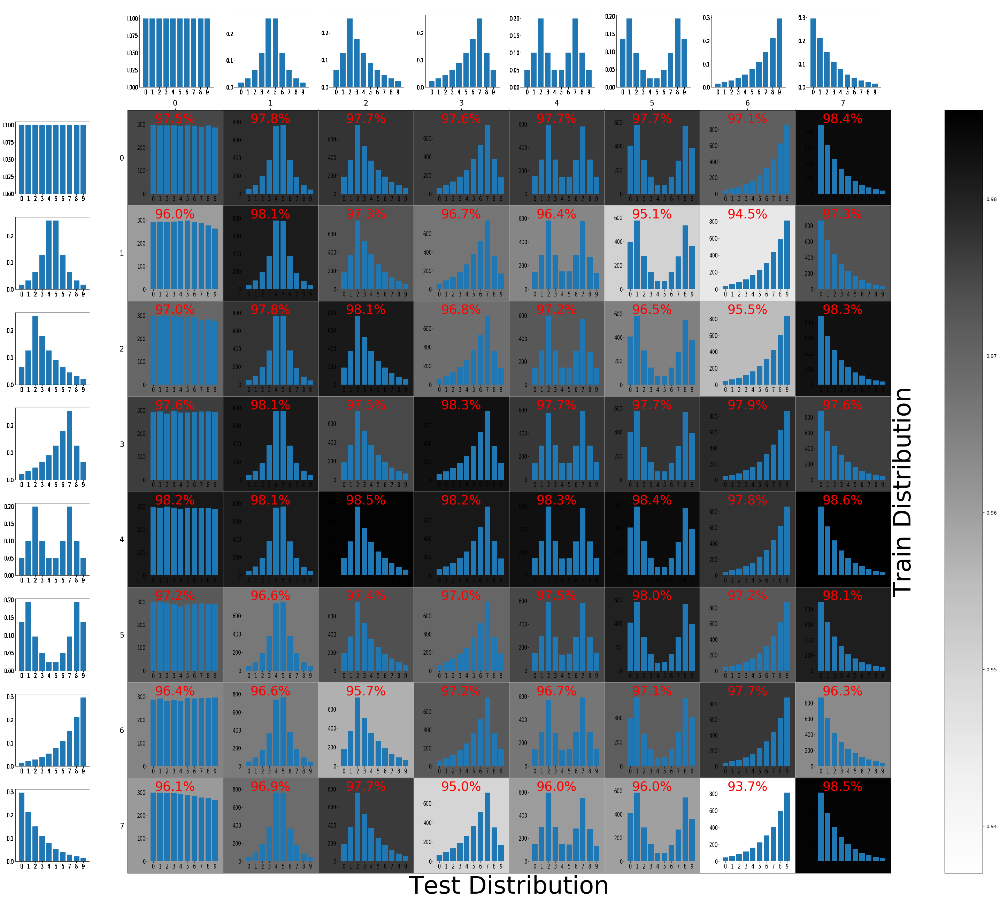

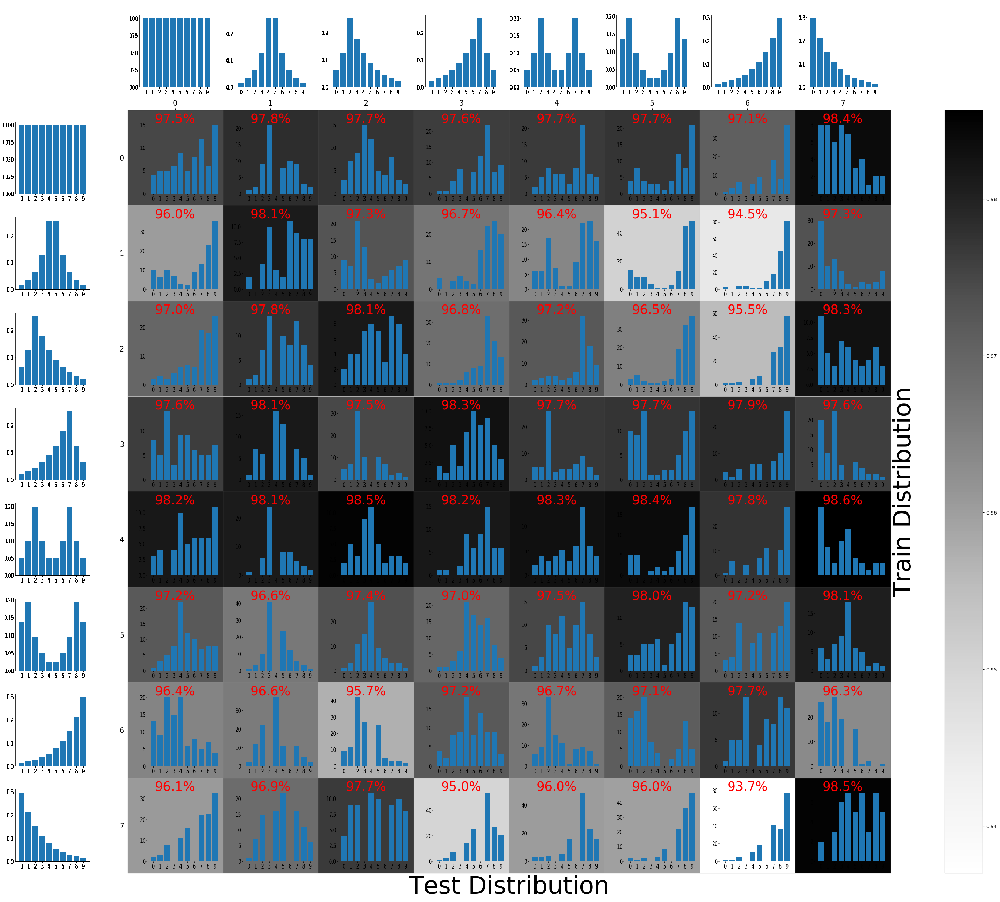

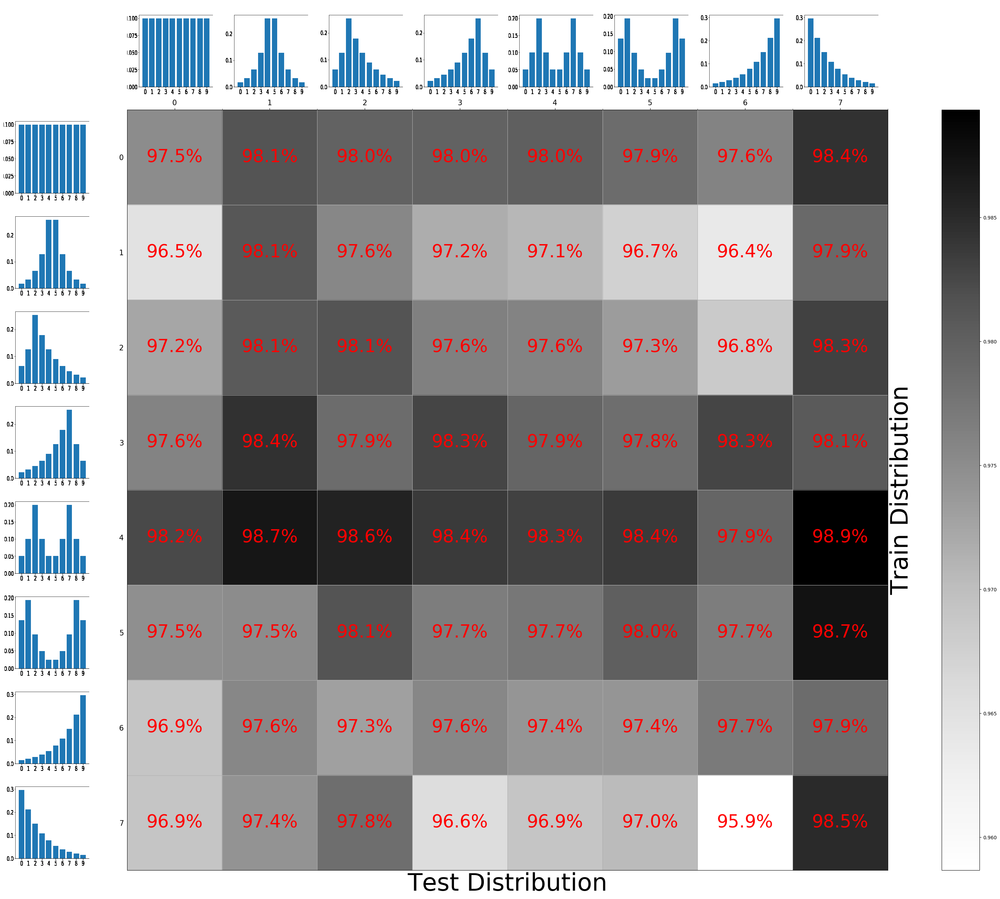

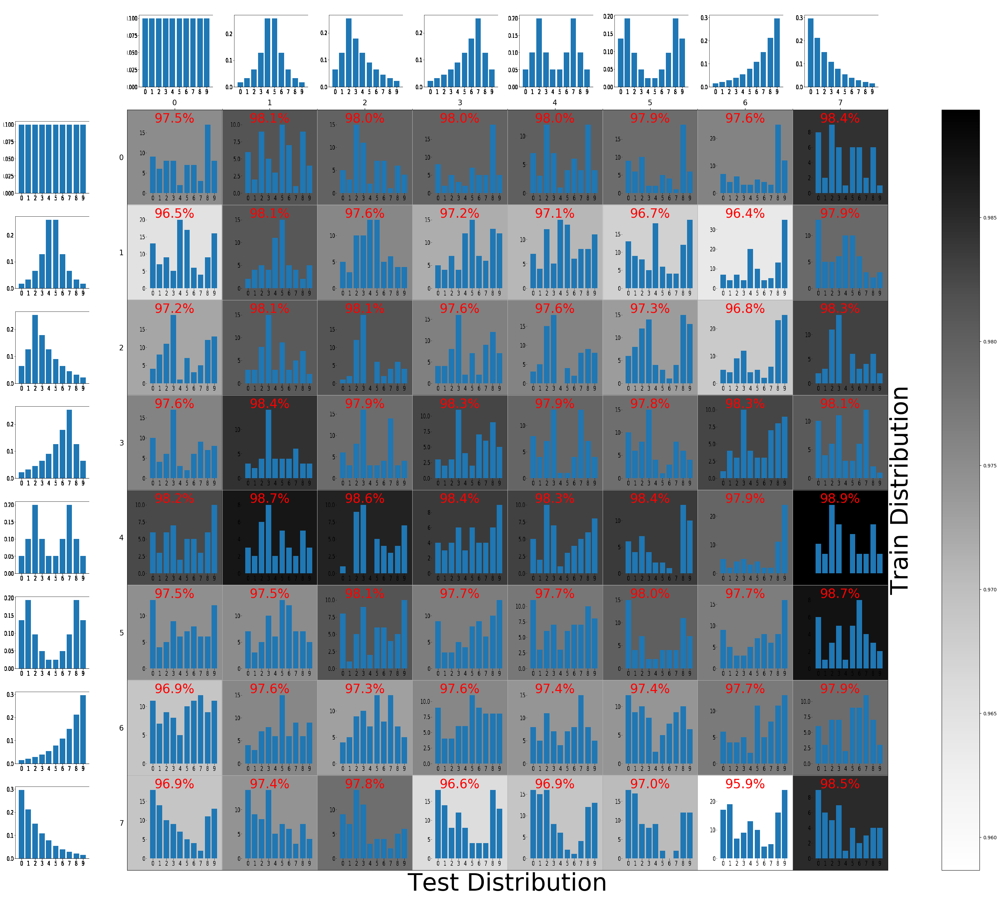

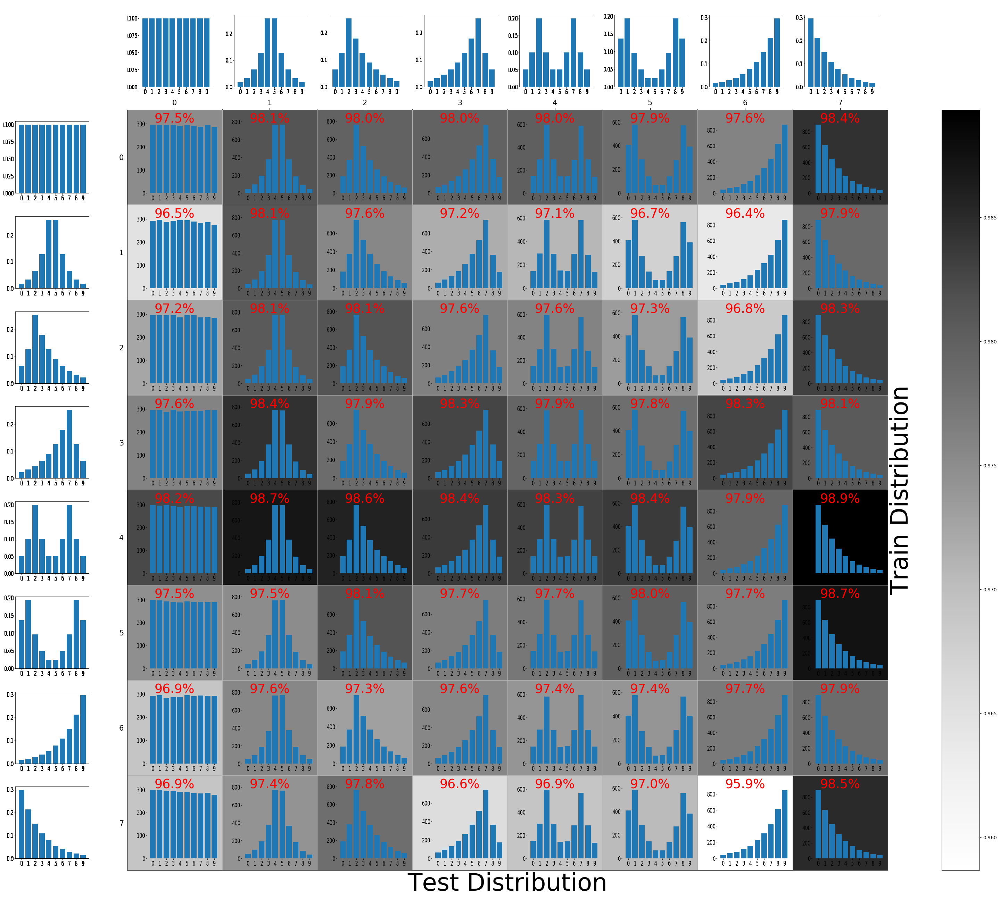

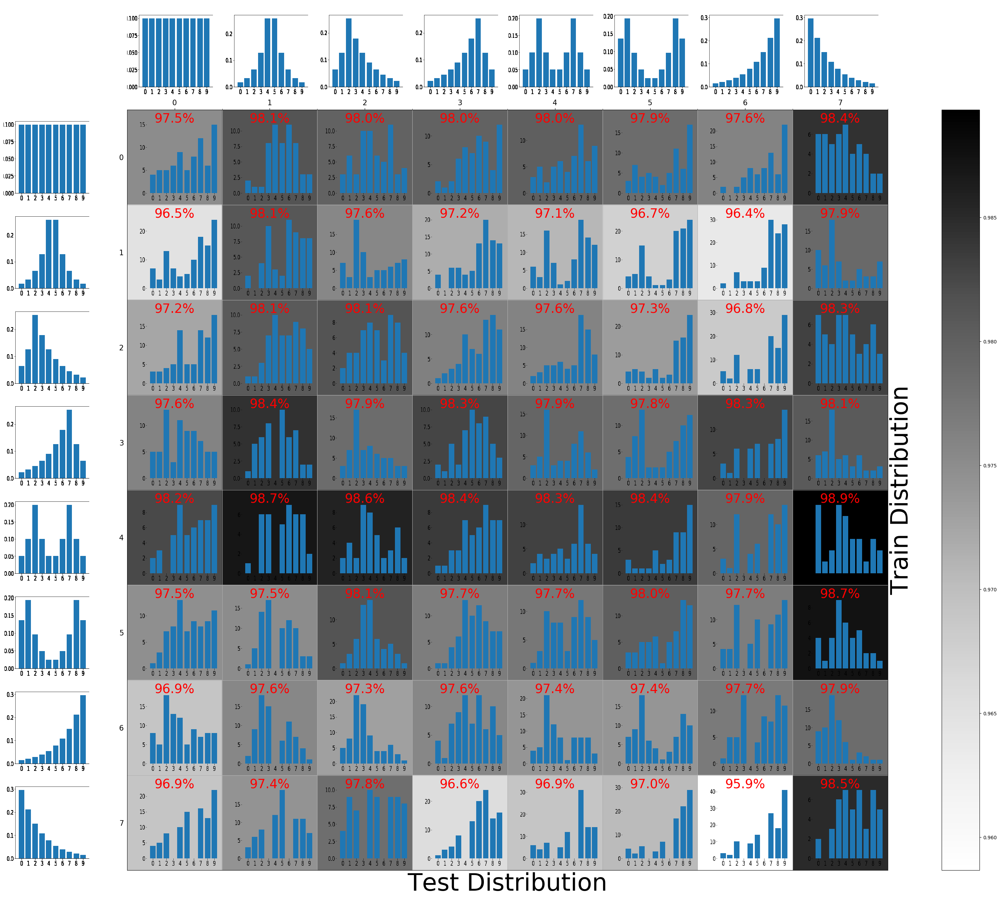

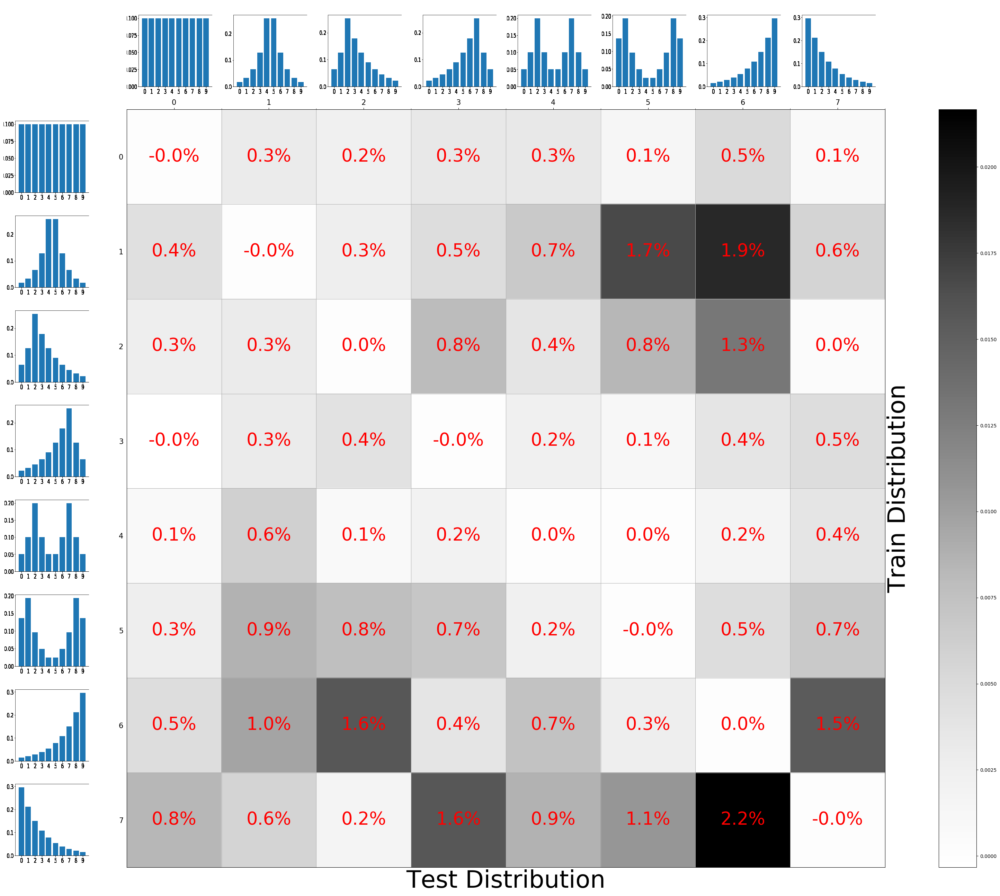

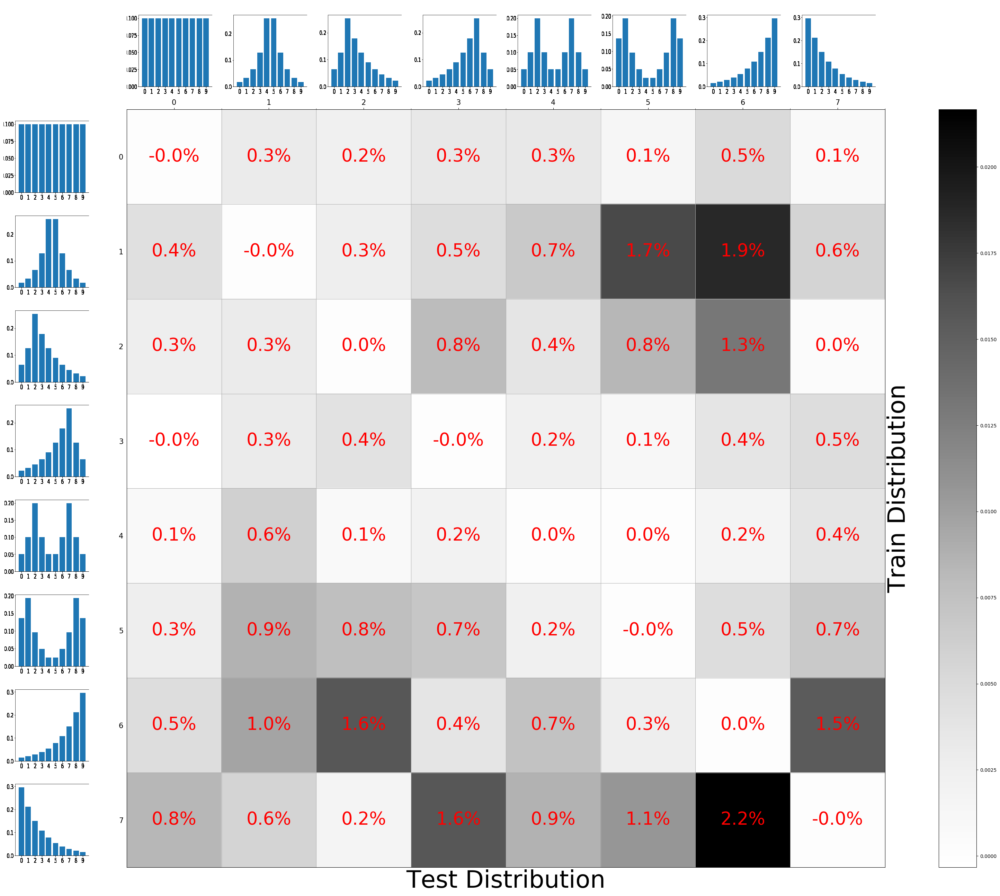

In [257]:
WORK_DIR = "./results/PriorProbabilityShift_experiment_5_10000samples/"
filename = 'adj_results_2018_05_20---09_22.dict.pickle'

# WORK_DIR = "./results/PriorProbabilityShift_experiment_5_5000samples/"
# filename = 'adj_results_2018_05_20---13_59.dict.pickle'


filehandler = open(os.path.join(WORK_DIR,filename), 'rb') 
restored_perf_dict = pickle.load(filehandler)
filehandler.close()
print('Results dictionary was succesfully restored from: {}'.format(filename))

# build a pandas dataframe from results dictionary
perf_df = pd.DataFrame(restored_perf_dict, columns=list(restored_perf_dict.keys()))
display(perf_df.describe())
display(perf_df.head())


# get all distributions used for training
distrs_used_for_training = perf_df['train_distr'][perf_df['idx_model'] == perf_df['idx_distr']]
L = np.sqrt(len(perf_df)).astype(np.int32)

# build and plot the accuracy comparison matrix
acc_matrix = np.array(perf_df['test_acc']).reshape((L, L))
acc_matrix_plt = Utils.plot_acc_matrix(train_distributions=distrs_used_for_training, acc_matrix=acc_matrix, use_percent_for_accuracies=True)
acc_matrix_plt.savefig(os.path.join(WORK_DIR,filename + '.acc_matrix.png'))

# build and plot distributions corresponding to wrong predictions
distr_matrix = np.array(perf_df['wrong_predicted_distr']).reshape((L, L))
acc_matrix_plt = Utils.plot_acc_matrix(train_distributions=distrs_used_for_training, acc_matrix=acc_matrix, distr_matrix=distr_matrix, use_percent_for_accuracies=True)
acc_matrix_plt.savefig(os.path.join(WORK_DIR,filename + '.wrong_predictions_distr_matrix.png'))

# build and plot distributions corresponding to correct predictions
distr_matrix = np.array(perf_df['correct_predicted_distr']).reshape((L, L))
acc_matrix_plt = Utils.plot_acc_matrix(train_distributions=distrs_used_for_training, acc_matrix=acc_matrix, distr_matrix=distr_matrix, use_percent_for_accuracies=True)
acc_matrix_plt.savefig(os.path.join(WORK_DIR,filename + '.correct_predictions_distr_matrix.png'))

# build and plot distributions corresponding to wrong actual predictions
distr_matrix = np.array(perf_df['wrong_actual_distr']).reshape((L, L))
acc_matrix_plt = Utils.plot_acc_matrix(train_distributions=distrs_used_for_training, acc_matrix=acc_matrix, distr_matrix=distr_matrix, use_percent_for_accuracies=True)
acc_matrix_plt.savefig(os.path.join(WORK_DIR,filename + '.wrong_actual_predictions_distr_matrix.png'))

# build and plot the accuracy comparison matrix (adjusted version using real priors)
adj_acc_matrix = np.array(perf_df['adj_test_acc']).reshape((L, L))
acc_matrix_plt = Utils.plot_acc_matrix(train_distributions=distrs_used_for_training, acc_matrix=adj_acc_matrix, use_percent_for_accuracies=True)
acc_matrix_plt.savefig(os.path.join(WORK_DIR,filename + '.adj_acc_matrix.png'))

# build and plot distributions corresponding to wrong predictions (adjusted version using real priors)
distr_matrix = np.array(perf_df['adj_wrong_predicted_distr']).reshape((L, L))
acc_matrix_plt = Utils.plot_acc_matrix(train_distributions=distrs_used_for_training, acc_matrix=adj_acc_matrix, distr_matrix=distr_matrix, use_percent_for_accuracies=True)
acc_matrix_plt.savefig(os.path.join(WORK_DIR,filename + '.adj_wrong_predictions_distr_matrix.png'))

# build and plot distributions corresponding to correct predictions (adjusted version using real priors)
distr_matrix = np.array(perf_df['adj_correct_predicted_distr']).reshape((L, L))
acc_matrix_plt = Utils.plot_acc_matrix(train_distributions=distrs_used_for_training, acc_matrix=adj_acc_matrix, distr_matrix=distr_matrix, use_percent_for_accuracies=True)
acc_matrix_plt.savefig(os.path.join(WORK_DIR,filename + '.adj_correct_predictions_distr_matrix.png'))

# build and plot distributions corresponding to wrong actual predictions (adjusted version using real priors)
distr_matrix = np.array(perf_df['adj_wrong_actual_distr']).reshape((L, L))
acc_matrix_plt = Utils.plot_acc_matrix(train_distributions=distrs_used_for_training, acc_matrix=adj_acc_matrix, distr_matrix=distr_matrix, use_percent_for_accuracies=True)
acc_matrix_plt.savefig(os.path.join(WORK_DIR,filename + '.adj_wrong_actual_predictions_distr_matrix.png'))

# build and plot the difference of accuracy matrix (standard version vs adjusted version using real priors)
diff_acc_matrix = adj_acc_matrix - acc_matrix
acc_matrix_plt = Utils.plot_acc_matrix(train_distributions=distrs_used_for_training, acc_matrix=diff_acc_matrix, use_percent_for_accuracies=True)
acc_matrix_plt.savefig(os.path.join(WORK_DIR,filename + '.diff_acc_matrix.png'))

# build and plot the difference of accuracy matrix (standard version vs adjusted version using real priors)
diff_acc_matrix = adj_acc_matrix - acc_matrix
acc_matrix_plt = Utils.plot_acc_matrix(train_distributions=distrs_used_for_training, acc_matrix=diff_acc_matrix, use_percent_for_accuracies=True)
acc_matrix_plt.savefig(os.path.join(WORK_DIR,filename + '.diff_acc_matrix.png'))

---
### - check the average accuracies before and after adjusting the ouputs using real priors
---

In [13]:
WORK_DIR = "./results/PriorProbabilityShift_experiment_5_10000samples/"
filename = 'adj_results_2018_05_20---09_22.dict.pickle'
filehandler = open(os.path.join(WORK_DIR,filename), 'rb') 
restored_perf_dict = pickle.load(filehandler)
filehandler.close()
print('Results dictionary was succesfully restored from: {}'.format(filename))

# compute and display average accuracy 
perf_df = pd.DataFrame(restored_perf_dict, columns=list(restored_perf_dict.keys()))
avg_acc = np.average(perf_df['test_acc'])
print('avg test accuracy (10000 training examples) = {:.3f}%'.format(avg_acc * 100))
avg_adj_acc = np.average(perf_df['adj_test_acc'])
print('avg test accuracy (adjusting using real priors) (10000 training examples) = {:.3f}%'.format(avg_adj_acc * 100))


WORK_DIR = "./results/PriorProbabilityShift_experiment_5_5000samples/"
filename = 'adj_results_2018_05_20---13_59.dict.pickle'

filehandler = open(os.path.join(WORK_DIR,filename), 'rb') 
restored_perf_dict = pickle.load(filehandler)
filehandler.close()
print('Results dictionary was succesfully restored from: {}'.format(filename))

# compute and display average accuracy 
perf_df = pd.DataFrame(restored_perf_dict, columns=list(restored_perf_dict.keys()))
avg_acc = np.average(perf_df['test_acc'])
print('avg test accuracy (5000 training examples)= {:.3f}%'.format(avg_acc * 100))
avg_adj_acc = np.average(perf_df['adj_test_acc'])
print('avg test accuracy (adjusting using real priors) (5000 training examples) = {:.3f}%'.format(avg_adj_acc * 100))

Results dictionary was succesfully restored from: adj_results_2018_05_20---09_22.dict.pickle
avg test accuracy (10000 training examples) = 97.205%
avg test accuracy (adjusting using real priors) (10000 training examples) = 97.707%
Results dictionary was succesfully restored from: adj_results_2018_05_20---13_59.dict.pickle
avg test accuracy (5000 training examples)= 95.484%
avg test accuracy (adjusting using real priors) (5000 training examples) = 96.508%


---
### - test the models and the adjusting method on the entire MNIST testset
---

Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/0 Lenet5_with_imposed_distr_0_10000samples_2018_05_07---10_33.model.ckpt
The restored model was trained using distr: [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]

Restoring model from ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_0_10000samples_2018_05_07---10_33.model.ckpt
Variable distr_pos not found in ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_0_10000samples_2018_05_07---10_33.model.ckpt

2018-05-20 21:42:25,846 - Network layers size:
	[None, 28, 28, 1]
	[None, 28, 28, 6]
	[None, 14, 14, 6]
	[None, 10, 10, 16]
	[None, 400]
	[None, 120]
	[None, 84]
	[None, 10]
test_loss = 0.0637, test_acc = 0.9805 (9805/10000)


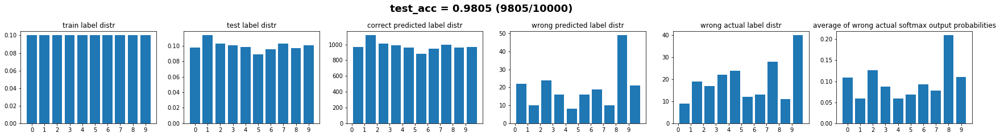

real priors = [0.098 0.114 0.103 0.101 0.098 0.089 0.096 0.103 0.097 0.101]
old prios   = [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
Old accuracy: 0.981 (9805/10000)
New accuracy: 0.981 (9808/10000), after adjusted using real priors




Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/1 Lenet5_with_imposed_distr_1_10000samples_2018_05_07---10_39.model.ckpt
The restored model was trained using distr: [0.016 0.032 0.065 0.129 0.258 0.258 0.129 0.065 0.032 0.016]

Restoring model from ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_1_10000samples_2018_05_07---10_39.model.ckpt
Variable distr_pos not found in ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_1_10000samples_2018_05_07---10_39.model.ckpt

2018-05-20 21:42:40,116 - Network layers size:
	[None, 28, 28, 1]
	[None, 28, 28, 6]
	[None, 14, 14, 6]
	[None, 10, 10, 16]
	[None, 400]
	[None, 120]
	[None, 84]
	[None, 10]
test_loss = 0.1130, test

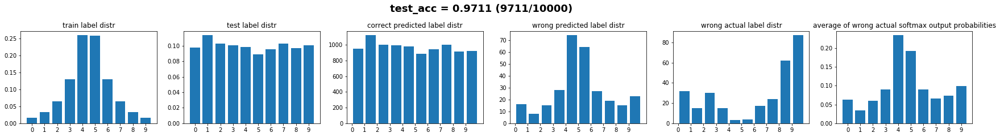

real priors = [0.098 0.114 0.103 0.101 0.098 0.089 0.096 0.103 0.097 0.101]
old prios   = [0.016 0.032 0.065 0.129 0.258 0.258 0.129 0.065 0.032 0.016]
Old accuracy: 0.971 (9711/10000)
New accuracy: 0.975 (9746/10000), after adjusted using real priors




Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/2 Lenet5_with_imposed_distr_2_10000samples_2018_05_07---10_45.model.ckpt
The restored model was trained using distr: [0.063 0.127 0.254 0.179 0.127 0.089 0.063 0.045 0.032 0.022]

Restoring model from ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_2_10000samples_2018_05_07---10_45.model.ckpt
Variable distr_pos not found in ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_2_10000samples_2018_05_07---10_45.model.ckpt

2018-05-20 21:42:53,083 - Network layers size:
	[None, 28, 28, 1]
	[None, 28, 28, 6]
	[None, 14, 14, 6]
	[None, 10, 10, 16]
	[None, 400]
	[None, 120]
	[None, 84]
	[None, 10]
test

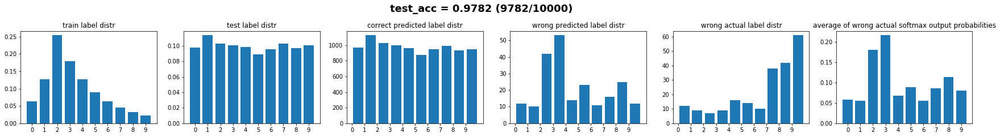

real priors = [0.098 0.114 0.103 0.101 0.098 0.089 0.096 0.103 0.097 0.101]
old prios   = [0.063 0.127 0.254 0.179 0.127 0.089 0.063 0.045 0.032 0.022]
Old accuracy: 0.978 (9782/10000)
New accuracy: 0.980 (9801/10000), after adjusted using real priors




Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/3 Lenet5_with_imposed_distr_3_10000samples_2018_05_07---10_51.model.ckpt
The restored model was trained using distr: [0.022 0.032 0.045 0.063 0.089 0.127 0.179 0.254 0.127 0.063]

Restoring model from ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_3_10000samples_2018_05_07---10_51.model.ckpt
Variable distr_pos not found in ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_3_10000samples_2018_05_07---10_51.model.ckpt

2018-05-20 21:43:04,940 - Network layers size:
	[None, 28, 28, 1]
	[None, 28, 28, 6]
	[None, 14, 14, 6]
	[None, 10, 10, 16]
	[None, 400]
	[None, 120]
	[None, 84]
	[None, 10]
test

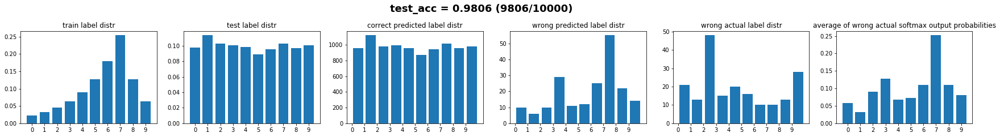

real priors = [0.098 0.114 0.103 0.101 0.098 0.089 0.096 0.103 0.097 0.101]
old prios   = [0.022 0.032 0.045 0.063 0.089 0.127 0.179 0.254 0.127 0.063]
Old accuracy: 0.981 (9806/10000)
New accuracy: 0.982 (9815/10000), after adjusted using real priors




Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/4 Lenet5_with_imposed_distr_4_10000samples_2018_05_07---10_56.model.ckpt
The restored model was trained using distr: [0.05 0.1  0.2  0.1  0.05 0.05 0.1  0.2  0.1  0.05]

Restoring model from ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_4_10000samples_2018_05_07---10_56.model.ckpt
Variable distr_pos not found in ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_4_10000samples_2018_05_07---10_56.model.ckpt

2018-05-20 21:43:20,090 - Network layers size:
	[None, 28, 28, 1]
	[None, 28, 28, 6]
	[None, 14, 14, 6]
	[None, 10, 10, 16]
	[None, 400]
	[None, 120]
	[None, 84]
	[None, 10]
test_loss = 0.

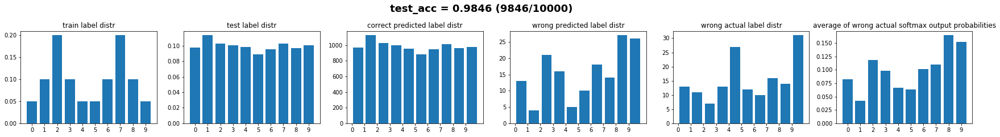

real priors = [0.098 0.114 0.103 0.101 0.098 0.089 0.096 0.103 0.097 0.101]
old prios   = [0.05 0.1  0.2  0.1  0.05 0.05 0.1  0.2  0.1  0.05]
Old accuracy: 0.985 (9846/10000)
New accuracy: 0.985 (9854/10000), after adjusted using real priors




Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/5 Lenet5_with_imposed_distr_5_10000samples_2018_05_07---11_02.model.ckpt
The restored model was trained using distr: [0.137 0.194 0.097 0.048 0.024 0.024 0.048 0.097 0.194 0.137]

Restoring model from ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_5_10000samples_2018_05_07---11_02.model.ckpt
Variable distr_pos not found in ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_5_10000samples_2018_05_07---11_02.model.ckpt

2018-05-20 21:43:33,290 - Network layers size:
	[None, 28, 28, 1]
	[None, 28, 28, 6]
	[None, 14, 14, 6]
	[None, 10, 10, 16]
	[None, 400]
	[None, 120]
	[None, 84]
	[None, 10]
test_loss = 0.

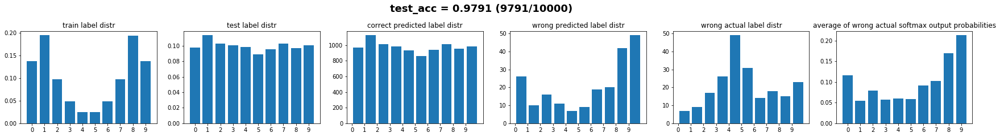

real priors = [0.098 0.114 0.103 0.101 0.098 0.089 0.096 0.103 0.097 0.101]
old prios   = [0.137 0.194 0.097 0.048 0.024 0.024 0.048 0.097 0.194 0.137]
Old accuracy: 0.979 (9791/10000)
New accuracy: 0.981 (9810/10000), after adjusted using real priors




Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/6 Lenet5_with_imposed_distr_6_10000samples_2018_05_07---11_08.model.ckpt
The restored model was trained using distr: [0.014 0.02  0.028 0.039 0.055 0.077 0.108 0.151 0.211 0.296]

Restoring model from ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_6_10000samples_2018_05_07---11_08.model.ckpt
Variable distr_pos not found in ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_6_10000samples_2018_05_07---11_08.model.ckpt

2018-05-20 21:43:45,619 - Network layers size:
	[None, 28, 28, 1]
	[None, 28, 28, 6]
	[None, 14, 14, 6]
	[None, 10, 10, 16]
	[None, 400]
	[None, 120]
	[None, 84]
	[None, 10]
test

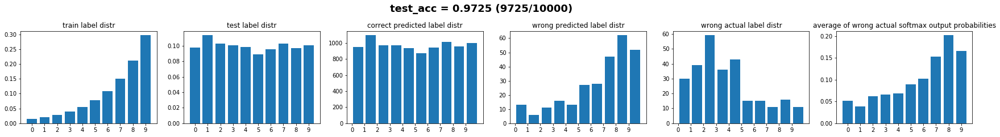

real priors = [0.098 0.114 0.103 0.101 0.098 0.089 0.096 0.103 0.097 0.101]
old prios   = [0.014 0.02  0.028 0.039 0.055 0.077 0.108 0.151 0.211 0.296]
Old accuracy: 0.973 (9725/10000)
New accuracy: 0.977 (9772/10000), after adjusted using real priors




Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/7 Lenet5_with_imposed_distr_7_10000samples_2018_05_07---11_14.model.ckpt
The restored model was trained using distr: [0.296 0.211 0.151 0.108 0.077 0.055 0.039 0.028 0.02  0.014]

Restoring model from ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_7_10000samples_2018_05_07---11_14.model.ckpt
Variable distr_pos not found in ./results/PriorProbabilityShift_experiment_5_10000samples/Lenet5_with_imposed_distr_7_10000samples_2018_05_07---11_14.model.ckpt

2018-05-20 21:43:57,293 - Network layers size:
	[None, 28, 28, 1]
	[None, 28, 28, 6]
	[None, 14, 14, 6]
	[None, 10, 10, 16]
	[None, 400]
	[None, 120]
	[None, 84]
	[None, 10]
test

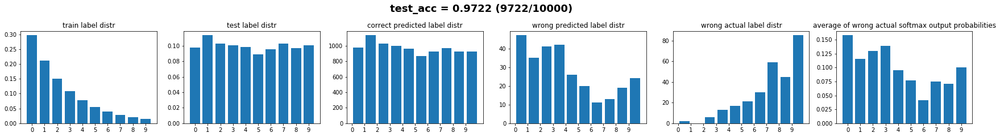

real priors = [0.098 0.114 0.103 0.101 0.098 0.089 0.096 0.103 0.097 0.101]
old prios   = [0.296 0.211 0.151 0.108 0.077 0.055 0.039 0.028 0.02  0.014]
Old accuracy: 0.972 (9722/10000)
New accuracy: 0.977 (9766/10000), after adjusted using real priors






In [85]:
WORK_DIR = "./results/PriorProbabilityShift_experiment_5_10000samples/"
# WORK_DIR = "./results/PriorProbabilityShift_experiment_5_5000samples/"
ckpt_file_list = Utils.get_all_files_from_dir_ending_with(WORK_DIR, "ckpt.meta", without_file_extension=True)

for idx_model, ckpt_file in enumerate(ckpt_file_list):
    print('Restoring model {}{} {}'.format(WORK_DIR, idx_model, ckpt_file))
    test_model = Lenet5(mnist_dataset=mnist_ds, verbose=False)
    test_model.restore_session(ckpt_dir=WORK_DIR, ckpt_filename=ckpt_file)
    test_model_train_distr = test_model.session.run(test_model.train_distr)
    print('The restored model was trained using distr: {}\n'.format(test_model_train_distr))
    
    # test it on the entire MNIST test set
    mnist_ds = MNISTDataset(MNIST_TRAIN_IMAGES_FILEPATH, MNIST_TRAIN_LABELS_FILEPATH, MNIST_TEST_IMAGES_FILEPATH, MNIST_TEST_LABELS_FILEPATH)
    test_loss, test_acc, total_predict, total_actual, wrong_predict_images, output_probs = test_model.test_data(mnist_ds.test, use_only_one_batch=True)
  
    # analyze error distribution
    restore_and_test_a_model_on_a_mnist_subset(mnist_ds, ckpt_dir=WORK_DIR, ckpt_filemame=ckpt_file, plot_filename = 'test_model')
    
    # adjusing the ouputs using real priots
    real_priors = mnist_ds.test.label_distr
    old_priors = test_model_train_distr
    print('real priors = {}'.format(real_priors))
    print('old prios   = {}'.format(old_priors))

    corrected_output_probs = (real_priors / old_priors) * output_probs / (np.sum((real_priors / old_priors) * output_probs, axis = 1)[:, None])
    corrected_total_predict = np.argmax(corrected_output_probs, axis=1)
    
    count_correct_predicted = np.sum(total_predict == total_actual)
    print('Old accuracy: {:.3f} ({}/{})'.format(count_correct_predicted / mnist_ds.test.num_examples, count_correct_predicted, mnist_ds.test.num_examples))
    count_correct_predicted = np.sum(corrected_total_predict == total_actual)
    print('New accuracy: {:.3f} ({}/{}), after adjusted using real priors'.format(count_correct_predicted / mnist_ds.test.num_examples, count_correct_predicted, mnist_ds.test.num_examples))
    
    print('\n\n\n')

---
### - choose a model and analyze some examples for which the adjusting using the real priors changed the decision
---

Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/0 Lenet5_with_imposed_distr_0_10000samples_2018_05_07---10_33.model.ckpt
Old accuracy: 0.978 (2935/3000)
New accuracy: 0.981 (2944/3000)
#wrong_predicted_corrected_by_adj = 17
#correct_predicted_disturbed_by_adj = 8


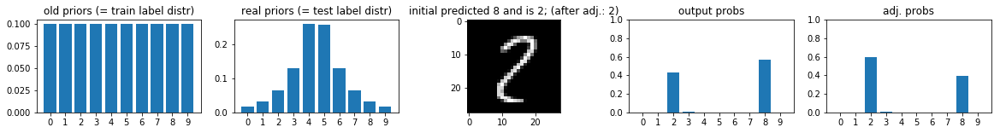

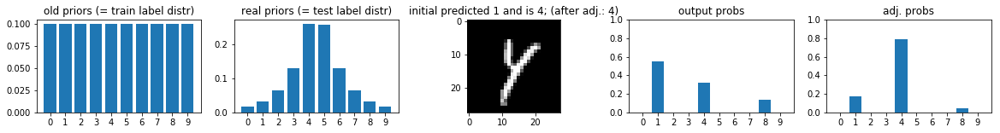

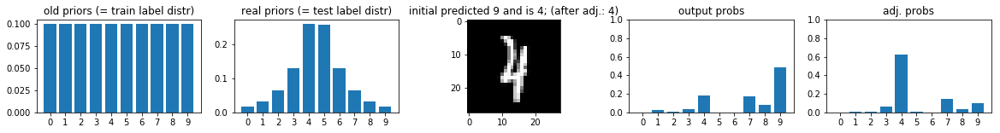

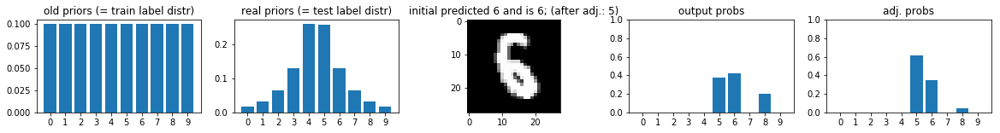

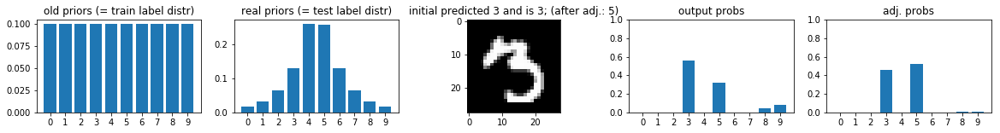

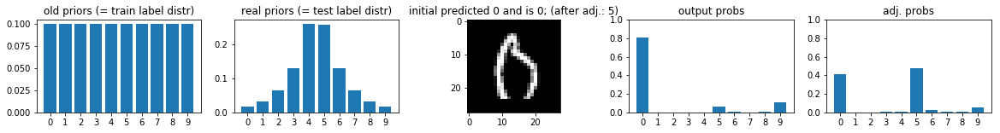

Old accuracy: 0.977 (2932/3000)
New accuracy: 0.980 (2939/3000)
#wrong_predicted_corrected_by_adj = 15
#correct_predicted_disturbed_by_adj = 8


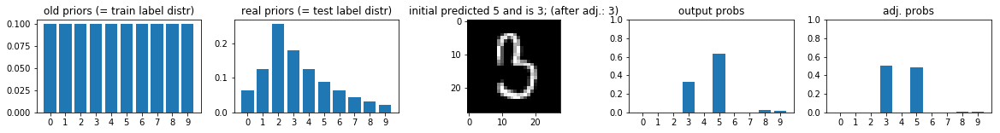

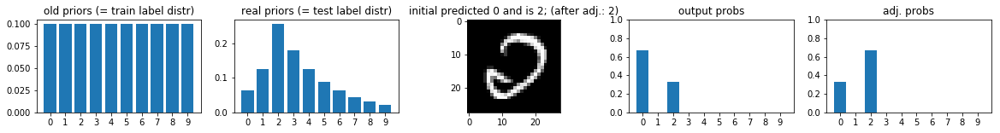

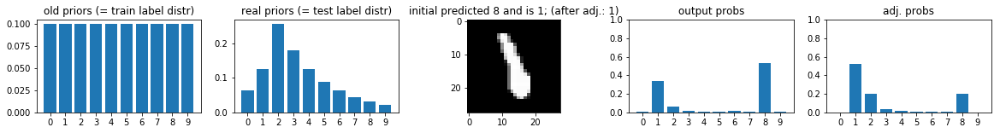

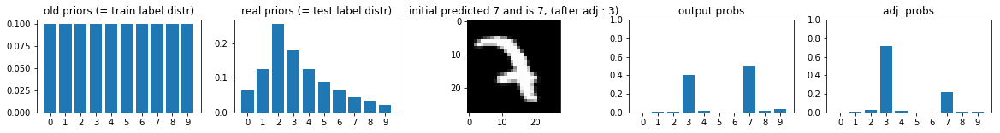

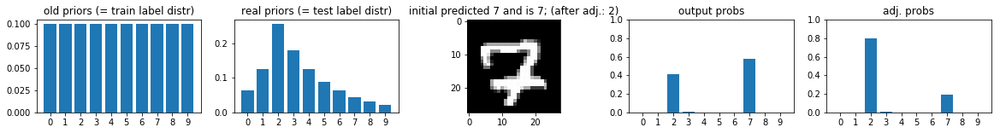

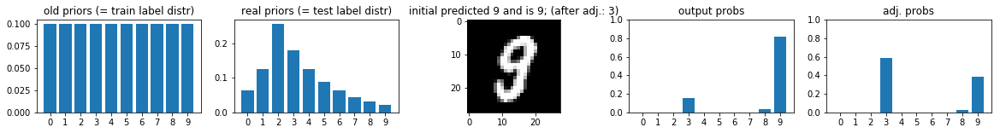

Old accuracy: 0.976 (2929/3000)
New accuracy: 0.980 (2939/3000)
#wrong_predicted_corrected_by_adj = 19
#correct_predicted_disturbed_by_adj = 9


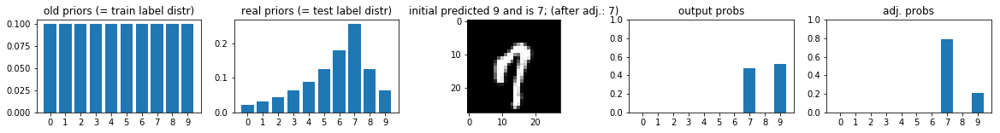

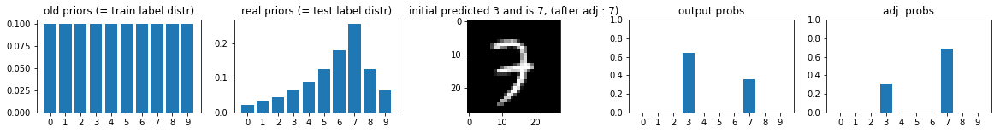

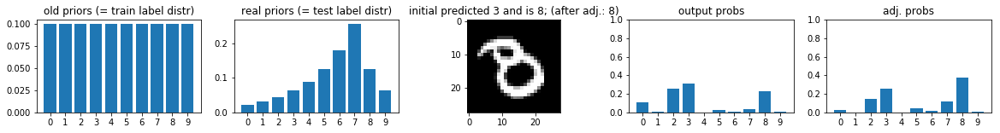

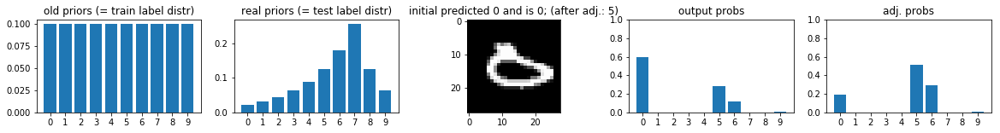

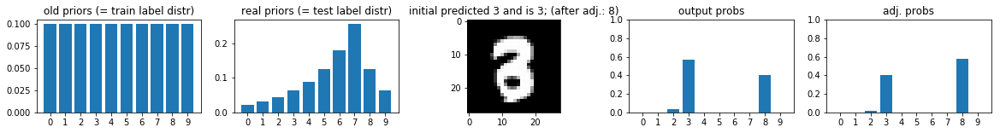

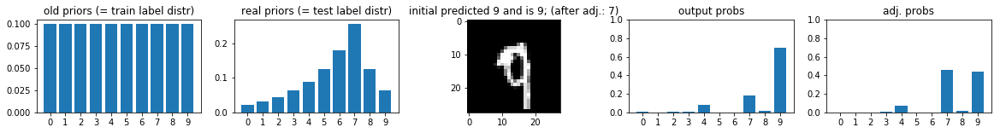

Old accuracy: 0.977 (2930/3000)
New accuracy: 0.980 (2940/3000)
#wrong_predicted_corrected_by_adj = 16
#correct_predicted_disturbed_by_adj = 6


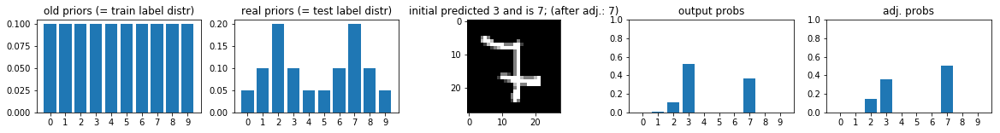

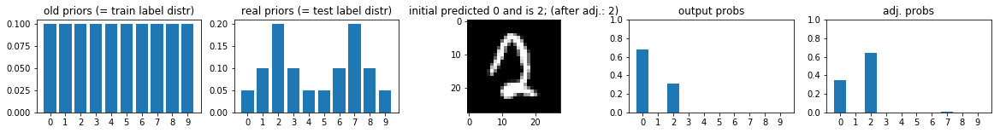

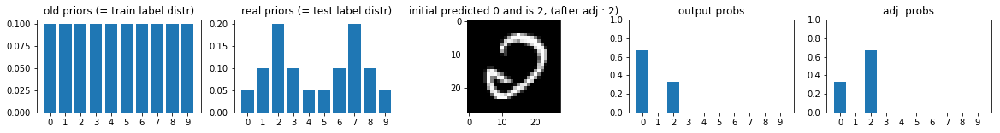

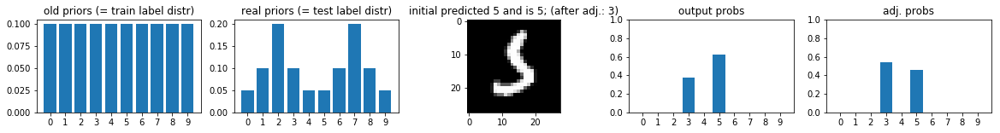

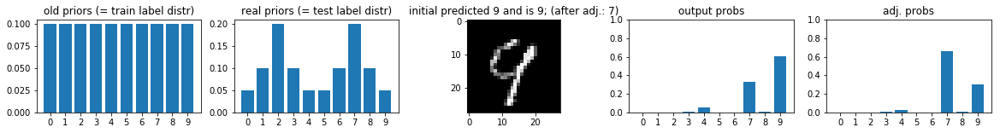

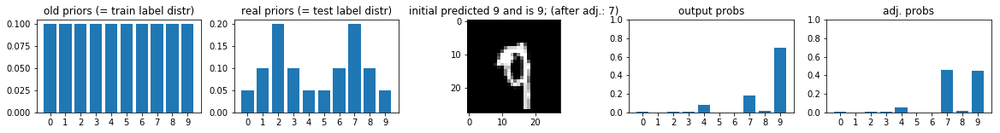

Old accuracy: 0.977 (2932/3000)
New accuracy: 0.979 (2936/3000)
#wrong_predicted_corrected_by_adj = 11
#correct_predicted_disturbed_by_adj = 7


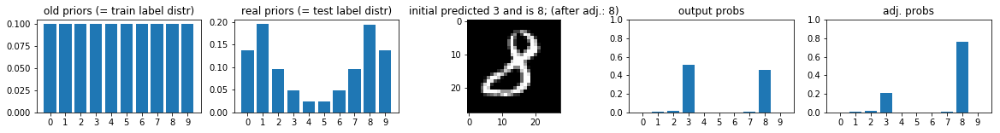

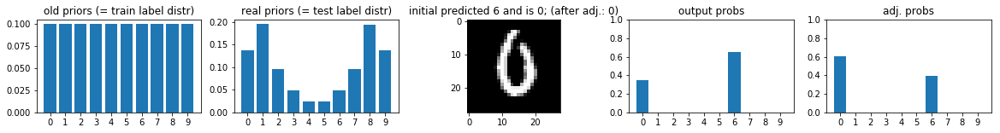

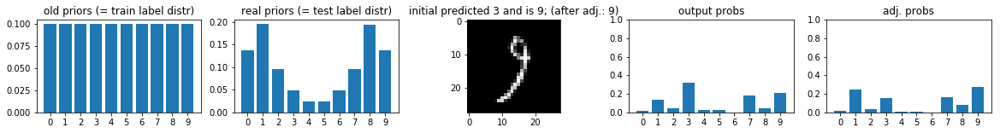

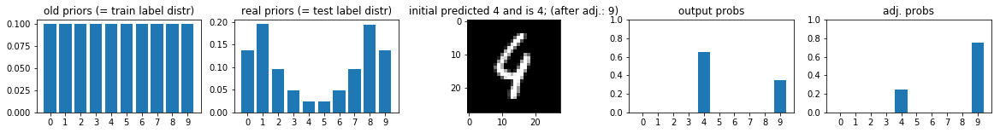

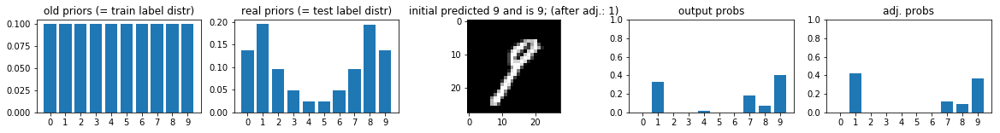

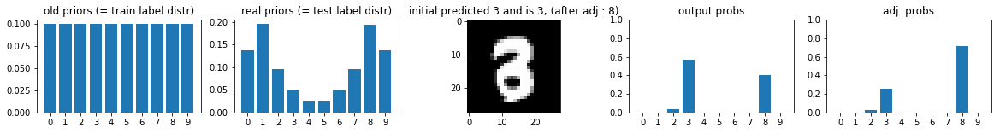

Old accuracy: 0.971 (2913/3000)
New accuracy: 0.976 (2928/3000)
#wrong_predicted_corrected_by_adj = 25
#correct_predicted_disturbed_by_adj = 10


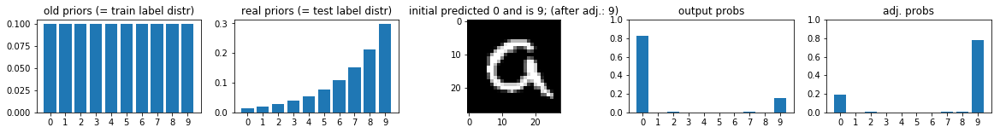

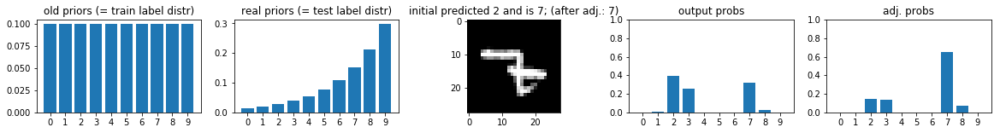

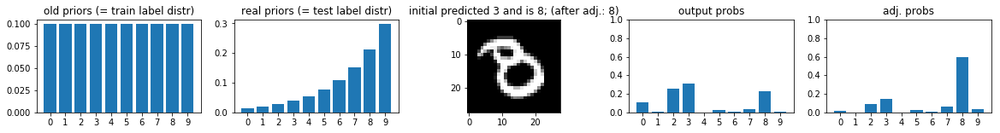

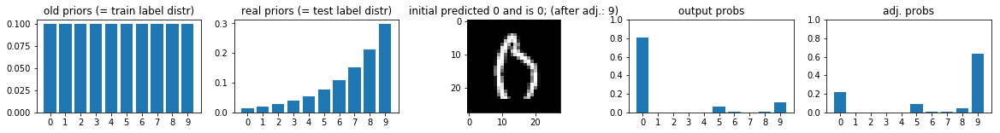

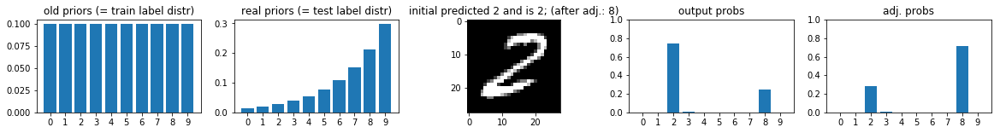

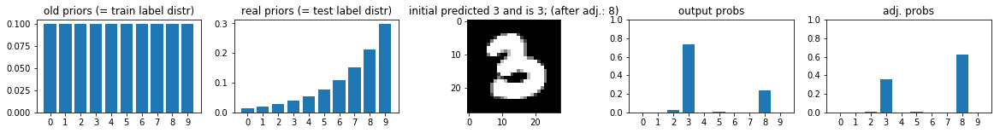

Old accuracy: 0.984 (2951/3000)
New accuracy: 0.984 (2953/3000)
#wrong_predicted_corrected_by_adj = 7
#correct_predicted_disturbed_by_adj = 5


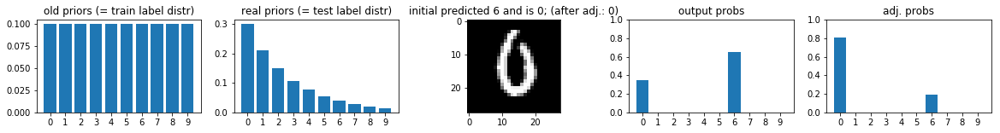

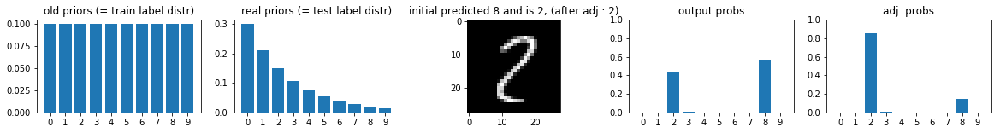

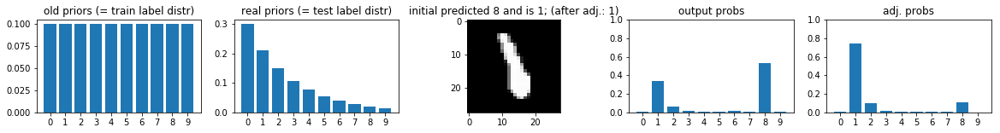

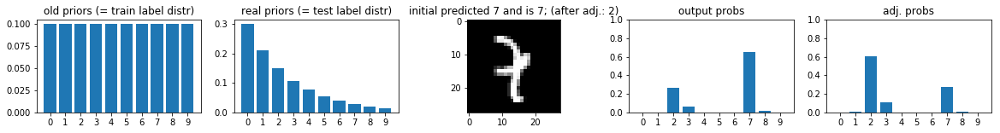

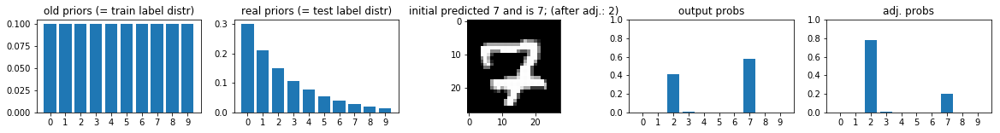

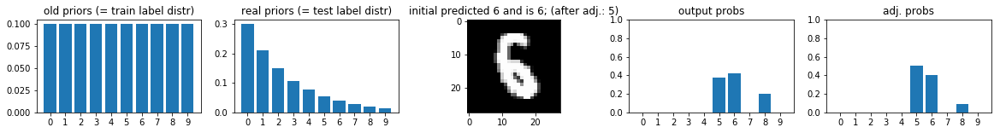

Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/1 Lenet5_with_imposed_distr_1_10000samples_2018_05_07---10_39.model.ckpt
Old accuracy: 0.960 (2881/3000)
New accuracy: 0.965 (2894/3000)
#wrong_predicted_corrected_by_adj = 29
#correct_predicted_disturbed_by_adj = 16


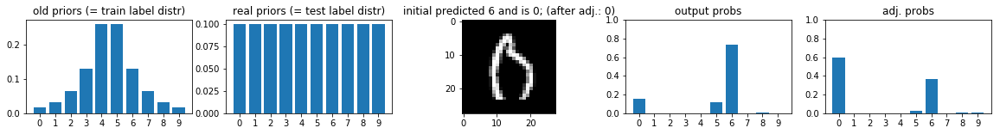

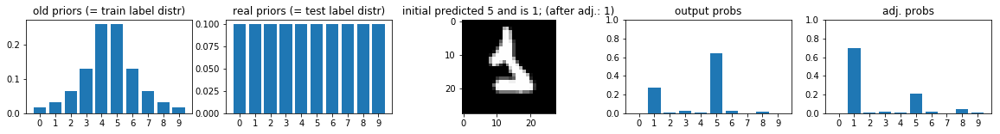

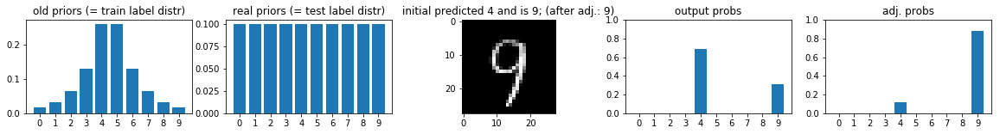

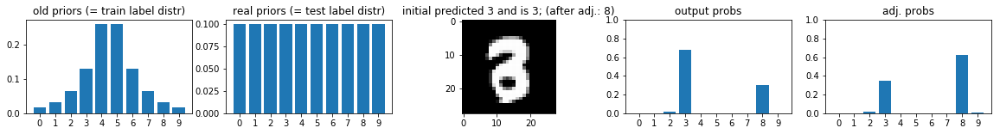

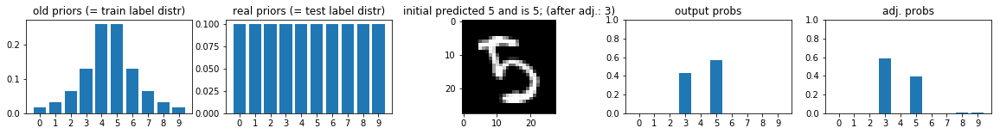

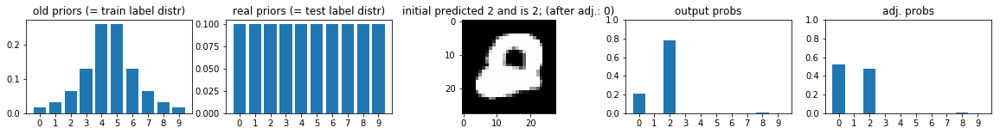

Old accuracy: 0.981 (2943/3000)
New accuracy: 0.981 (2943/3000)
#wrong_predicted_corrected_by_adj = 0
#correct_predicted_disturbed_by_adj = 0
Old accuracy: 0.973 (2920/3000)
New accuracy: 0.976 (2929/3000)
#wrong_predicted_corrected_by_adj = 16
#correct_predicted_disturbed_by_adj = 7


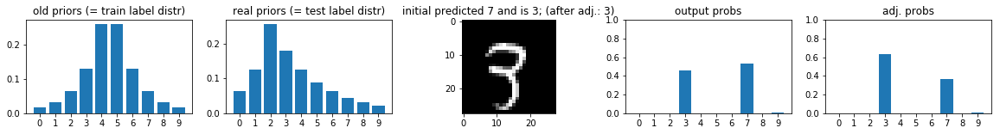

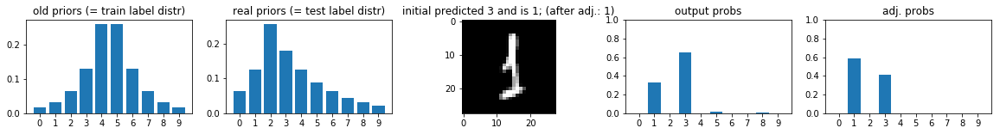

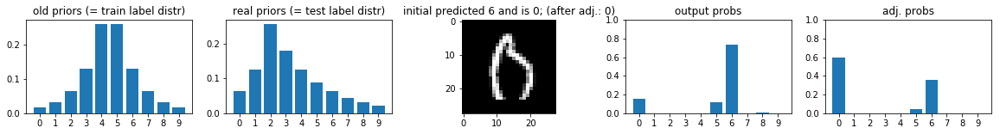

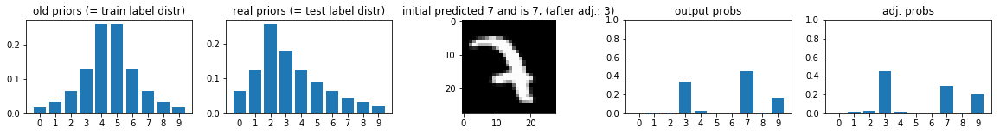

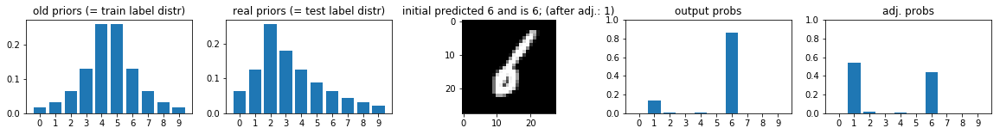

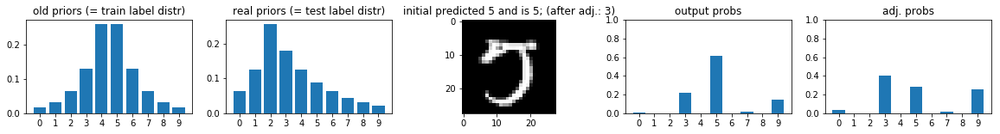

Old accuracy: 0.967 (2901/3000)
New accuracy: 0.971 (2914/3000)
#wrong_predicted_corrected_by_adj = 22
#correct_predicted_disturbed_by_adj = 9


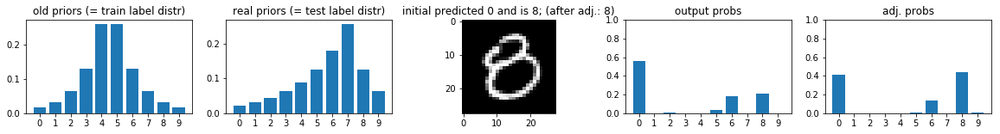

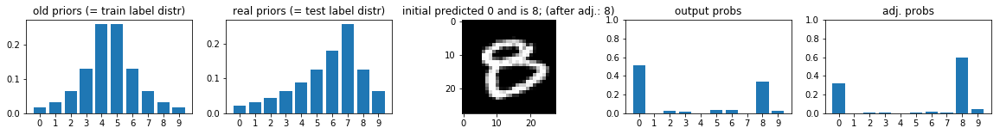

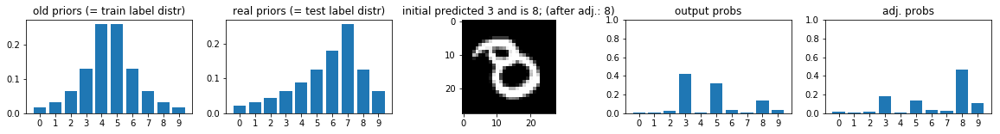

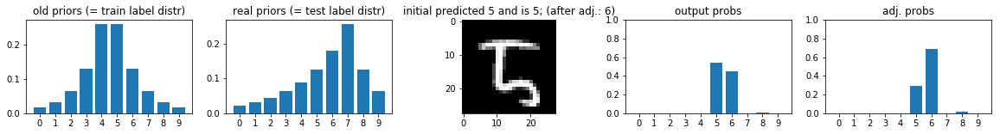

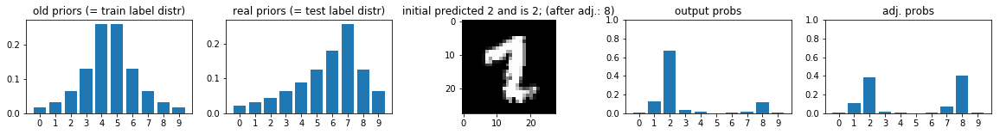

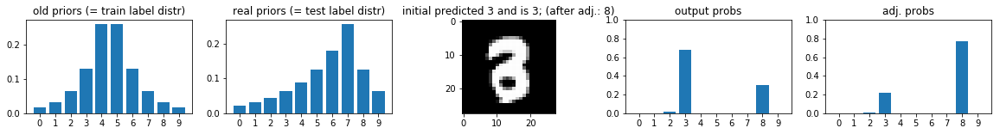

Old accuracy: 0.964 (2892/3000)
New accuracy: 0.971 (2912/3000)
#wrong_predicted_corrected_by_adj = 22
#correct_predicted_disturbed_by_adj = 2


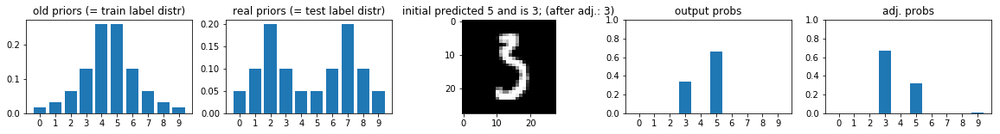

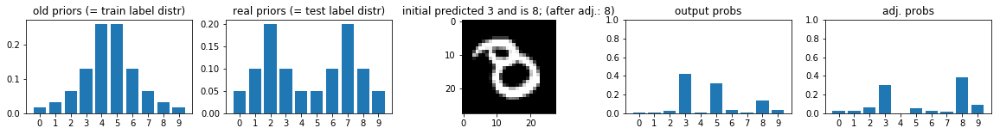

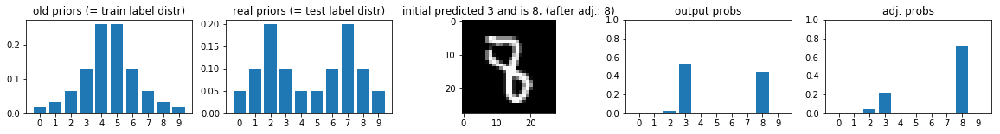

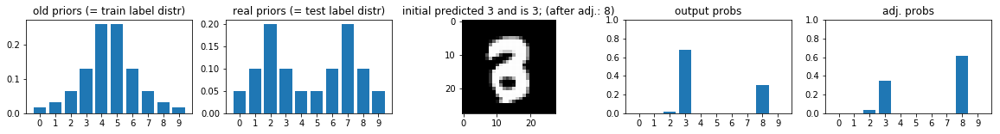

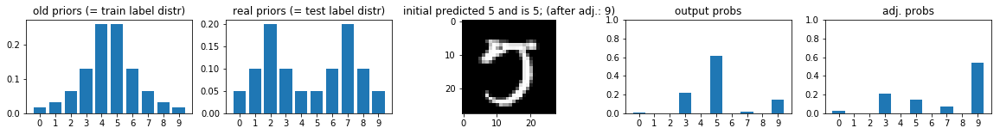

Old accuracy: 0.951 (2852/3000)
New accuracy: 0.967 (2902/3000)
#wrong_predicted_corrected_by_adj = 65
#correct_predicted_disturbed_by_adj = 15


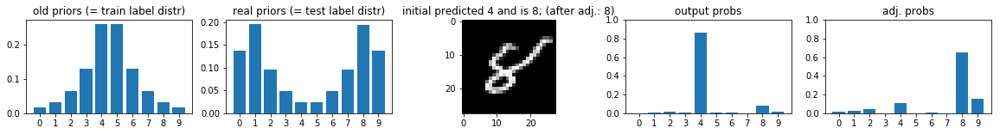

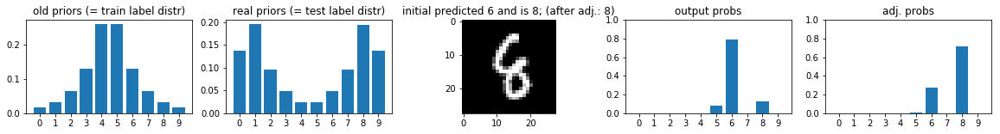

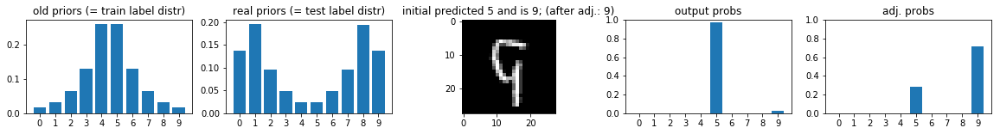

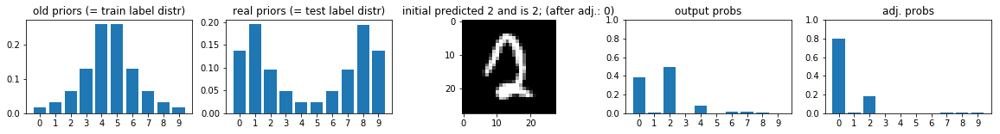

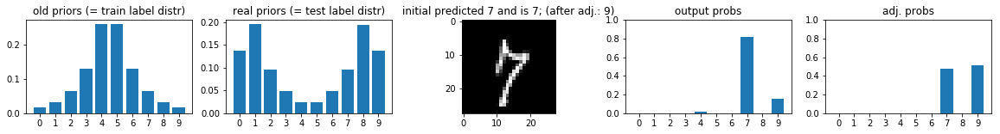

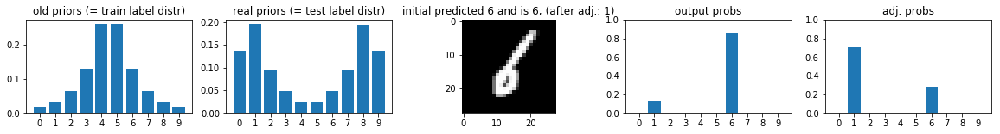

Old accuracy: 0.945 (2835/3000)
New accuracy: 0.964 (2891/3000)
#wrong_predicted_corrected_by_adj = 78
#correct_predicted_disturbed_by_adj = 22


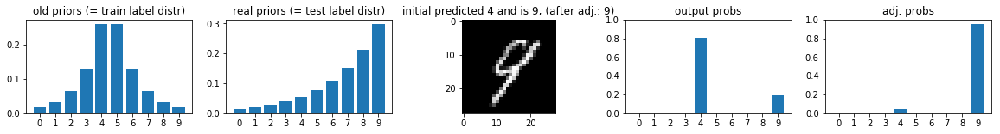

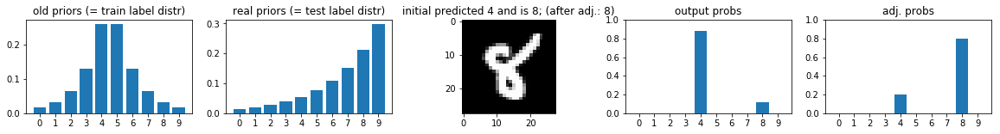

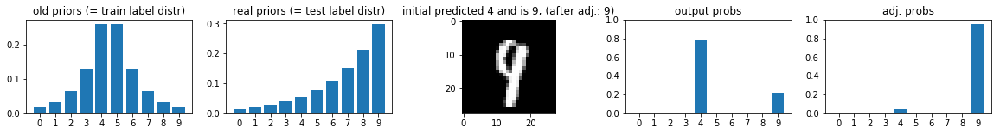

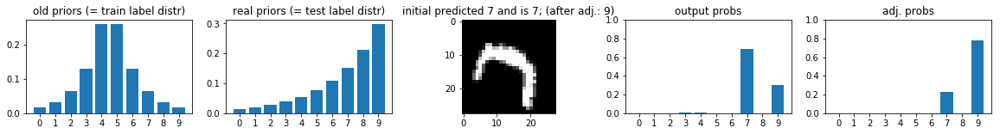

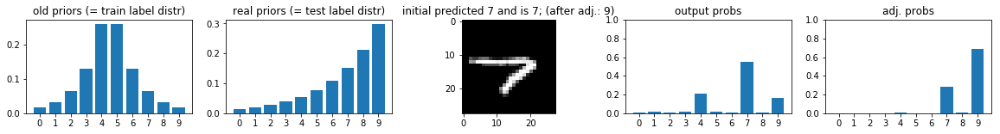

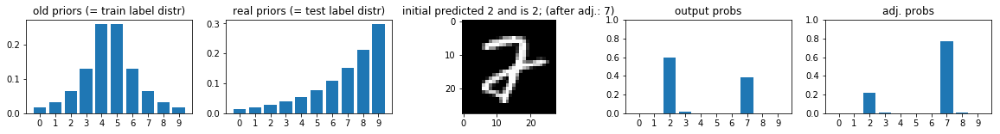

Old accuracy: 0.973 (2920/3000)
New accuracy: 0.979 (2937/3000)
#wrong_predicted_corrected_by_adj = 29
#correct_predicted_disturbed_by_adj = 12


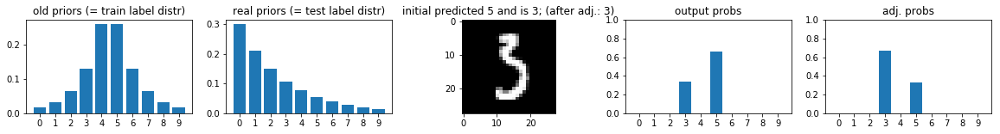

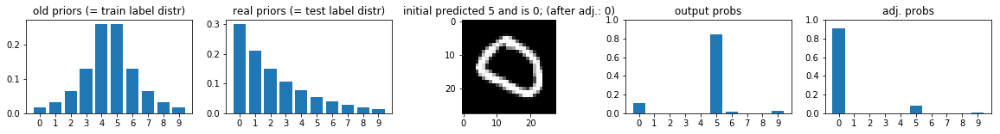

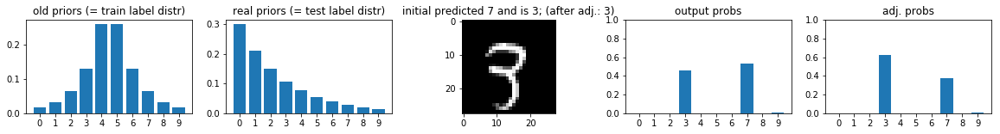

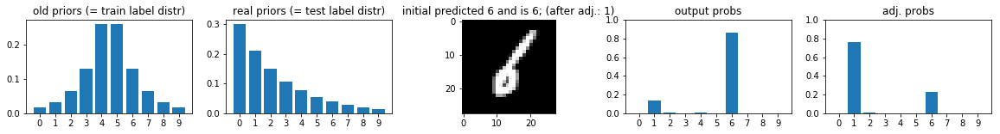

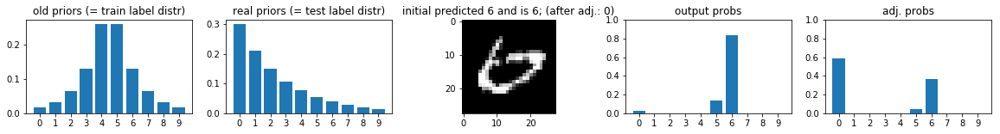

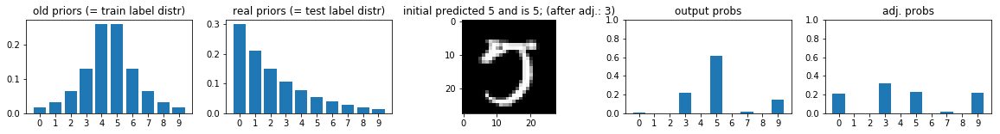

Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/2 Lenet5_with_imposed_distr_2_10000samples_2018_05_07---10_45.model.ckpt
Old accuracy: 0.970 (2909/3000)
New accuracy: 0.972 (2917/3000)
#wrong_predicted_corrected_by_adj = 21
#correct_predicted_disturbed_by_adj = 13


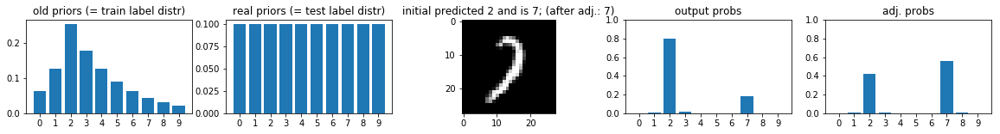

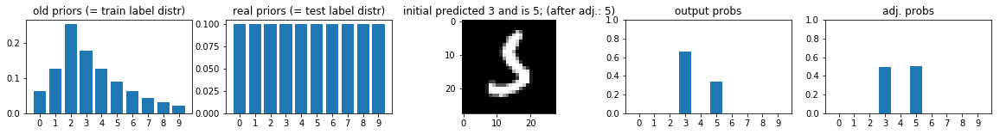

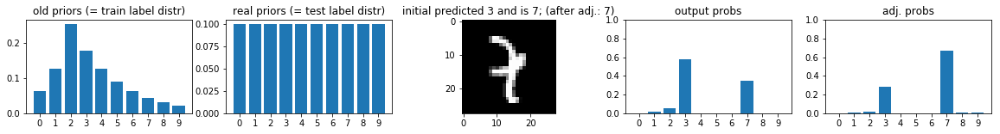

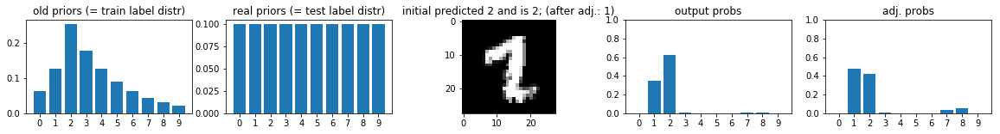

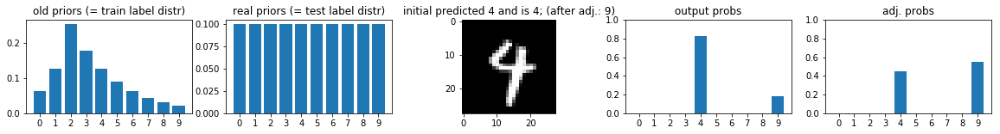

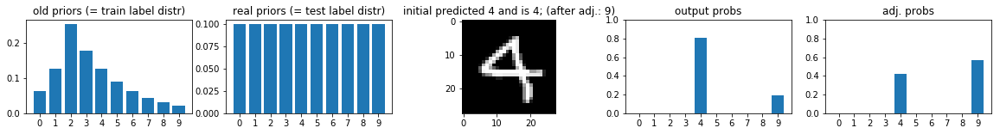

Old accuracy: 0.978 (2933/3000)
New accuracy: 0.981 (2942/3000)
#wrong_predicted_corrected_by_adj = 14
#correct_predicted_disturbed_by_adj = 5


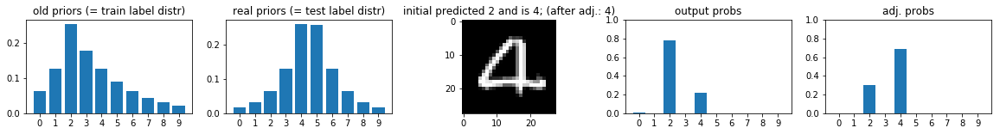

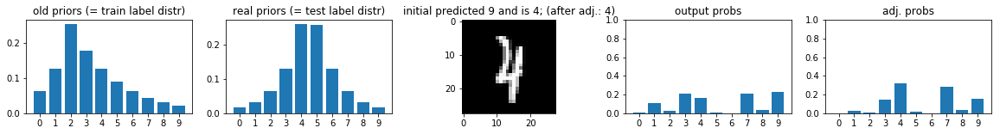

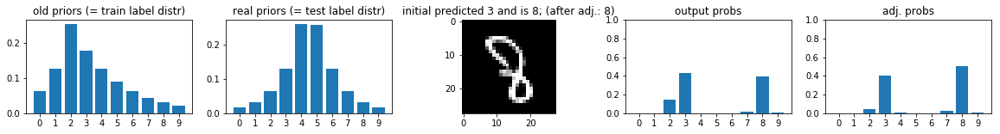

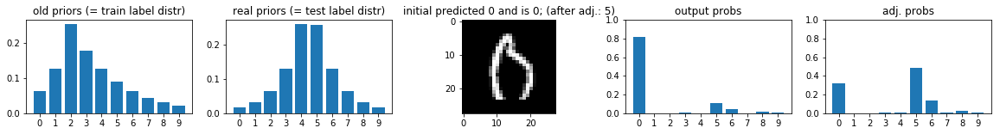

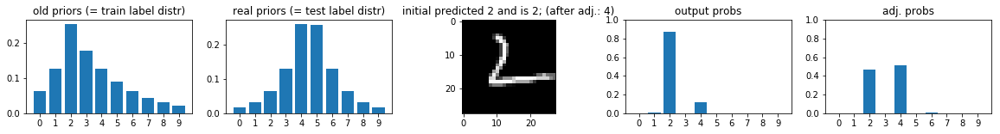

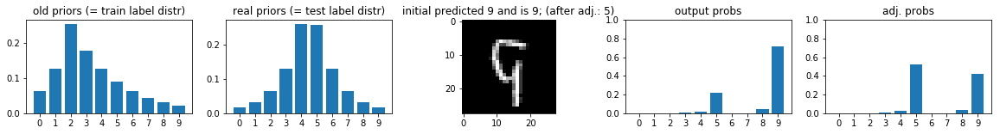

Old accuracy: 0.982 (2945/3000)
New accuracy: 0.982 (2945/3000)
#wrong_predicted_corrected_by_adj = 0
#correct_predicted_disturbed_by_adj = 0
Old accuracy: 0.968 (2905/3000)
New accuracy: 0.976 (2929/3000)
#wrong_predicted_corrected_by_adj = 35
#correct_predicted_disturbed_by_adj = 11


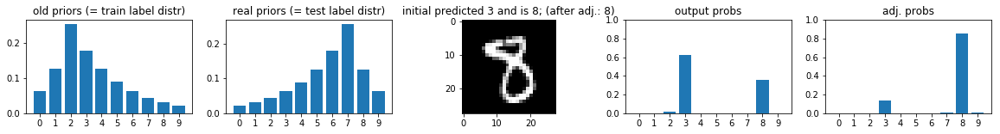

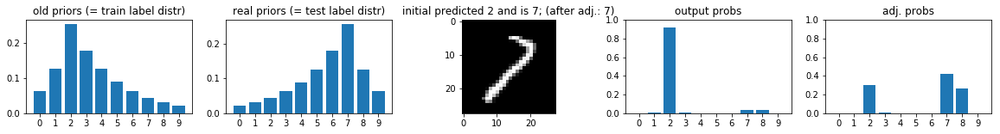

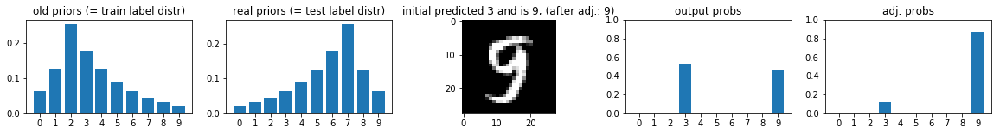

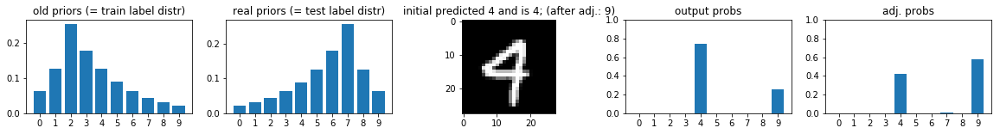

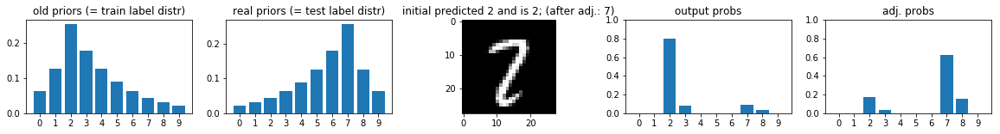

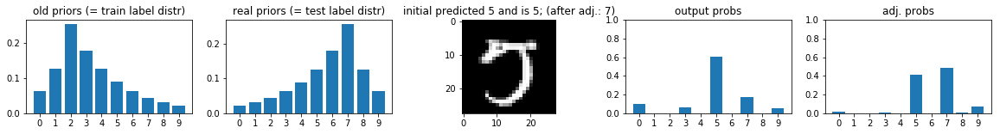

Old accuracy: 0.972 (2917/3000)
New accuracy: 0.976 (2928/3000)
#wrong_predicted_corrected_by_adj = 19
#correct_predicted_disturbed_by_adj = 8


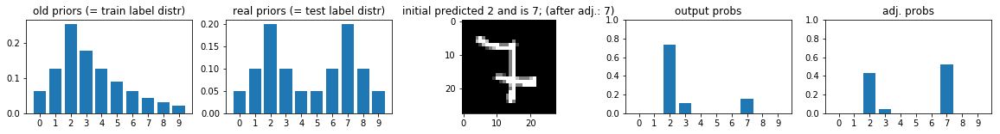

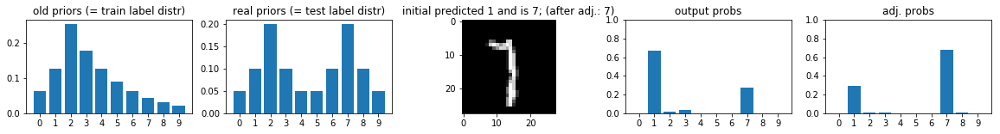

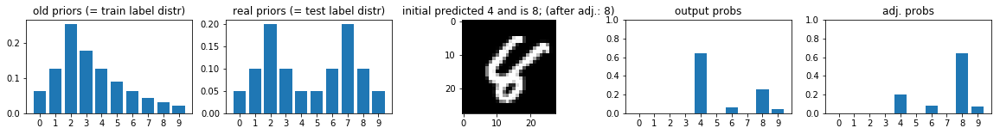

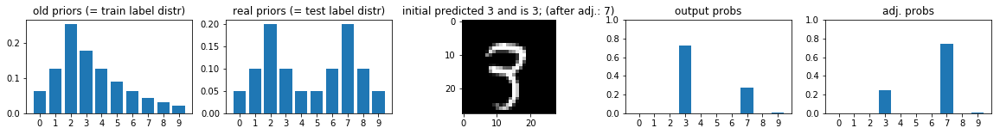

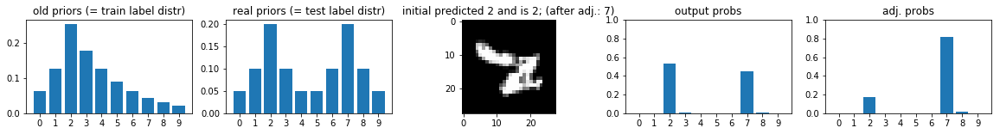

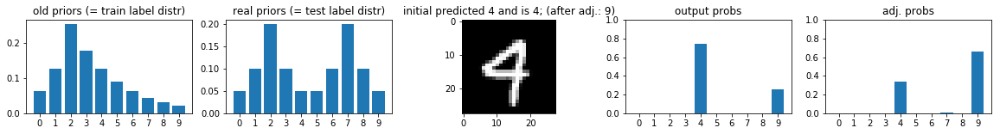

Old accuracy: 0.965 (2895/3000)
New accuracy: 0.973 (2920/3000)
#wrong_predicted_corrected_by_adj = 37
#correct_predicted_disturbed_by_adj = 12


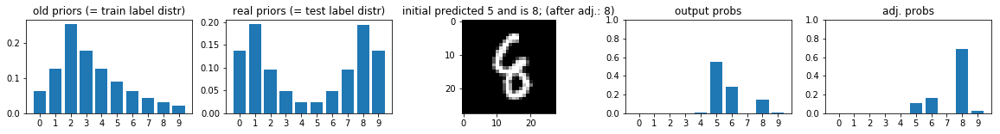

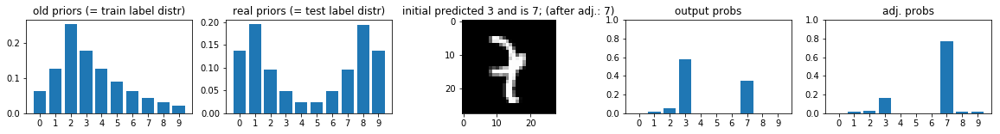

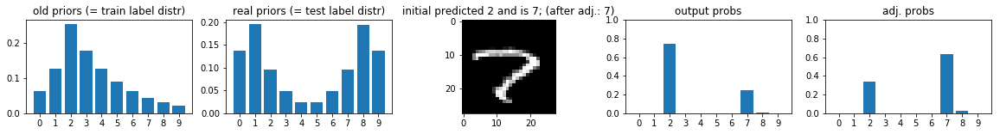

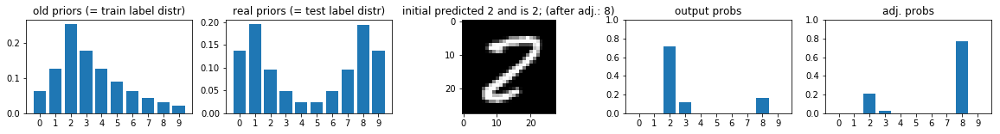

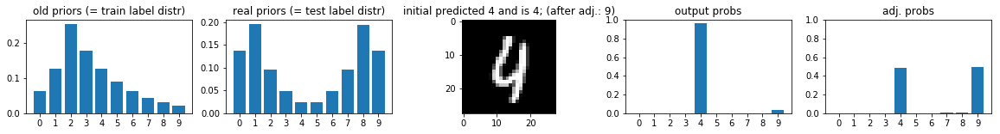

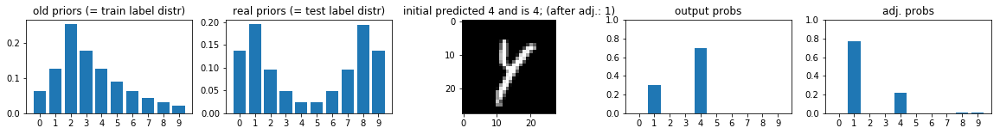

Old accuracy: 0.955 (2866/3000)
New accuracy: 0.968 (2905/3000)
#wrong_predicted_corrected_by_adj = 61
#correct_predicted_disturbed_by_adj = 22


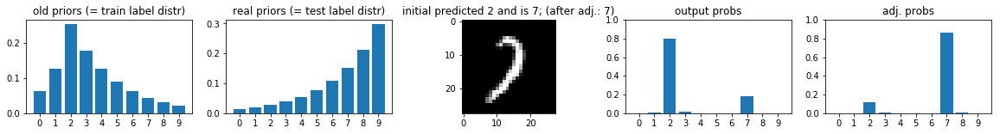

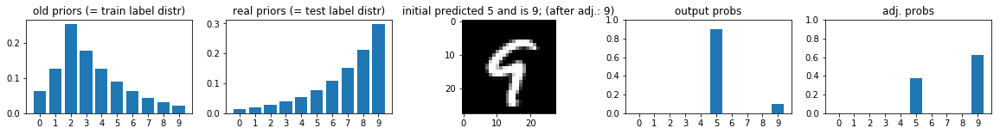

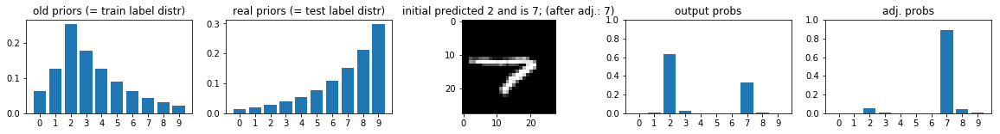

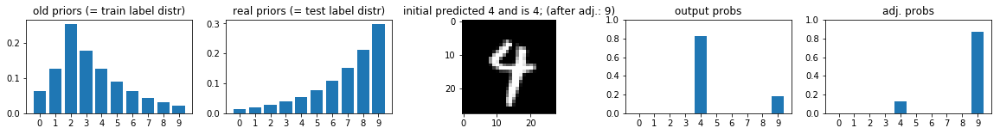

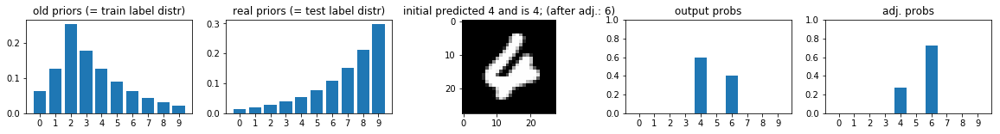

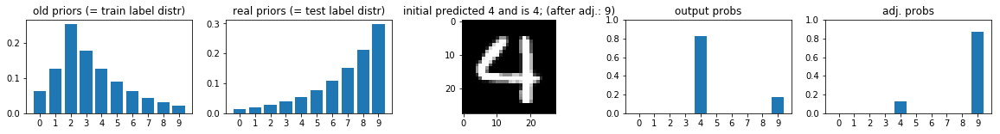

Old accuracy: 0.983 (2948/3000)
New accuracy: 0.983 (2949/3000)
#wrong_predicted_corrected_by_adj = 4
#correct_predicted_disturbed_by_adj = 3


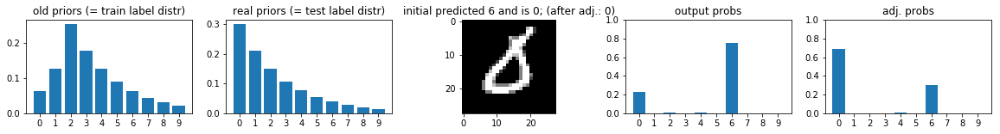

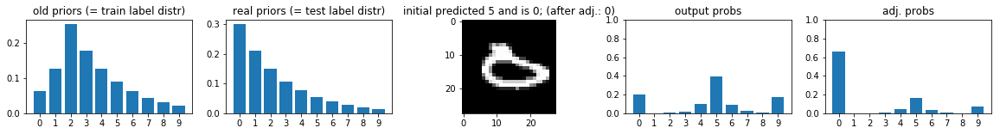

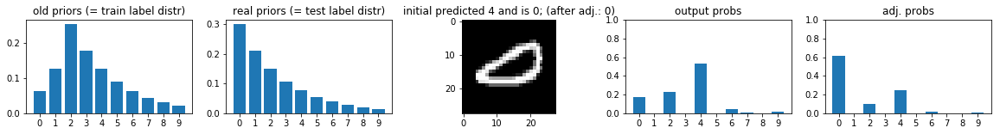

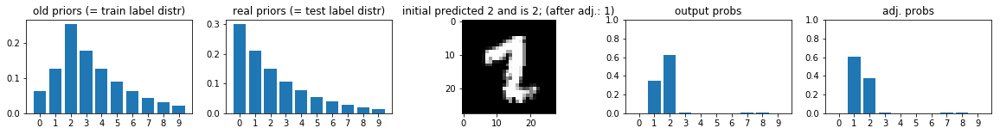

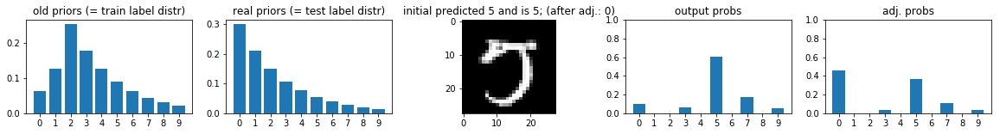

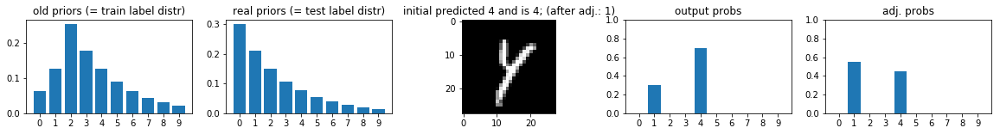

Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/3 Lenet5_with_imposed_distr_3_10000samples_2018_05_07---10_51.model.ckpt
Old accuracy: 0.976 (2929/3000)
New accuracy: 0.976 (2928/3000)
#wrong_predicted_corrected_by_adj = 11
#correct_predicted_disturbed_by_adj = 12


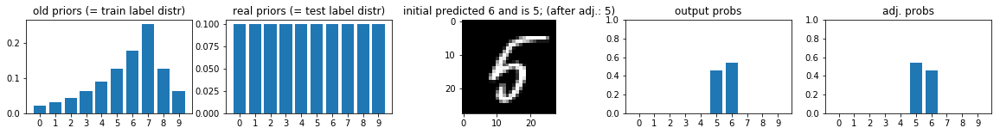

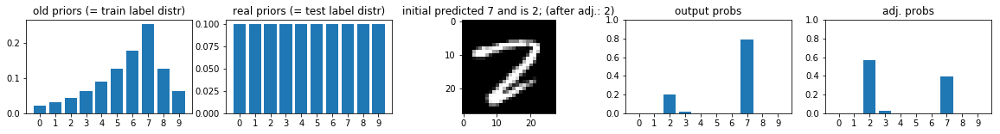

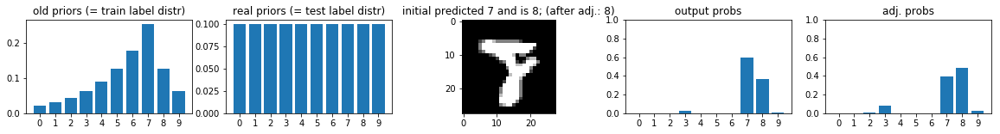

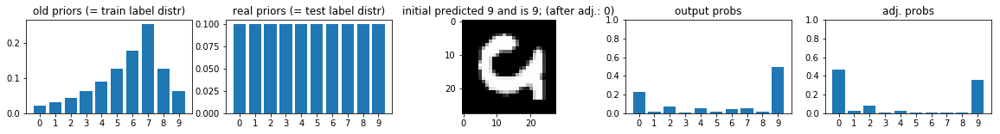

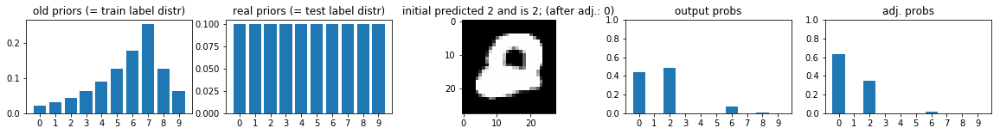

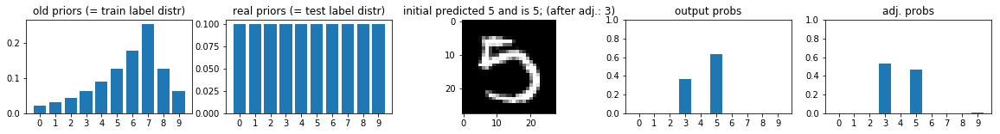

Old accuracy: 0.981 (2944/3000)
New accuracy: 0.984 (2953/3000)
#wrong_predicted_corrected_by_adj = 14
#correct_predicted_disturbed_by_adj = 5


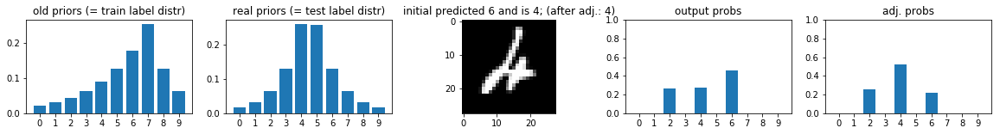

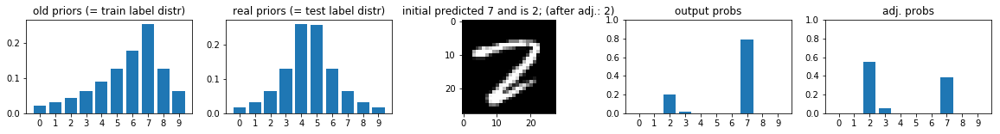

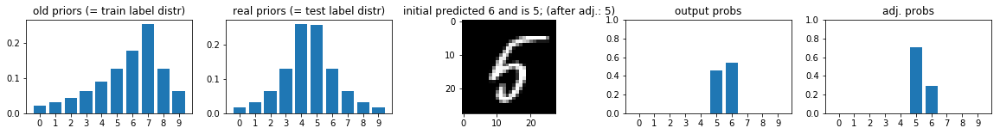

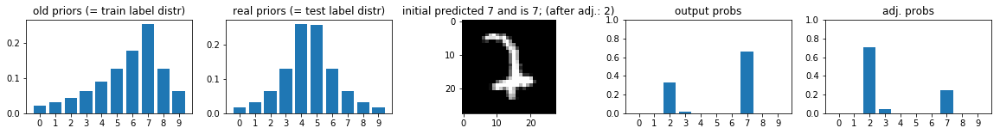

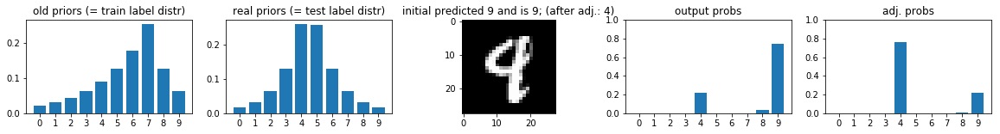

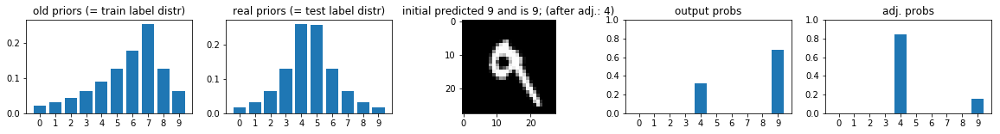

Old accuracy: 0.975 (2924/3000)
New accuracy: 0.979 (2937/3000)
#wrong_predicted_corrected_by_adj = 23
#correct_predicted_disturbed_by_adj = 10


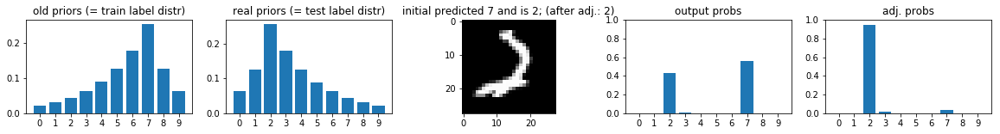

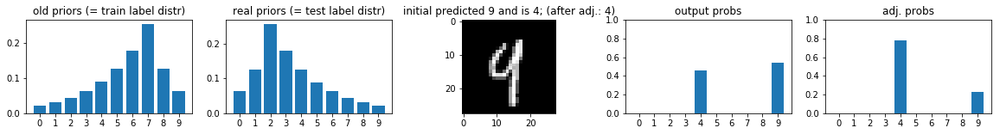

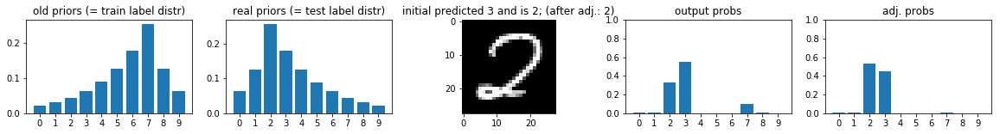

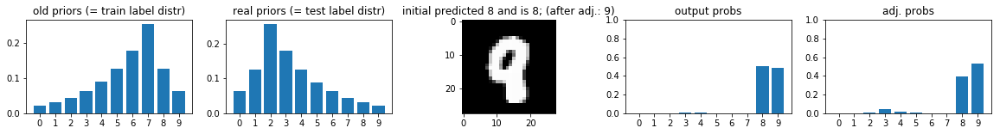

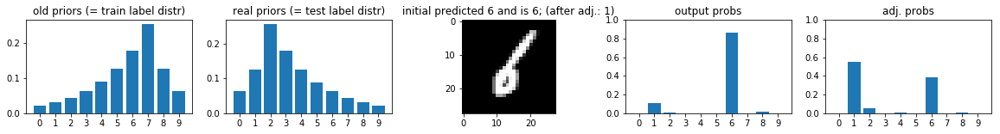

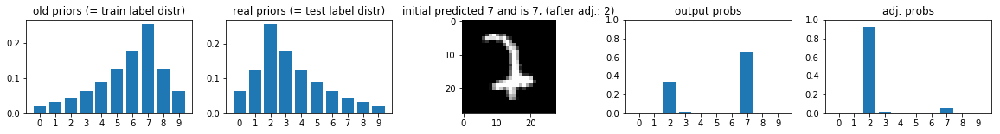

Old accuracy: 0.983 (2948/3000)
New accuracy: 0.983 (2948/3000)
#wrong_predicted_corrected_by_adj = 0
#correct_predicted_disturbed_by_adj = 0
Old accuracy: 0.977 (2931/3000)
New accuracy: 0.979 (2938/3000)
#wrong_predicted_corrected_by_adj = 13
#correct_predicted_disturbed_by_adj = 6


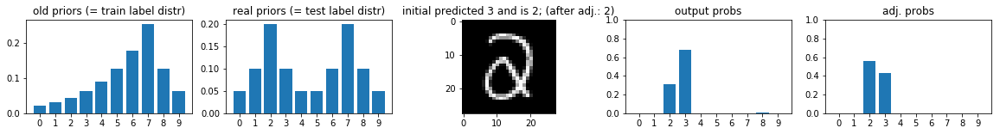

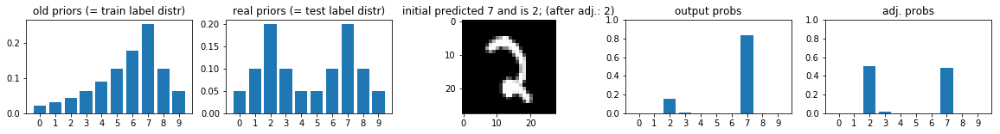

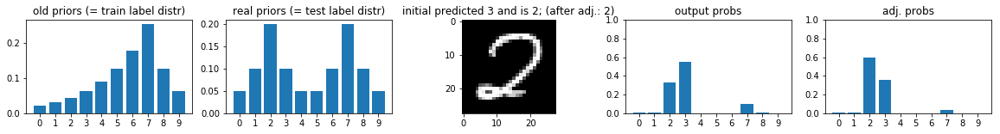

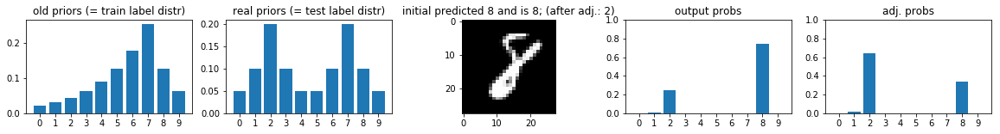

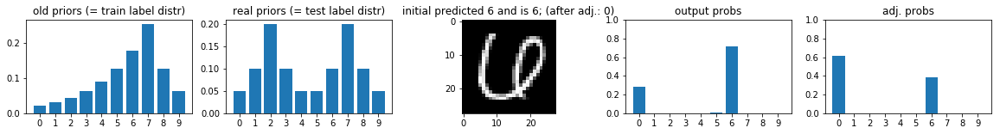

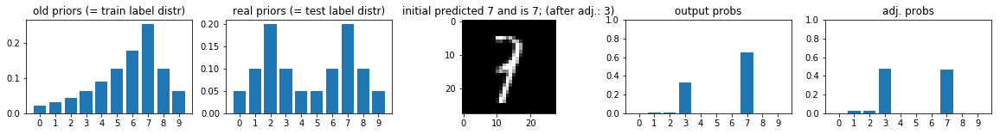

Old accuracy: 0.977 (2932/3000)
New accuracy: 0.978 (2935/3000)
#wrong_predicted_corrected_by_adj = 15
#correct_predicted_disturbed_by_adj = 12


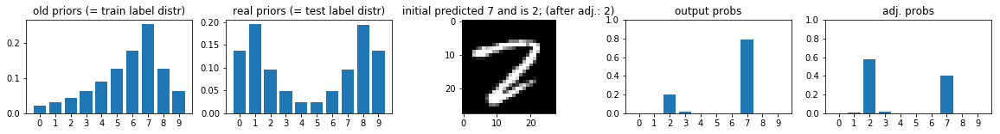

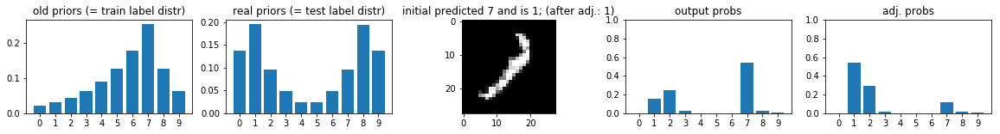

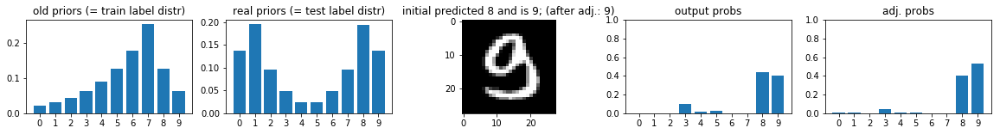

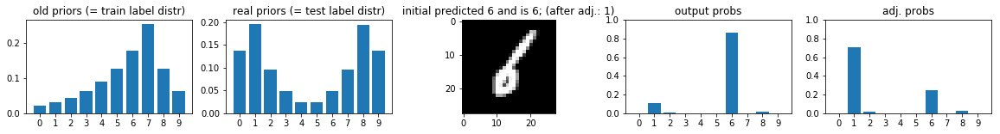

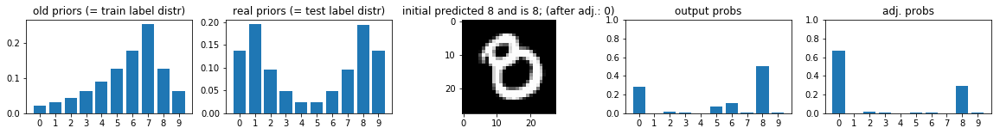

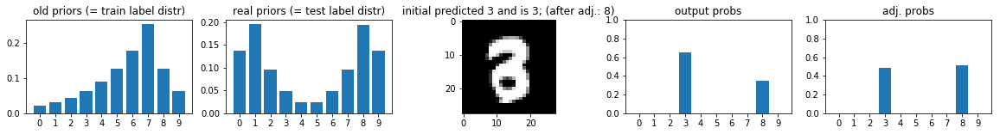

Old accuracy: 0.979 (2937/3000)
New accuracy: 0.983 (2948/3000)
#wrong_predicted_corrected_by_adj = 15
#correct_predicted_disturbed_by_adj = 4


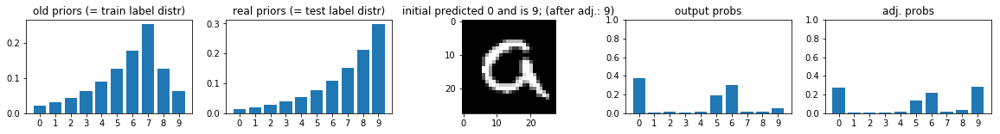

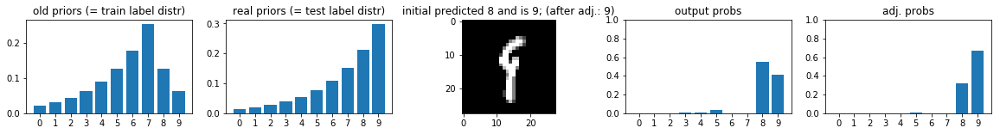

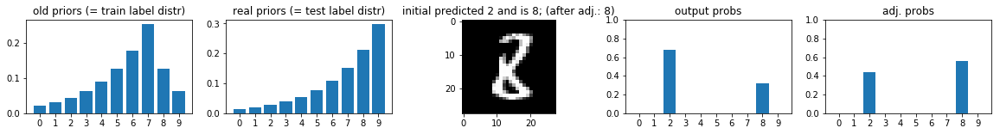

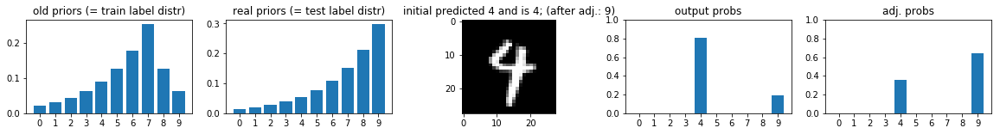

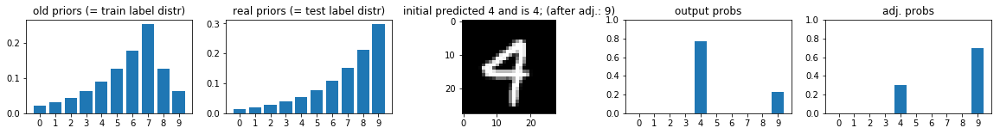

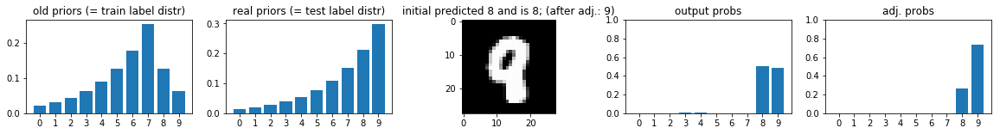

Old accuracy: 0.976 (2928/3000)
New accuracy: 0.981 (2942/3000)
#wrong_predicted_corrected_by_adj = 25
#correct_predicted_disturbed_by_adj = 11


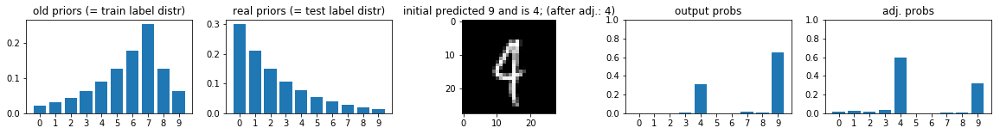

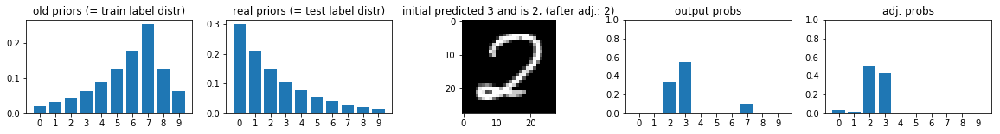

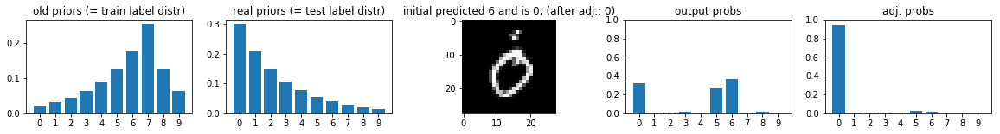

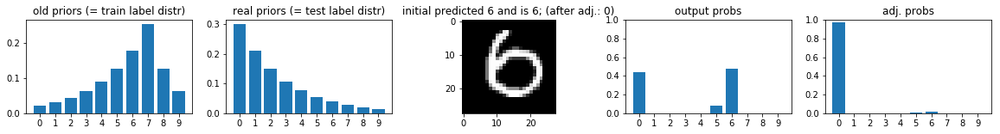

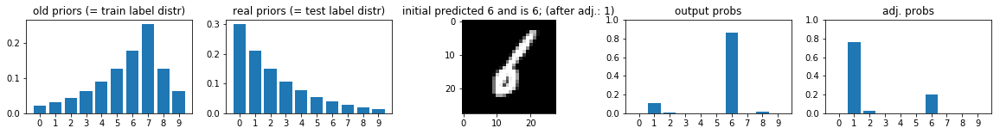

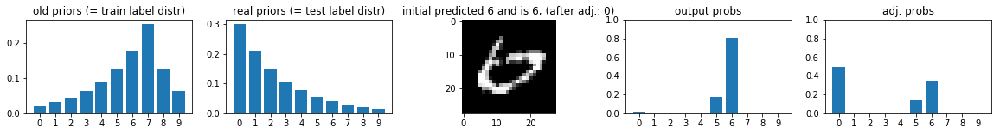

Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/4 Lenet5_with_imposed_distr_4_10000samples_2018_05_07---10_56.model.ckpt
Old accuracy: 0.982 (2945/3000)
New accuracy: 0.982 (2947/3000)
#wrong_predicted_corrected_by_adj = 5
#correct_predicted_disturbed_by_adj = 3


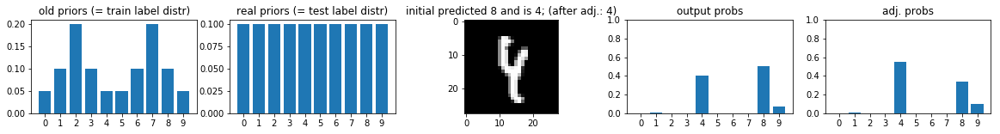

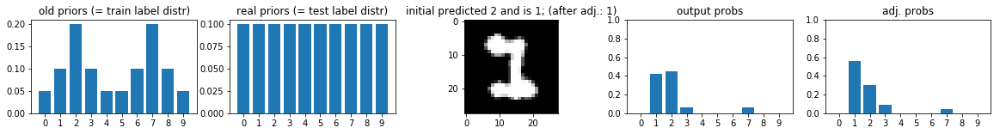

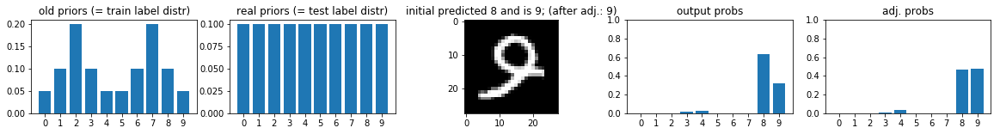

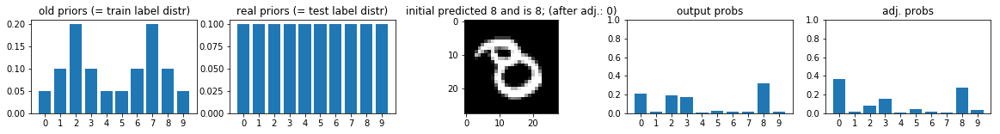

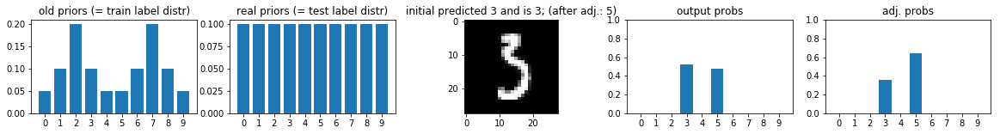

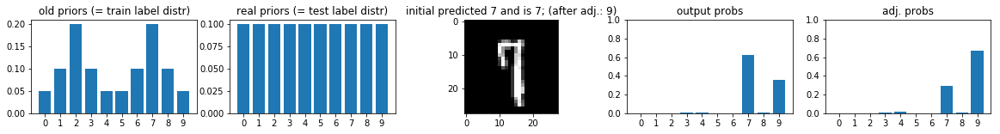

Old accuracy: 0.981 (2943/3000)
New accuracy: 0.987 (2961/3000)
#wrong_predicted_corrected_by_adj = 23
#correct_predicted_disturbed_by_adj = 5


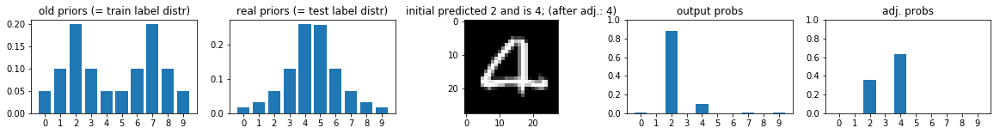

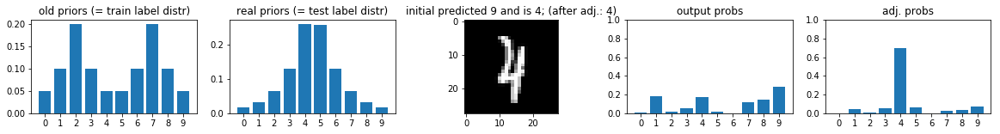

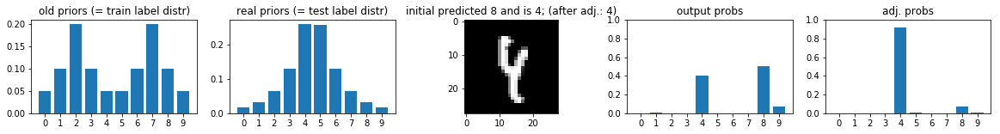

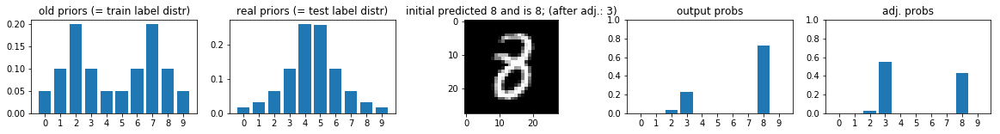

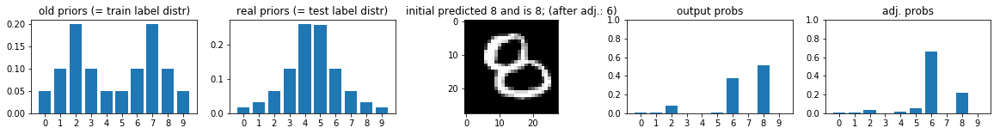

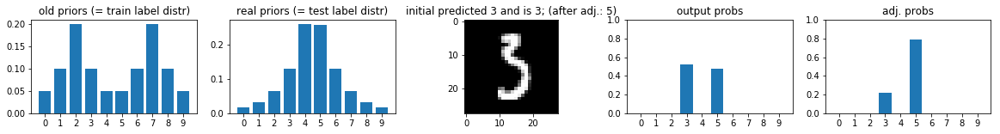

Old accuracy: 0.985 (2955/3000)
New accuracy: 0.986 (2957/3000)
#wrong_predicted_corrected_by_adj = 5
#correct_predicted_disturbed_by_adj = 3


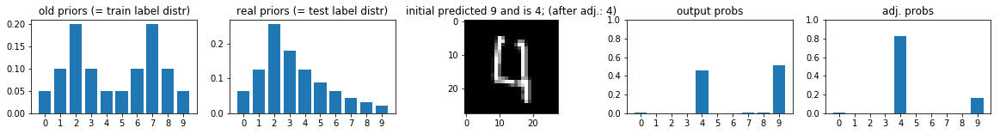

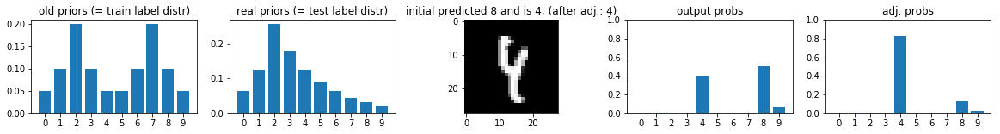

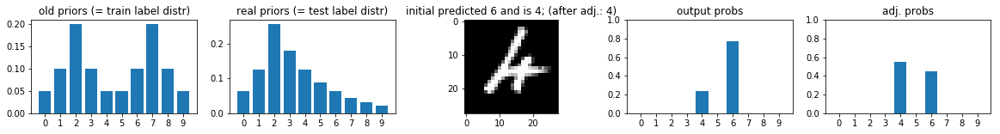

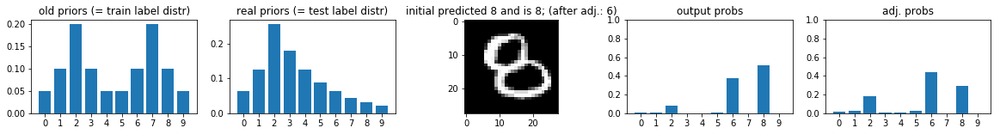

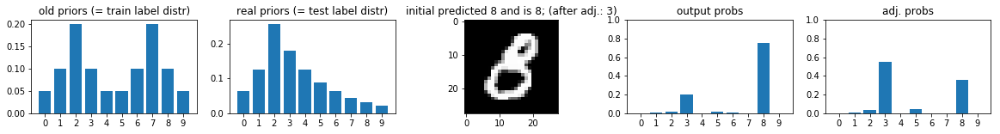

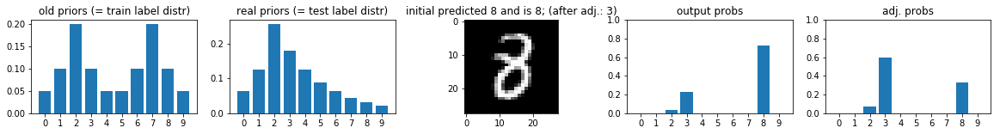

Old accuracy: 0.982 (2945/3000)
New accuracy: 0.984 (2951/3000)
#wrong_predicted_corrected_by_adj = 12
#correct_predicted_disturbed_by_adj = 6


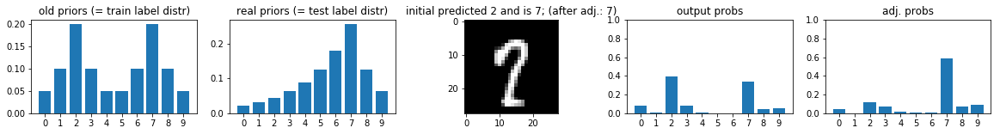

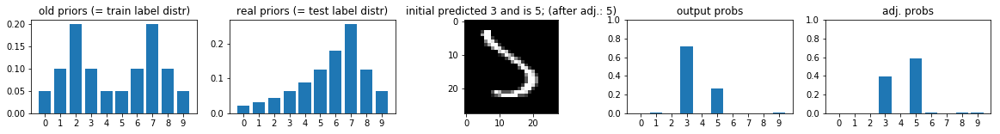

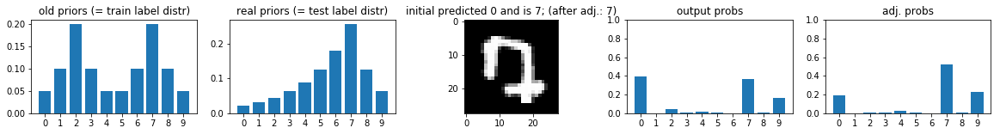

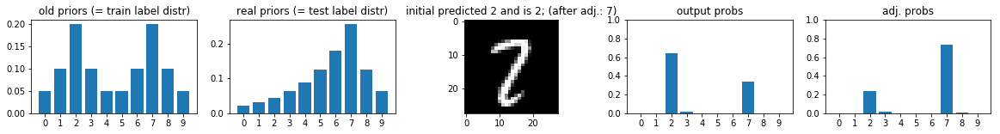

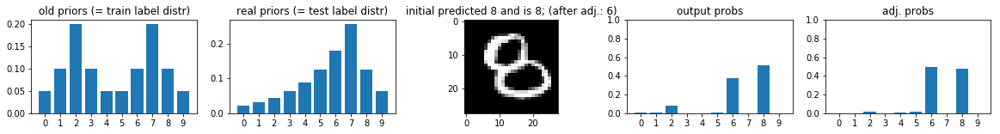

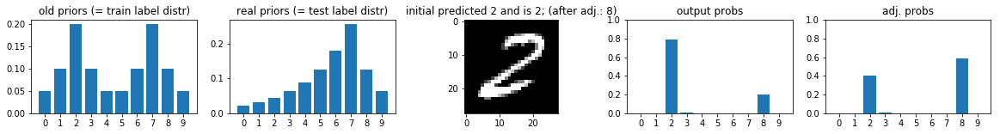

Old accuracy: 0.984 (2951/3000)
New accuracy: 0.984 (2951/3000)
#wrong_predicted_corrected_by_adj = 9
#correct_predicted_disturbed_by_adj = 9


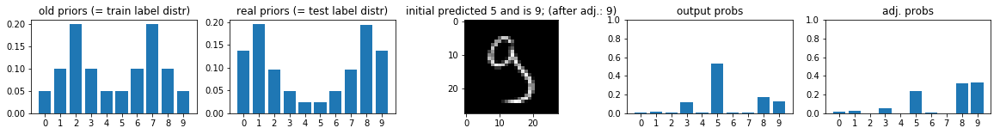

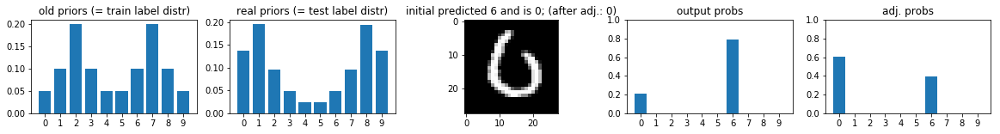

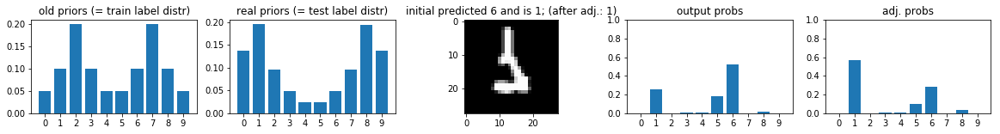

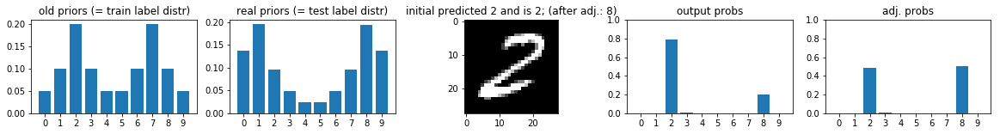

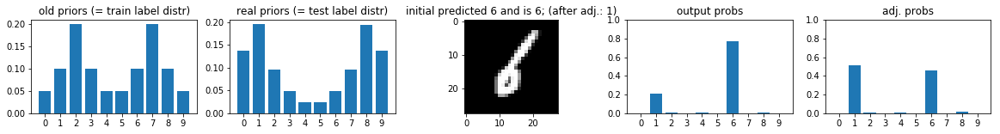

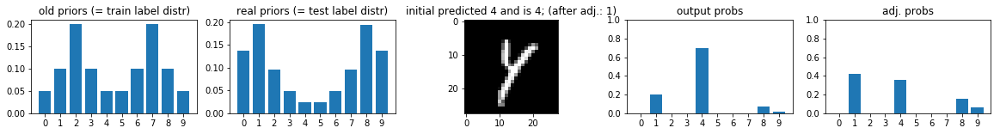

Old accuracy: 0.978 (2933/3000)
New accuracy: 0.979 (2938/3000)
#wrong_predicted_corrected_by_adj = 20
#correct_predicted_disturbed_by_adj = 15


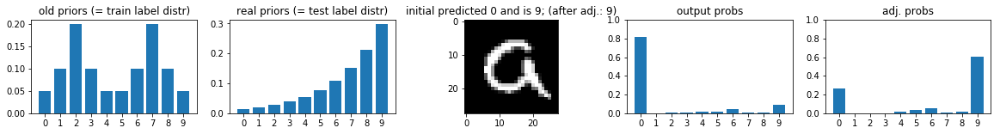

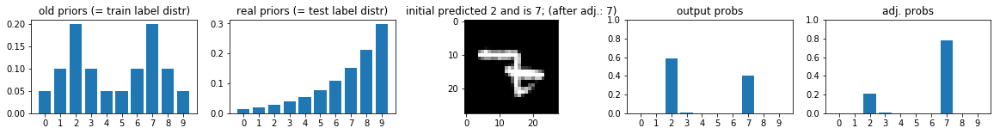

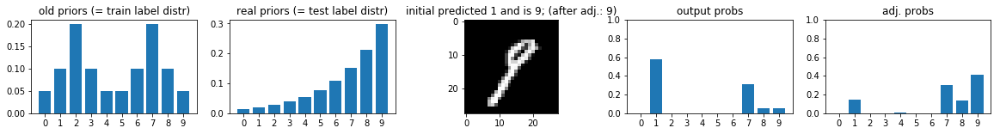

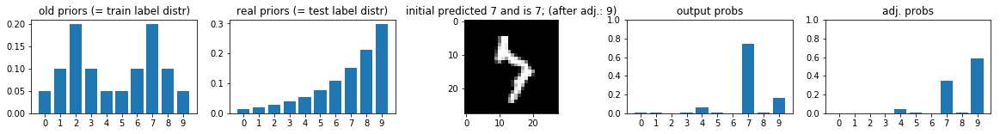

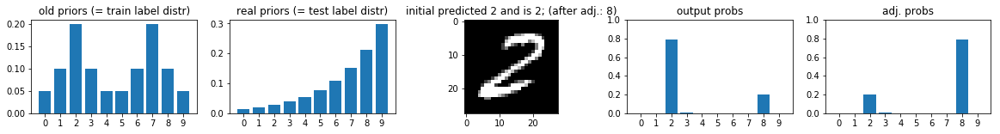

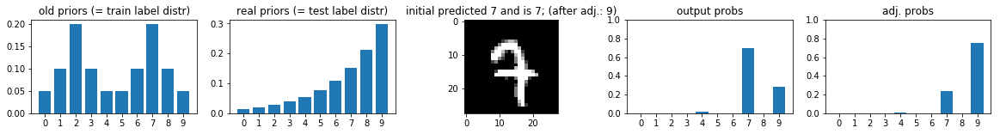

Old accuracy: 0.986 (2957/3000)
New accuracy: 0.989 (2968/3000)
#wrong_predicted_corrected_by_adj = 14
#correct_predicted_disturbed_by_adj = 3


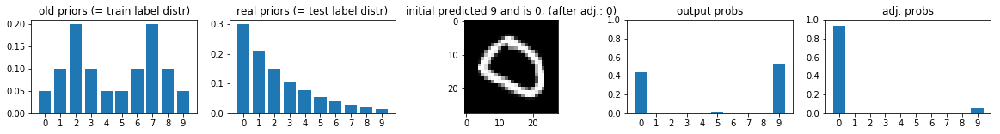

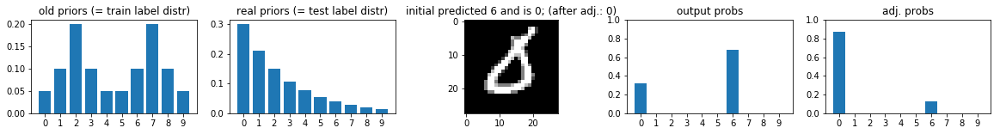

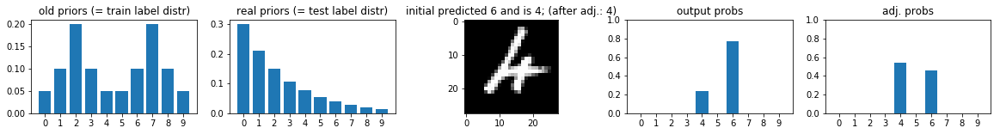

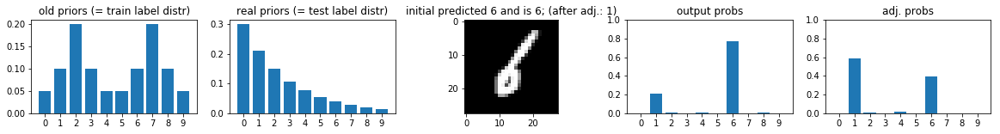

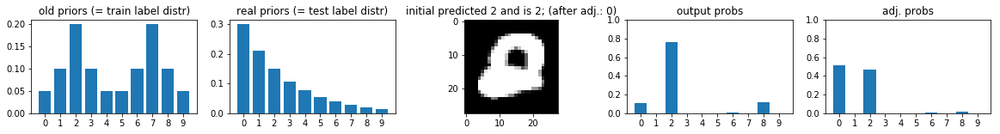

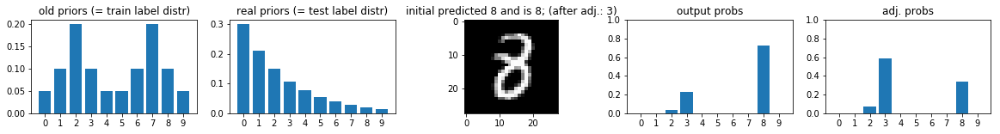

Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/5 Lenet5_with_imposed_distr_5_10000samples_2018_05_07---11_02.model.ckpt
Old accuracy: 0.972 (2916/3000)
New accuracy: 0.975 (2924/3000)
#wrong_predicted_corrected_by_adj = 17
#correct_predicted_disturbed_by_adj = 9


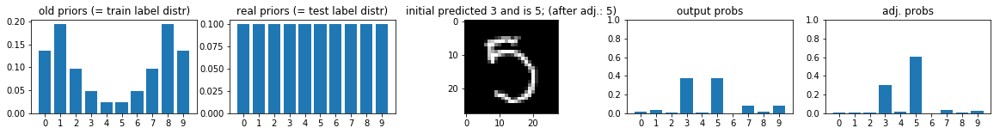

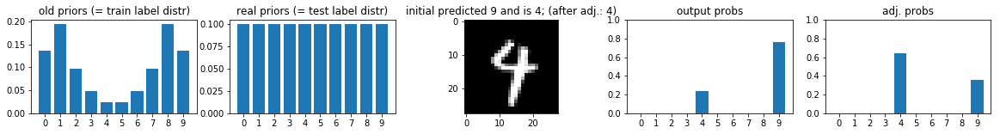

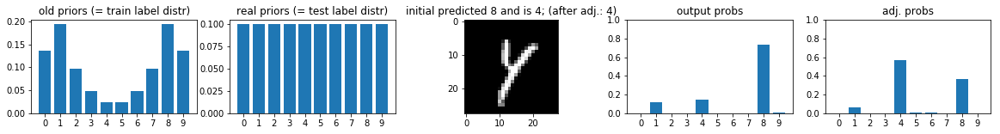

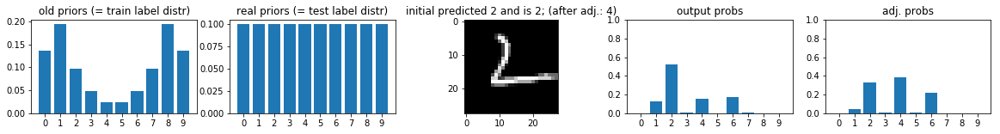

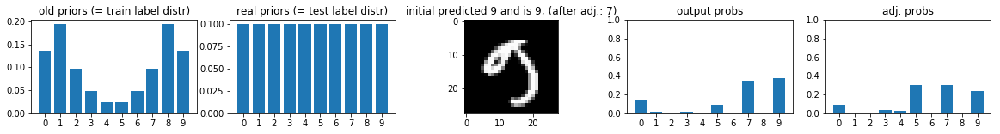

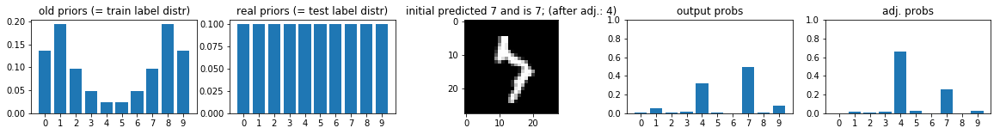

Old accuracy: 0.966 (2899/3000)
New accuracy: 0.975 (2925/3000)
#wrong_predicted_corrected_by_adj = 39
#correct_predicted_disturbed_by_adj = 13


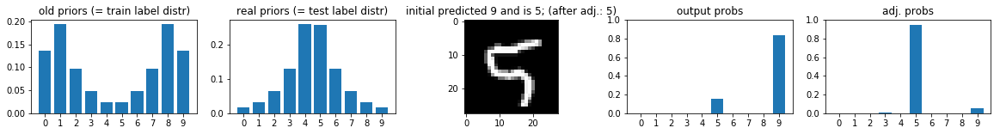

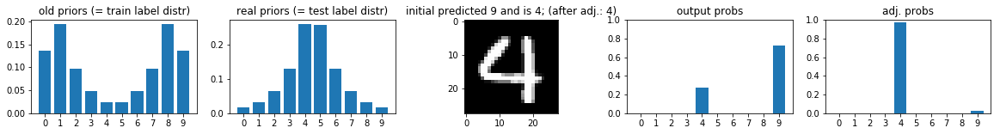

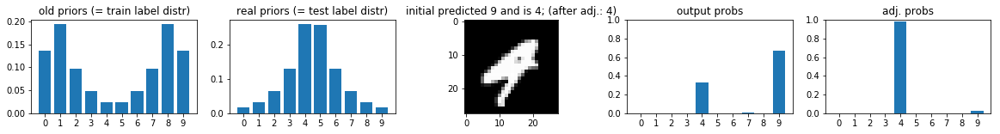

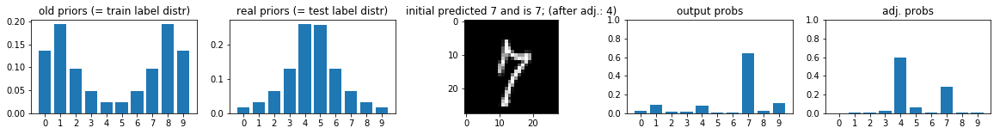

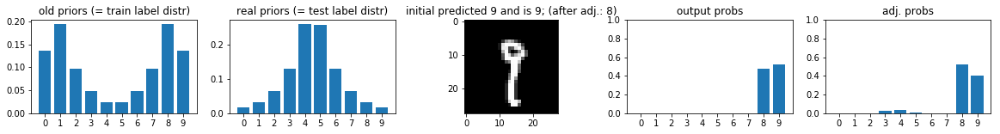

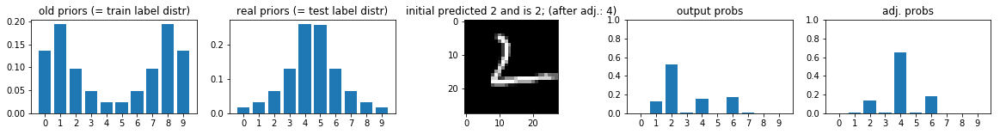

Old accuracy: 0.974 (2921/3000)
New accuracy: 0.981 (2944/3000)
#wrong_predicted_corrected_by_adj = 25
#correct_predicted_disturbed_by_adj = 2


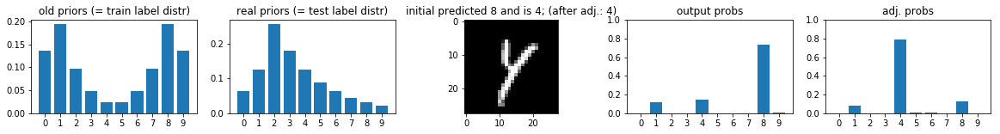

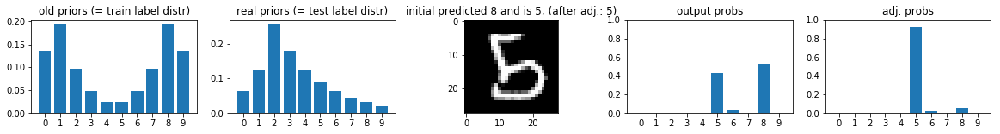

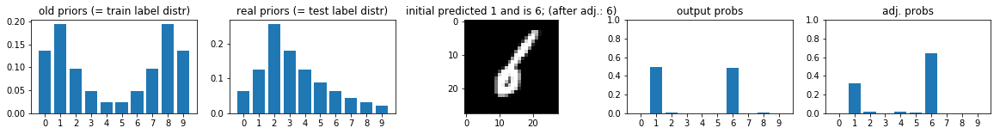

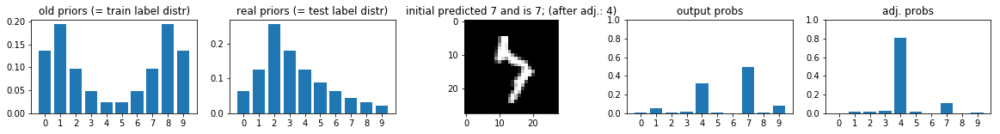

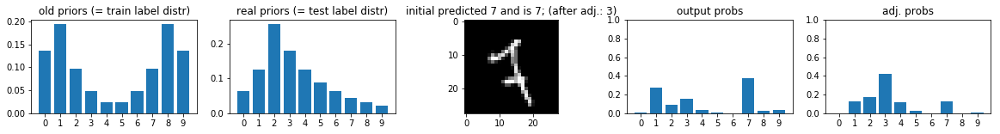

Old accuracy: 0.970 (2909/3000)
New accuracy: 0.977 (2930/3000)
#wrong_predicted_corrected_by_adj = 25
#correct_predicted_disturbed_by_adj = 4


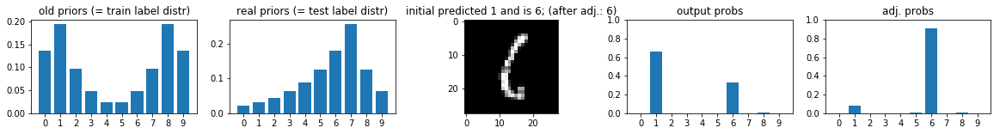

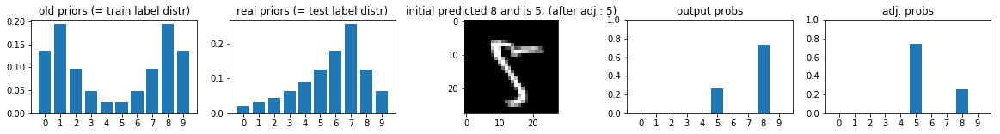

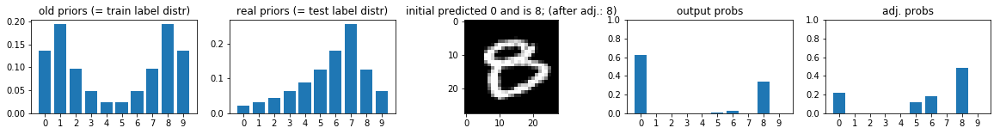

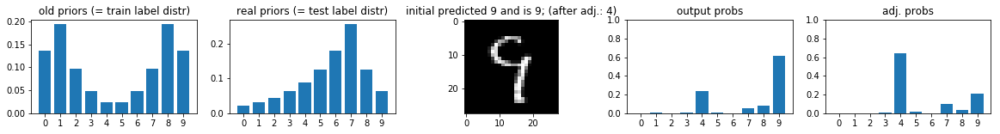

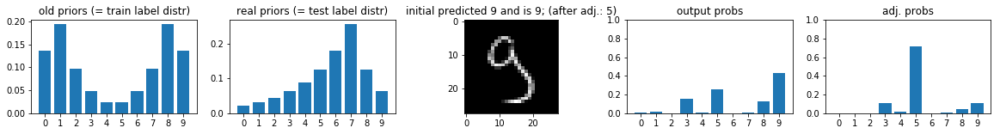

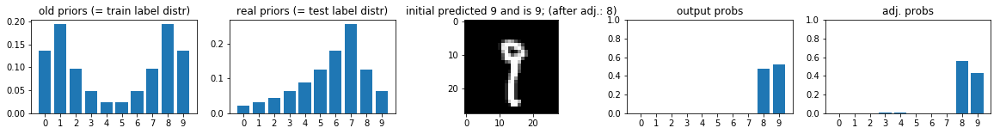

Old accuracy: 0.975 (2925/3000)
New accuracy: 0.977 (2932/3000)
#wrong_predicted_corrected_by_adj = 10
#correct_predicted_disturbed_by_adj = 3


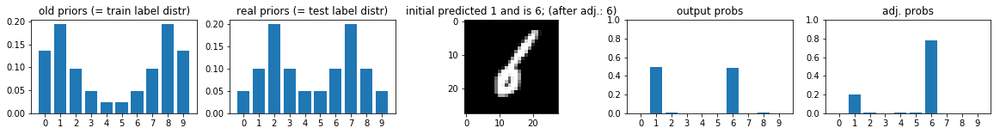

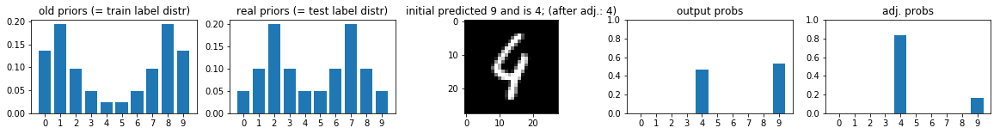

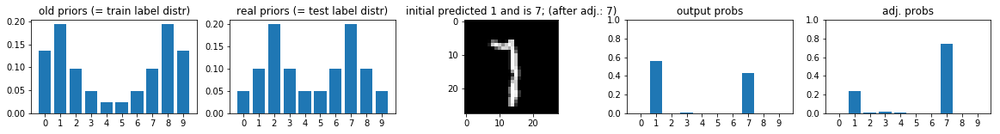

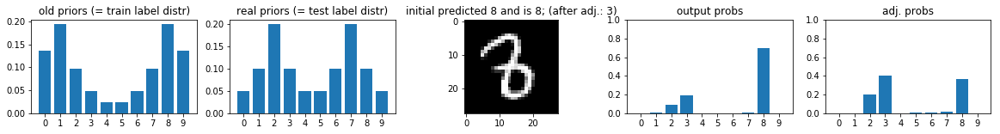

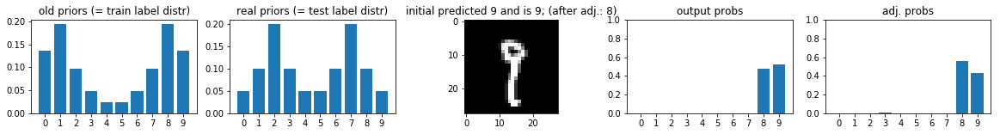

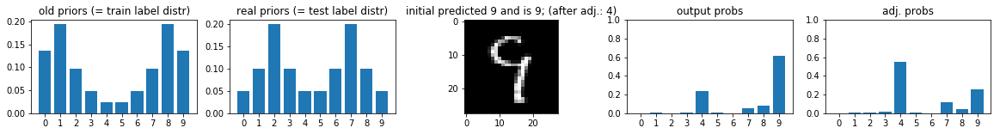

Old accuracy: 0.980 (2940/3000)
New accuracy: 0.980 (2940/3000)
#wrong_predicted_corrected_by_adj = 0
#correct_predicted_disturbed_by_adj = 0
Old accuracy: 0.972 (2916/3000)
New accuracy: 0.977 (2930/3000)
#wrong_predicted_corrected_by_adj = 16
#correct_predicted_disturbed_by_adj = 2


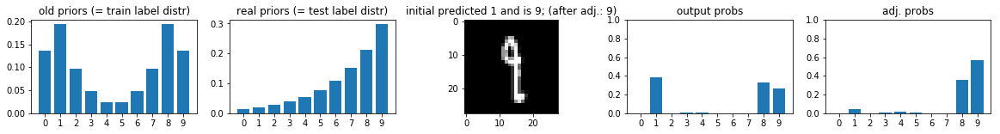

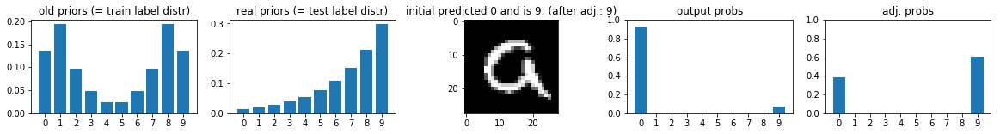

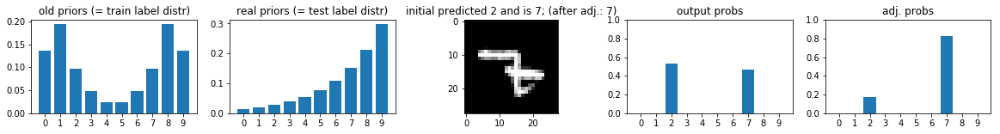

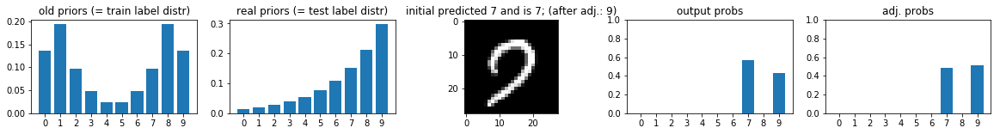

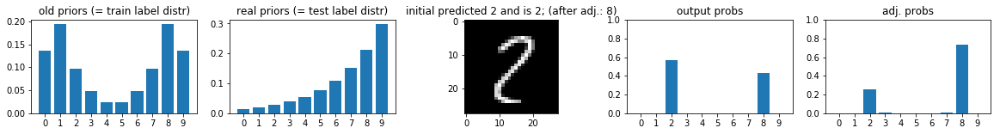

Old accuracy: 0.981 (2942/3000)
New accuracy: 0.987 (2962/3000)
#wrong_predicted_corrected_by_adj = 21
#correct_predicted_disturbed_by_adj = 1


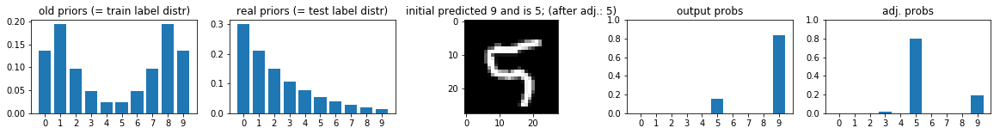

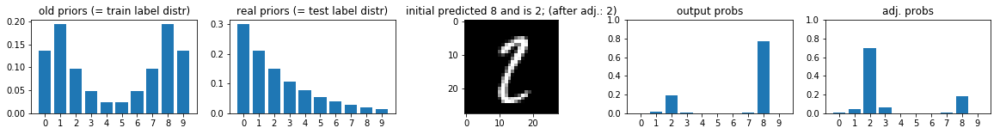

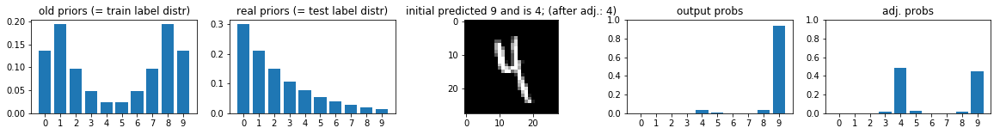

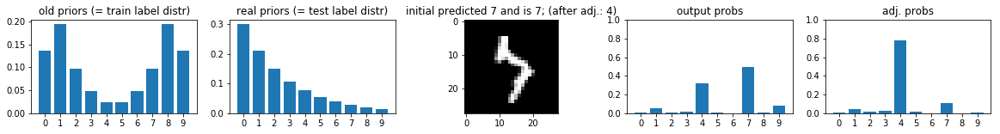

Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/6 Lenet5_with_imposed_distr_6_10000samples_2018_05_07---11_08.model.ckpt
Old accuracy: 0.964 (2893/3000)
New accuracy: 0.969 (2907/3000)
#wrong_predicted_corrected_by_adj = 24
#correct_predicted_disturbed_by_adj = 10


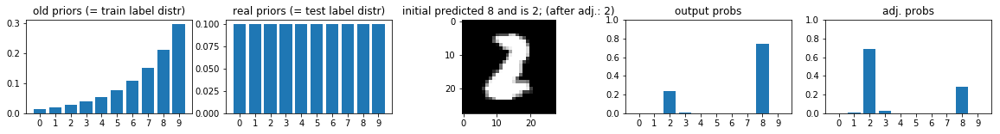

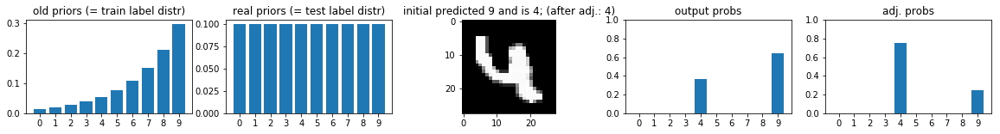

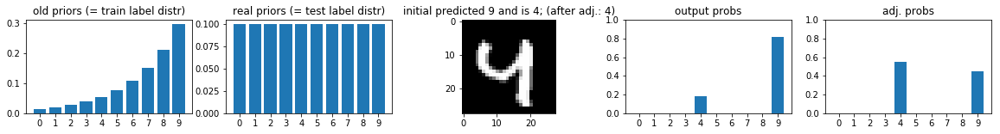

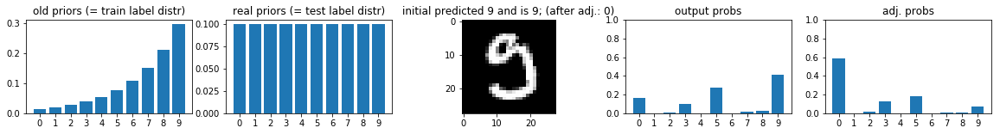

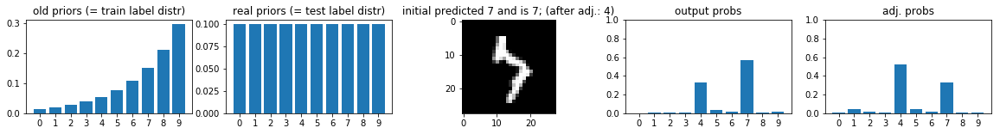

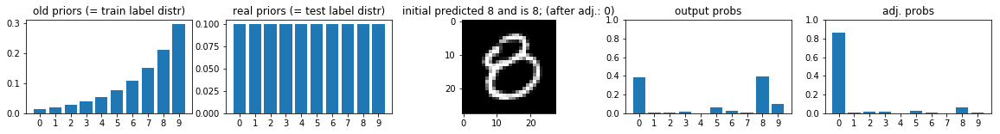

Old accuracy: 0.966 (2898/3000)
New accuracy: 0.976 (2927/3000)
#wrong_predicted_corrected_by_adj = 37
#correct_predicted_disturbed_by_adj = 8


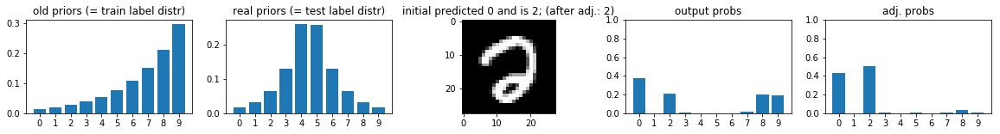

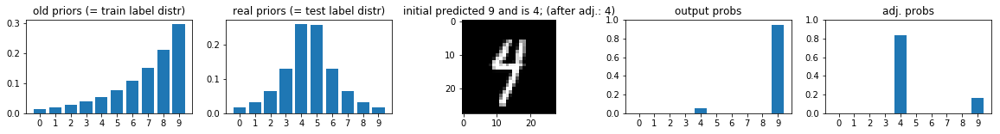

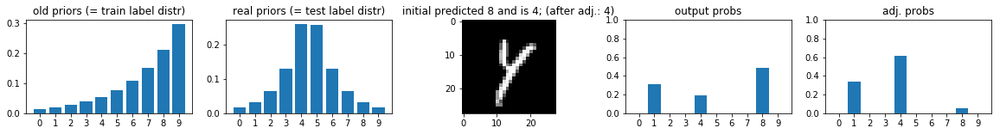

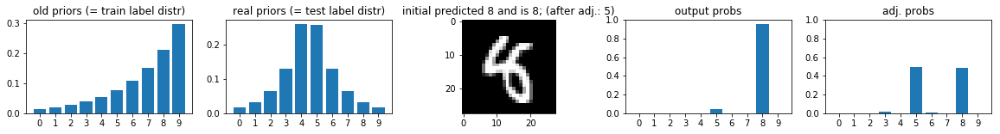

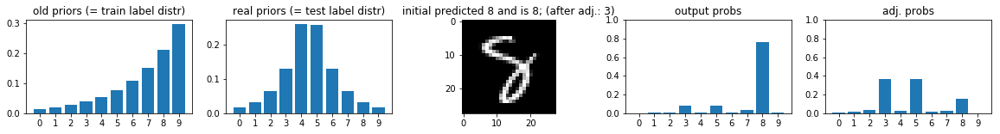

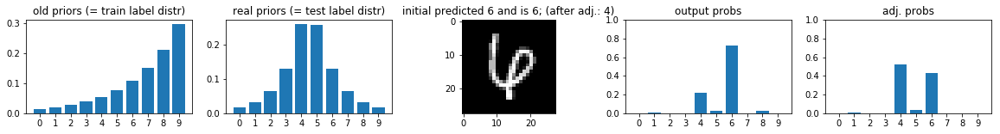

Old accuracy: 0.957 (2872/3000)
New accuracy: 0.973 (2919/3000)
#wrong_predicted_corrected_by_adj = 54
#correct_predicted_disturbed_by_adj = 7


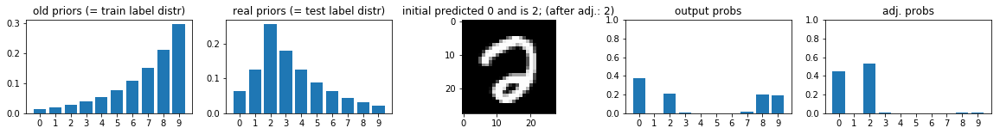

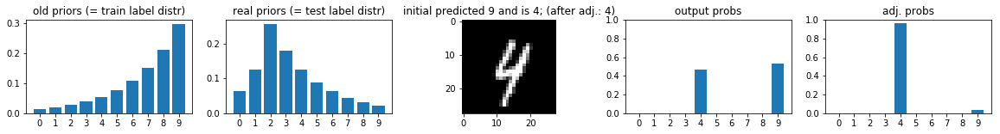

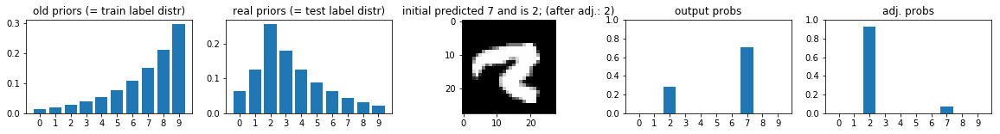

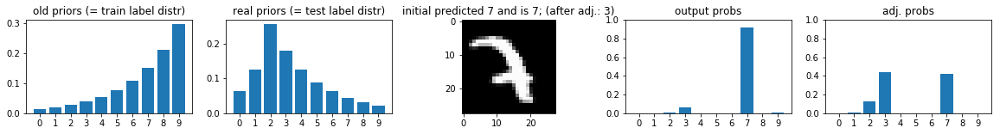

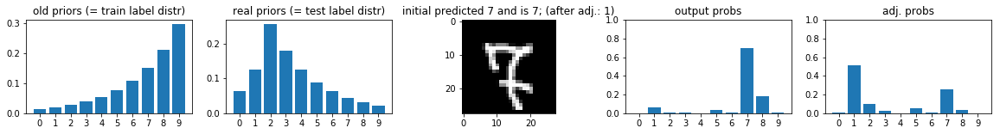

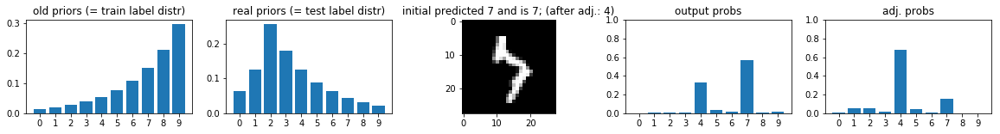

Old accuracy: 0.972 (2916/3000)
New accuracy: 0.976 (2927/3000)
#wrong_predicted_corrected_by_adj = 15
#correct_predicted_disturbed_by_adj = 4


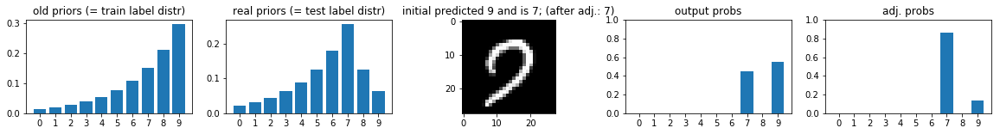

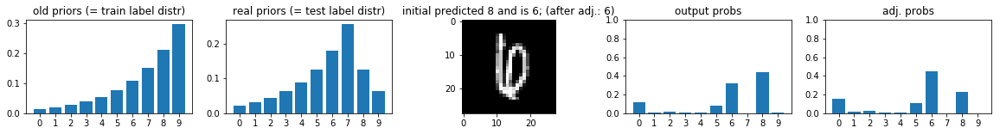

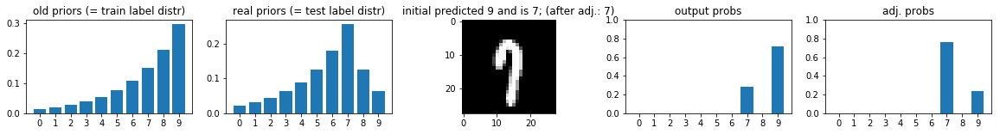

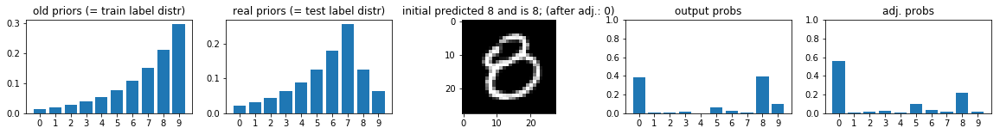

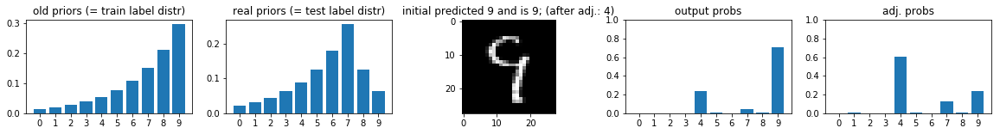

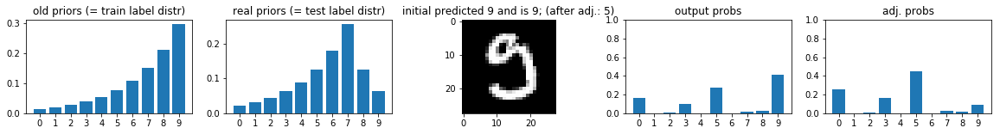

Old accuracy: 0.967 (2900/3000)
New accuracy: 0.974 (2922/3000)
#wrong_predicted_corrected_by_adj = 28
#correct_predicted_disturbed_by_adj = 6


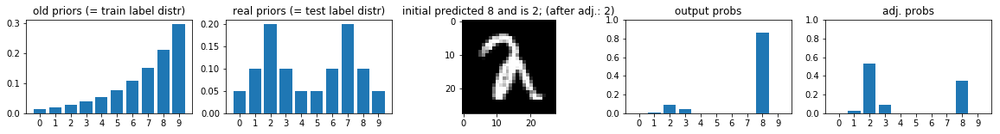

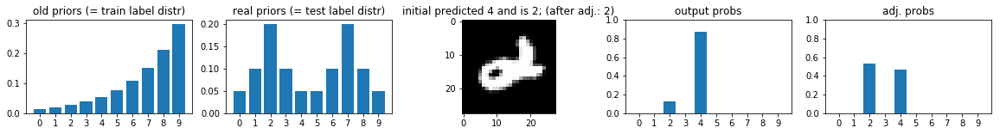

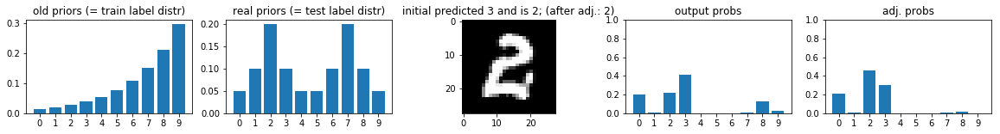

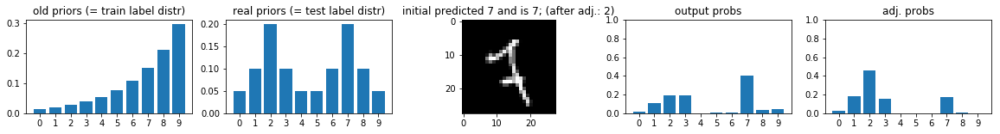

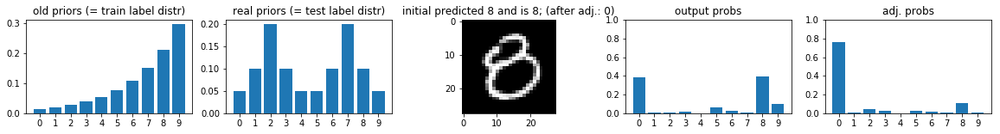

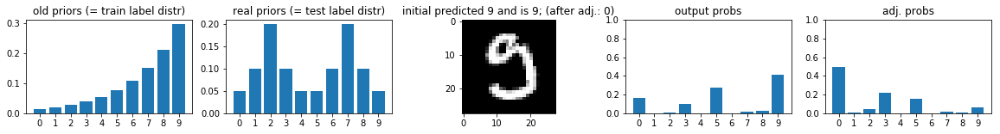

Old accuracy: 0.971 (2914/3000)
New accuracy: 0.974 (2922/3000)
#wrong_predicted_corrected_by_adj = 22
#correct_predicted_disturbed_by_adj = 14


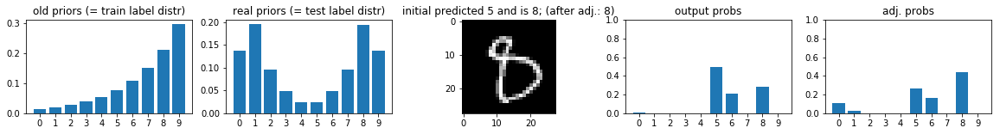

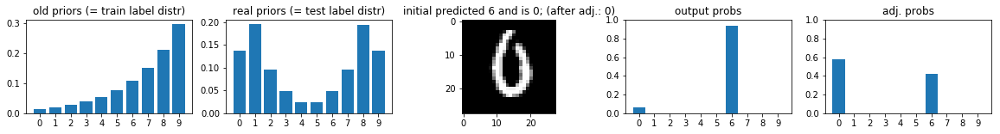

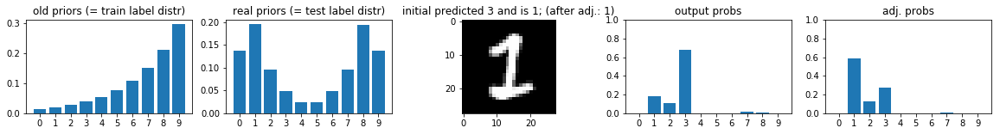

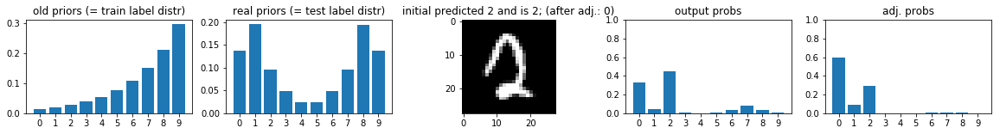

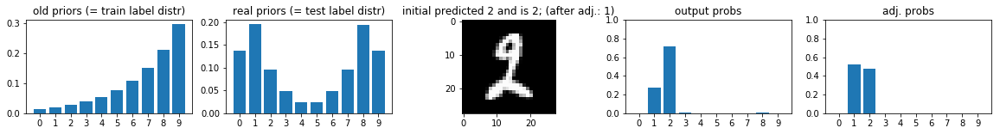

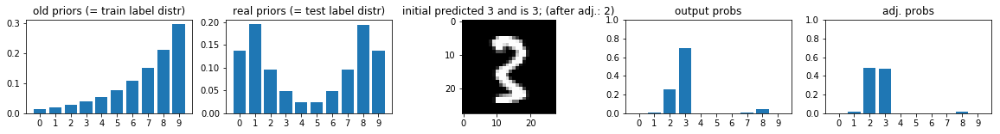

Old accuracy: 0.977 (2931/3000)
New accuracy: 0.977 (2931/3000)
#wrong_predicted_corrected_by_adj = 0
#correct_predicted_disturbed_by_adj = 0
Old accuracy: 0.963 (2890/3000)
New accuracy: 0.979 (2936/3000)
#wrong_predicted_corrected_by_adj = 52
#correct_predicted_disturbed_by_adj = 6


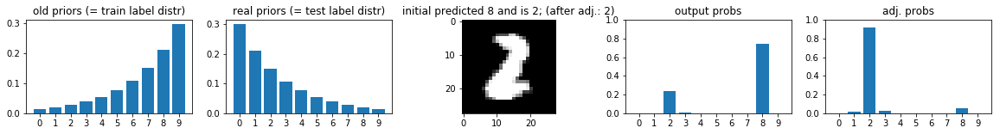

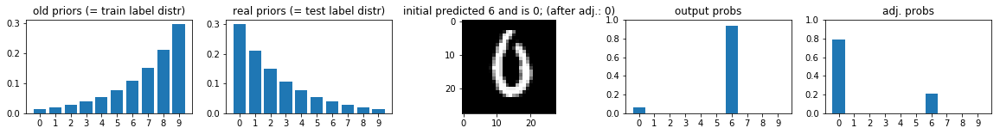

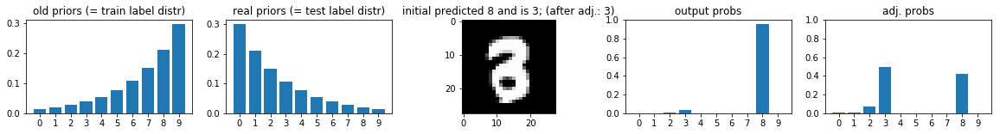

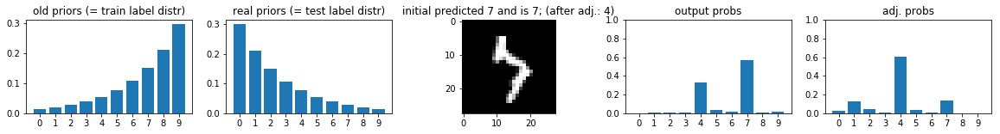

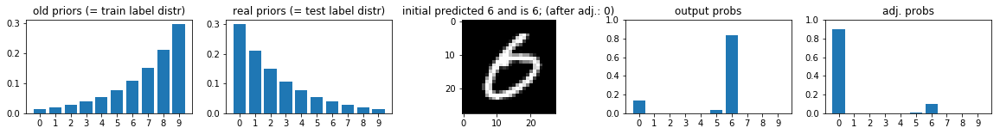

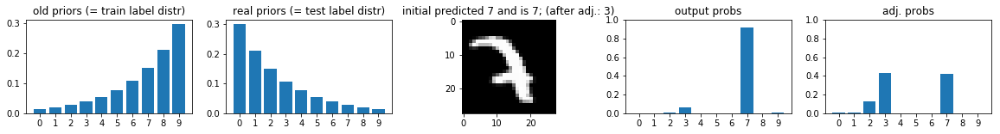

Restoring model ./results/PriorProbabilityShift_experiment_5_10000samples/7 Lenet5_with_imposed_distr_7_10000samples_2018_05_07---11_14.model.ckpt
Old accuracy: 0.961 (2882/3000)
New accuracy: 0.969 (2907/3000)
#wrong_predicted_corrected_by_adj = 32
#correct_predicted_disturbed_by_adj = 7


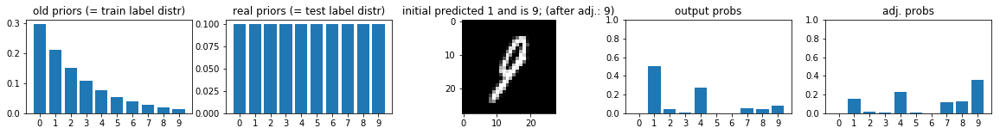

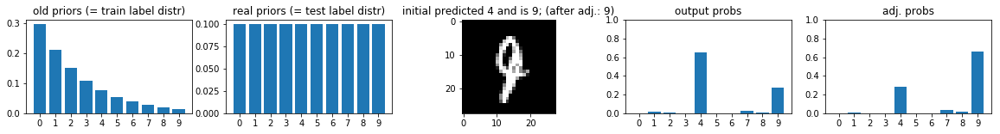

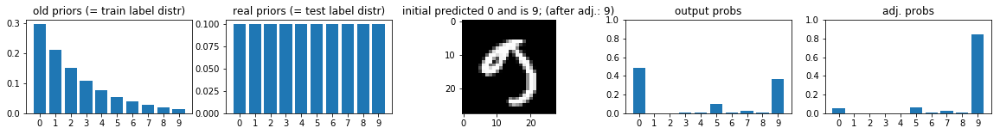

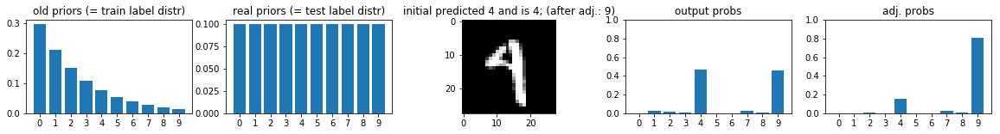

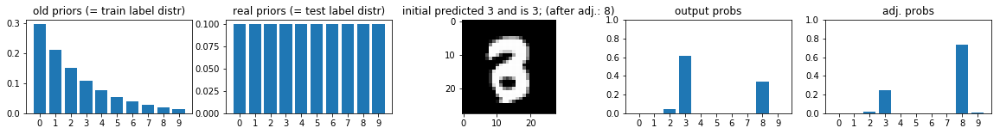

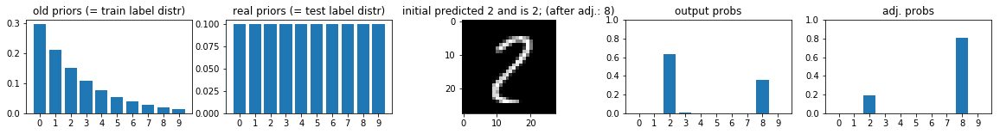

Old accuracy: 0.969 (2906/3000)
New accuracy: 0.974 (2923/3000)
#wrong_predicted_corrected_by_adj = 22
#correct_predicted_disturbed_by_adj = 5


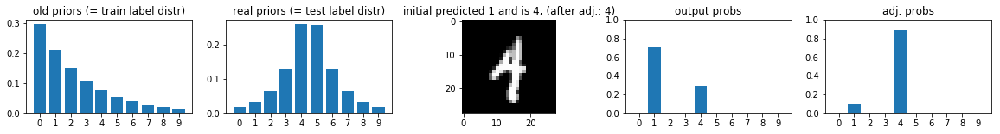

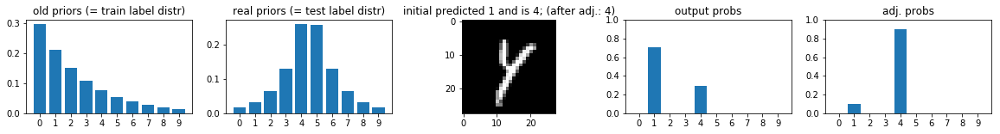

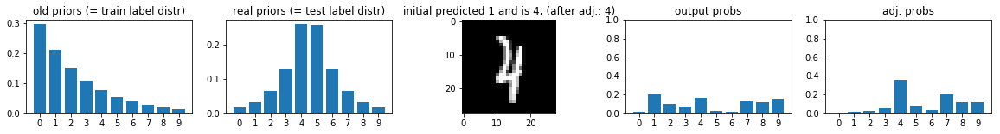

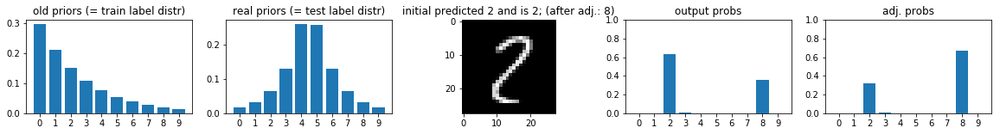

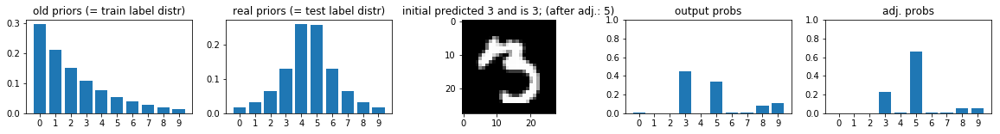

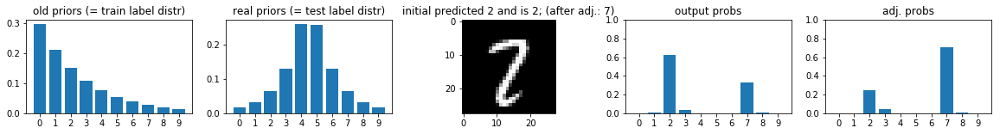

Old accuracy: 0.977 (2931/3000)
New accuracy: 0.979 (2936/3000)
#wrong_predicted_corrected_by_adj = 5
#correct_predicted_disturbed_by_adj = 0


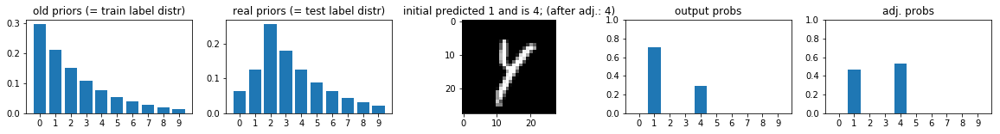

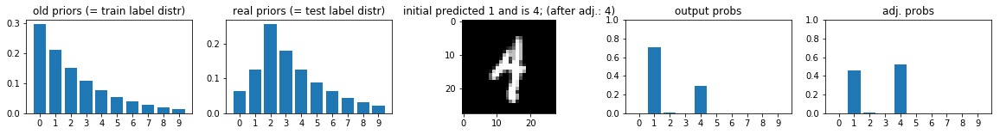

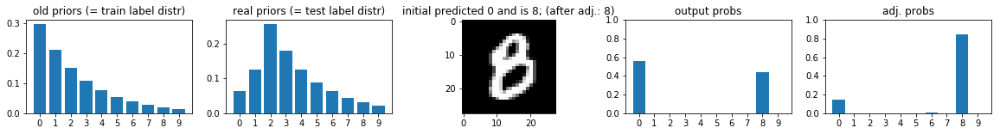

Old accuracy: 0.950 (2850/3000)
New accuracy: 0.966 (2897/3000)
#wrong_predicted_corrected_by_adj = 58
#correct_predicted_disturbed_by_adj = 11


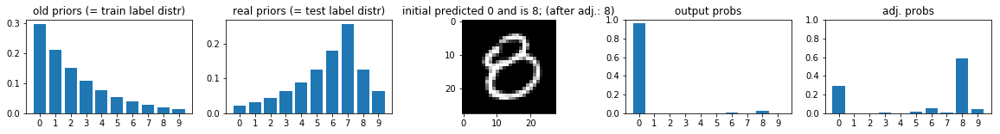

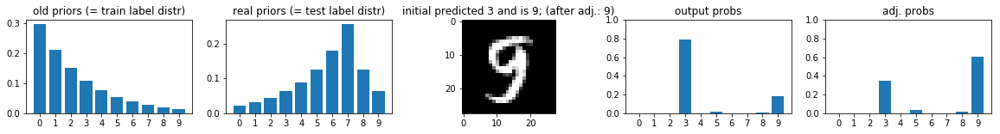

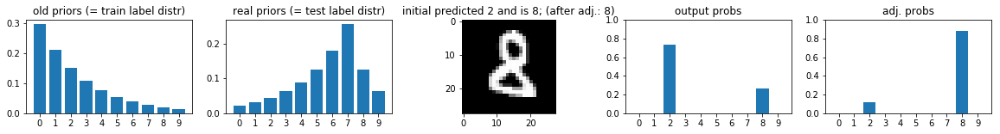

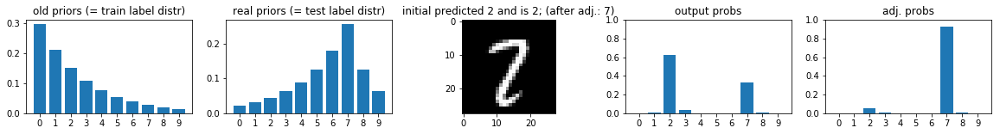

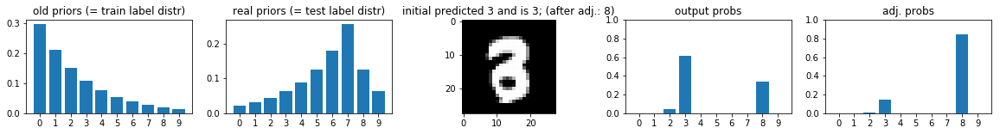

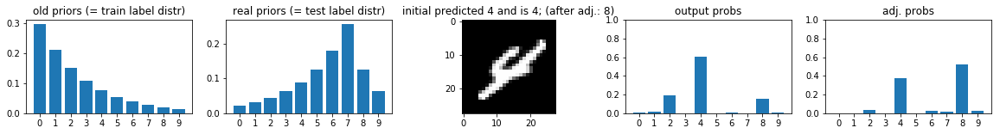

Old accuracy: 0.960 (2881/3000)
New accuracy: 0.969 (2907/3000)
#wrong_predicted_corrected_by_adj = 33
#correct_predicted_disturbed_by_adj = 7


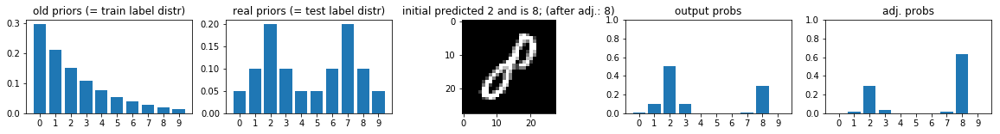

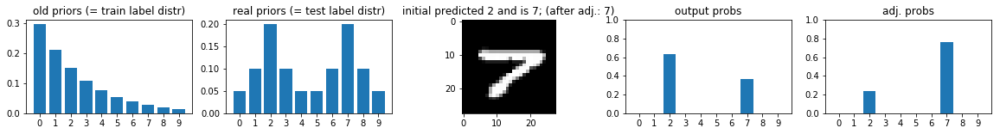

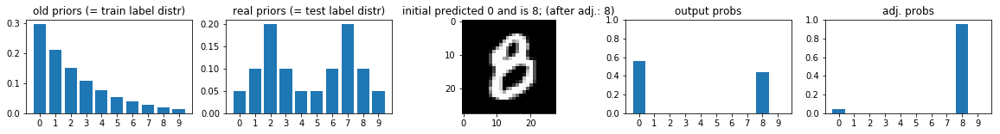

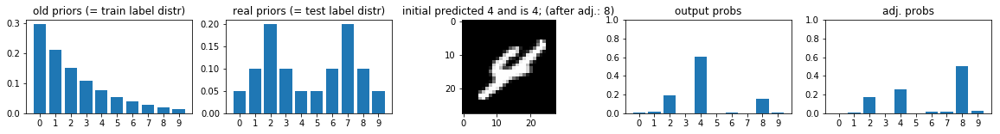

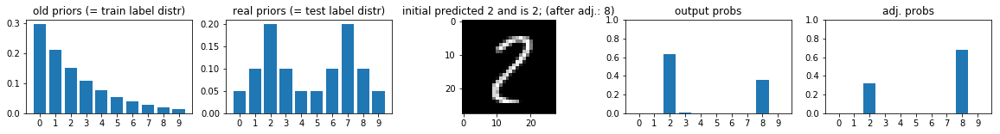

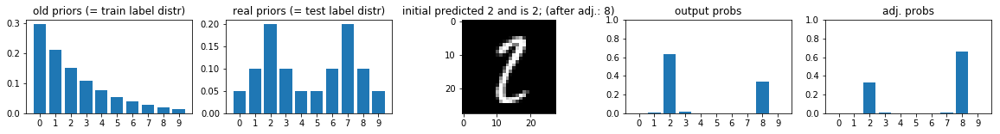

Old accuracy: 0.960 (2879/3000)
New accuracy: 0.970 (2911/3000)
#wrong_predicted_corrected_by_adj = 40
#correct_predicted_disturbed_by_adj = 8


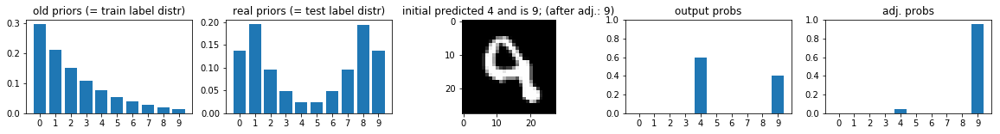

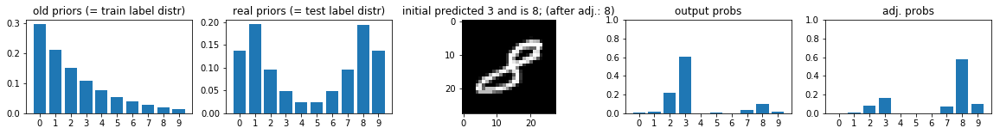

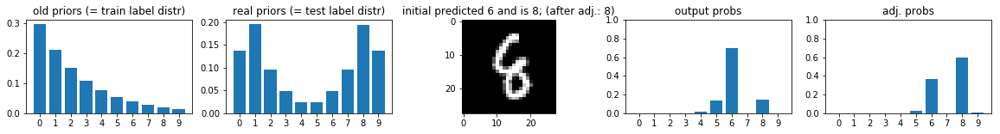

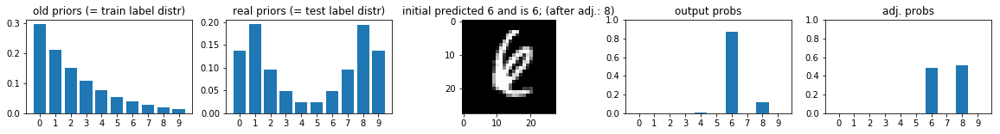

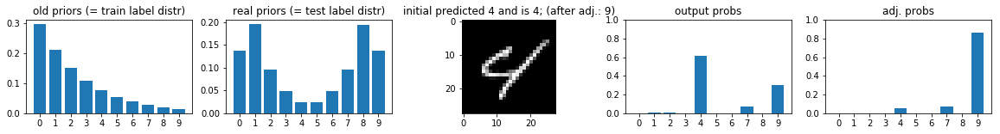

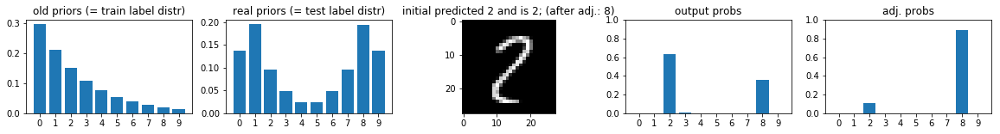

Old accuracy: 0.937 (2811/3000)
New accuracy: 0.959 (2876/3000)
#wrong_predicted_corrected_by_adj = 78
#correct_predicted_disturbed_by_adj = 13


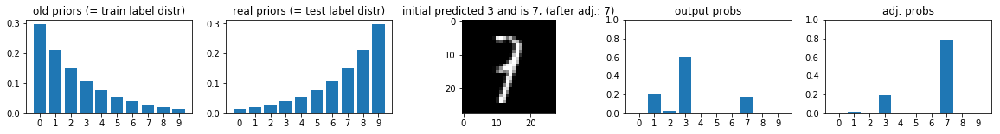

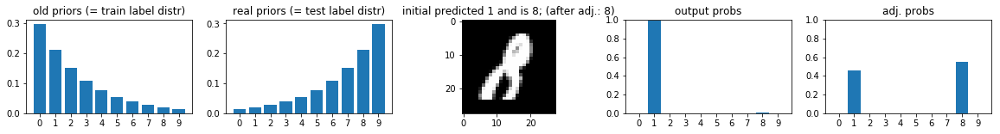

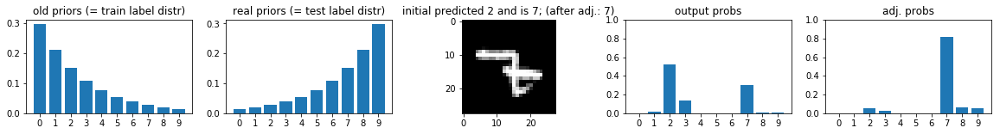

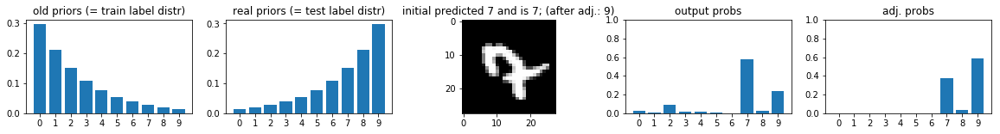

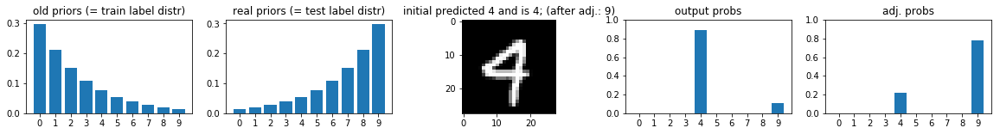

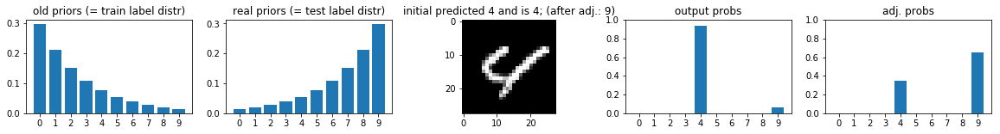

Old accuracy: 0.985 (2955/3000)
New accuracy: 0.985 (2955/3000)
#wrong_predicted_corrected_by_adj = 0
#correct_predicted_disturbed_by_adj = 0


In [44]:
MAX_IMAGES_TO_DISPLAY_PER_MODEL = 3
WORK_DIR = "./results/PriorProbabilityShift_experiment_5_10000samples/"
# WORK_DIR = "./results/PriorProbabilityShift_experiment_5_5000samples/"

ckpt_file_list = Utils.get_all_files_from_dir_ending_with(WORK_DIR, "ckpt.meta", without_file_extension=True)

for idx_model, ckpt_file in enumerate(ckpt_file_list):
    print('Restoring model {}{} {}'.format(WORK_DIR, idx_model, ckpt_file))
    test_model = Lenet5(mnist_dataset=mnist_ds, verbose=False)
    test_model.restore_session(ckpt_dir=WORK_DIR, ckpt_filename=ckpt_file)
    test_model_train_distr = test_model.session.run(test_model.train_distr)
#     print('The restored model was trained using distr: {}\n'.format(test_model_train_distr))
    
    for idx_distr, distr in enumerate(distrs_used_for_training):
        if (test_model_train_distr == distr).all():
            continue
#         print('Train distr: {}'.format(test_model_train_distr))
#         print('Test distr: {}'.format(distr))
        
        mnist_ds = MNISTDataset(MNIST_TRAIN_IMAGES_FILEPATH, MNIST_TRAIN_LABELS_FILEPATH, MNIST_TEST_IMAGES_FILEPATH, MNIST_TEST_LABELS_FILEPATH)
        mnist_ds.impose_distribution(weights=distr, global_max_weight=np.max(distrs_used_for_training))
        test_loss, test_acc, total_predict, total_actual, wrong_predict_images, output_probs = test_model.test_data(mnist_ds.test, use_only_one_batch=True)
        correct_predict = total_predict[total_actual == total_predict]
        wrong_predict = total_predict[total_actual != total_predict]
        wrong_actual = total_actual[total_actual != total_predict]

        # adjust the outputs
        real_priors = mnist_ds.test.label_distr
        old_priors = test_model_train_distr
#         print('real priors = {}'.format(real_priors))
#         print('old prios   = {}'.format(old_priors))
        adj_output_probs = (real_priors / old_priors) * output_probs / (np.sum((real_priors / old_priors) * output_probs, axis = 1)[:, None])
        adj_total_predict = np.argmax(adj_output_probs, axis=1).astype(np.int32)
        count_correct_predicted = np.sum(total_predict == total_actual)
        print('Old accuracy: {:.3f} ({}/{})'.format(count_correct_predicted / mnist_ds.test.num_examples, count_correct_predicted, mnist_ds.test.num_examples))
        count_correct_predicted = np.sum(adj_total_predict == total_actual)
        print('New accuracy: {:.3f} ({}/{})'.format(count_correct_predicted / mnist_ds.test.num_examples, count_correct_predicted, mnist_ds.test.num_examples))
        
        adj_test_acc = np.sum(adj_total_predict == total_actual) / len(adj_total_predict)
        adj_correct_predict = adj_total_predict[total_actual == adj_total_predict]
        adj_wrong_predict = adj_total_predict[total_actual != adj_total_predict]
        adj_wrong_actual = total_actual[total_actual != adj_total_predict]
        
        indices_wrong_predicted_corrected_by_adj = np.where(np.logical_and((total_actual != total_predict), (total_actual == adj_total_predict)) == True)[0]
        indices_correct_predicted_disturbed_by_adj = np.where(np.logical_and((total_actual == total_predict), (total_actual != adj_total_predict)) == True)[0]
        print('#wrong_predicted_corrected_by_adj = {}'.format(indices_wrong_predicted_corrected_by_adj.shape[0]))
        print('#correct_predicted_disturbed_by_adj = {}'.format(indices_correct_predicted_disturbed_by_adj.shape[0]))
        if indices_wrong_predicted_corrected_by_adj.shape[0] > MAX_IMAGES_TO_DISPLAY_PER_MODEL:
            indices_wrong_predicted_corrected_by_adj = indices_wrong_predicted_corrected_by_adj[0:MAX_IMAGES_TO_DISPLAY_PER_MODEL]
        if indices_correct_predicted_disturbed_by_adj.shape[0] > MAX_IMAGES_TO_DISPLAY_PER_MODEL:
            indices_correct_predicted_disturbed_by_adj = indices_correct_predicted_disturbed_by_adj[0:MAX_IMAGES_TO_DISPLAY_PER_MODEL]
        for idx in np.concatenate((indices_wrong_predicted_corrected_by_adj, indices_correct_predicted_disturbed_by_adj)):
#             print('output probs: {}'.format(output_probs[idx]))
#             print('adj. probs: {}'.format(adj_output_probs[idx]))

            count_figures = 5
            fig = plt.figure(figsize=(20, 2))

            k = 1
            plt.subplot(1, count_figures, k)
            plt.bar(range(10), old_priors)
            plt.xticks(range(0, 10))
            plt.title('old priors (= train label distr)')

            k+=1
            plt.subplot(1, count_figures, k)
            plt.bar(range(10), real_priors)
            plt.xticks(range(0, 10))
            plt.title('real priors (= test label distr)')

            k += 1
            plt.subplot(1, count_figures, k)
            plt.imshow(mnist_ds.test.images[idx].reshape((28,28)), cmap='gray')
            plt.title('initial predicted {} and is {}; (after adj.: {})'.format(total_predict[idx], total_actual[idx], adj_total_predict[idx]))

            k += 1
            plt.subplot(1, count_figures, k)
            plt.bar(range(10), output_probs[idx])
            plt.xticks(range(0, 10))
            plt.title('output probs')
            axes = plt.gca()
            axes.set_ylim([0,1])

            k+=1
            plt.subplot(1, count_figures, k)
            plt.bar(range(10), adj_output_probs[idx])
            plt.xticks(range(0, 10))
            plt.title('adj. probs')
            axes = plt.gca()
            axes.set_ylim([0,1])

            plt.show()

# TO DO. Adaptation using estimated priors